## [Dataset 1 (BUSI) ](https://huggingface.co/datasets/gymprathap/Breast-Cancer-Ultrasound-Images-Dataset)

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import glob
import pandas as pd

# Define your dataset path
DATASET1_DIR = '/content/drive/MyDrive/Dataset_BUSI_with_GT'  # Make sure this path is correct in your Colab
CLASSES = ['benign', 'malignant', 'normal']

def analyze_busi_data(root_dir):
    summary_stats = []
    multiple_mask_count = 0
    total_images = 0

    print(f"📂 Analyzing dataset at: {root_dir}\n")

    for class_name in CLASSES:
        class_path = os.path.join(root_dir, class_name)

        if not os.path.exists(class_path):
            print(f"⚠️ Warning: Folder '{class_name}' not found at {class_path}")
            continue

        # Get all files in the folder
        all_files = os.listdir(class_path)

        # 1. Identify Original Images (Filter out masks)
        # Logic: Images do NOT contain '_mask' in their name
        original_images = [f for f in all_files if '_mask' not in f and f.endswith('.png')]
        original_images.sort()

        # 2. Count Masks for each Image
        class_multi_masks = 0

        for img_file in original_images:
            base_name = img_file.replace('.png', '')

            # Find all matching masks for this specific image
            # Pattern: matches "benign (1)_mask.png", "benign (1)_mask_1.png", etc.
            # We construct a search path using glob for safety
            search_pattern = os.path.join(class_path, f"{glob.escape(base_name)}_mask*.png")
            found_masks = glob.glob(search_pattern)

            num_masks = len(found_masks)

            if num_masks > 1:
                class_multi_masks += 1
                multiple_mask_count += 1
                # Optional: Print first few examples of multi-mask files
                if multiple_mask_count <= 3:
                    print(f"   ℹ️ Multi-mask found: {img_file} has {num_masks} masks")

            if num_masks == 0:
                print(f"   ⚠️ ALERT: Image {img_file} has NO masks!")

        # 3. Store Stats
        summary_stats.append({
            'Class': class_name,
            'Total Images': len(original_images),
            'Images with >1 Mask': class_multi_masks
        })
        total_images += len(original_images)

    # Convert to DataFrame for nice printing
    df_stats = pd.DataFrame(summary_stats)

    print("\n" + "="*40)
    print("📊 DATASET SUMMARY")
    print("="*40)
    print(df_stats.to_string(index=False))
    print("-" * 40)
    print(f"Total Images: {total_images}")
    print(f"Total Instances with Multiple Masks: {multiple_mask_count}")
    print("="*40)

# Run the analysis
analyze_busi_data(DATASET1_DIR)

📂 Analyzing dataset at: /content/drive/MyDrive/Dataset_BUSI_with_GT

   ℹ️ Multi-mask found: benign (100).png has 2 masks
   ℹ️ Multi-mask found: benign (163).png has 2 masks
   ℹ️ Multi-mask found: benign (173).png has 2 masks

📊 DATASET SUMMARY
    Class  Total Images  Images with >1 Mask
   benign           437                   16
malignant           210                    1
   normal           133                    0
----------------------------------------
Total Images: 780
Total Instances with Multiple Masks: 17


🔬 STARTING DEEP INSPECTION...

📸 FOUND MULTI-MASK CASE: benign (100).png
   Found 2 mask files.
   🕵️ Mask 'benign (100)_mask_1.png' unique values: [  0 255]
   🕵️ Mask 'benign (100)_mask.png' unique values: [  0 255]


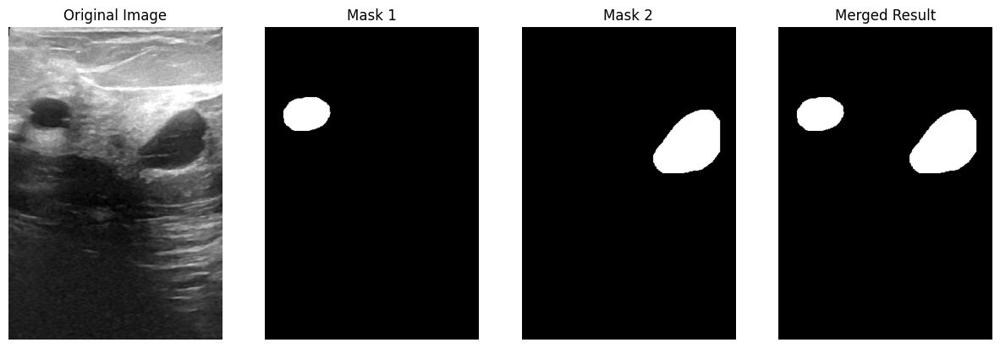


📏 CHECKING IMAGE DIMENSIONS (First 100 images)...
   Average Size: 494x597
   Max Aspect Ratio (W/H): 1.67
   Min Aspect Ratio (W/H): 0.66
   ✅ Aspect ratios are reasonable. Standard Resize is safe.


In [ ]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
import glob
import os

# --- Configuration ---

def inspect_data_quality(root_dir):
    print("🔬 STARTING DEEP INSPECTION...\n")

    # --- CHECK 1: FIND & VISUALIZE A MULTI-MASK CASE ---
    found_example = False

    # Search specifically in benign/malignant for a case with multiple masks
    for class_name in ['benign', 'malignant']:
        if found_example: break

        path = os.path.join(root_dir, class_name)
        images = [f for f in os.listdir(path) if '_mask' not in f]

        for img_name in images:
            base = img_name.replace('.png', '')
            # Find all masks for this image
            masks = glob.glob(os.path.join(path, f"{glob.escape(base)}_mask*.png"))

            if len(masks) > 1:
                print(f"📸 FOUND MULTI-MASK CASE: {img_name}")
                print(f"   Found {len(masks)} mask files.")

                # Load Image
                img = cv2.imread(os.path.join(path, img_name))
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

                # Load Masks
                mask_images = []
                for m_path in masks:
                    m = cv2.imread(m_path, cv2.IMREAD_GRAYSCALE)
                    mask_images.append(m)

                    # --- CHECK 2: PIXEL VALUES ---
                    unique_vals = np.unique(m)
                    print(f"   🕵️ Mask '{os.path.basename(m_path)}' unique values: {unique_vals}")
                    if len(unique_vals) > 2:
                        print("   ⚠️ WARNING: Mask is NOT strictly binary (has gray edges).")

                # Plotting
                plt.figure(figsize=(15, 5))

                # Plot Original
                plt.subplot(1, len(masks) + 2, 1)
                plt.imshow(img)
                plt.title("Original Image")
                plt.axis("off")

                # Plot Separate Masks
                combined = np.zeros_like(mask_images[0])
                for i, m in enumerate(mask_images):
                    plt.subplot(1, len(masks) + 2, i + 2)
                    plt.imshow(m, cmap='gray')
                    plt.title(f"Mask {i+1}")
                    plt.axis("off")
                    combined = np.maximum(combined, m)

                # Plot Merged
                plt.subplot(1, len(masks) + 2, len(masks) + 2)
                plt.imshow(combined, cmap='gray')
                plt.title("Merged Result")
                plt.axis("off")

                plt.show()
                found_example = True
                break

    if not found_example:
        print("ℹ️ No multi-mask images found to visualize.")

    # --- CHECK 3: RESOLUTION & ASPECT RATIO ---
    print("\n📏 CHECKING IMAGE DIMENSIONS (First 100 images)...")
    widths = []
    heights = []
    ratios = []

    # Check a sample of images to save time
    all_images = glob.glob(os.path.join(root_dir, '**', '*.png'), recursive=True)
    # Filter out masks
    img_files = [f for f in all_images if '_mask' not in f][:100]

    for f in img_files:
        img = cv2.imread(f)
        h, w = img.shape[:2]
        widths.append(w)
        heights.append(h)
        ratios.append(w/h)

    print(f"   Average Size: {int(np.mean(heights))}x{int(np.mean(widths))}")
    print(f"   Max Aspect Ratio (W/H): {max(ratios):.2f}")
    print(f"   Min Aspect Ratio (W/H): {min(ratios):.2f}")

    if max(ratios) > 2.0 or min(ratios) < 0.5:
        print("   ⚠️ NOTE: Some images are very rectangular. 'Resize' may distort shapes.")
        print("   💡 CONSIDER: Using 'PadIfNeeded' before resizing in Albumentations.")
    else:
        print("   ✅ Aspect ratios are reasonable. Standard Resize is safe.")

inspect_data_quality(DATASET1_DIR)

In [ ]:
import os
import glob
import numpy as np
import pandas as pd
from PIL import Image
from tqdm import tqdm

# --- CONFIG ---
DEST_DIR = '/content/drive/MyDrive/DL_Datasets/Processed_BUSI'   # Where clean data will be saved
LABEL_MAP = {"benign": 0, "malignant": 1, "normal": 2}

def process_and_save_dataset(source, dest):
    # 1. Create Destination Folders
    os.makedirs(os.path.join(dest, "images"), exist_ok=True)
    os.makedirs(os.path.join(dest, "masks"), exist_ok=True)

    records = []

    print(f"🚀 Starting Preprocessing...")
    print(f"📂 Source: {source}")
    print(f"📂 Destination: {dest}")

    # 2. Walk through the raw folders
    for class_name, label_id in LABEL_MAP.items():
        class_path = os.path.join(source, class_name)
        if not os.path.exists(class_path):
            print(f"⚠️ Warning: Folder {class_name} not found.")
            continue

        print(f"🔄 Processing class: {class_name}...")

        # Get all original images (filter out masks)
        all_files = os.listdir(class_path)
        img_files = [f for f in all_files if "_mask" not in f and f.endswith(".png")]

        for img_name in tqdm(img_files):
            base_name = img_name.replace(".png", "")

            # --- PATHS ---
            src_img_path = os.path.join(class_path, img_name)
            # New unique filename: "benign_10.png"
            new_filename = f"{class_name}_{base_name}.png"

            dst_img_path = os.path.join(dest, "images", new_filename)
            dst_mask_path = os.path.join(dest, "masks", new_filename)

            # --- STEP A: PROCESS IMAGE (3-Channel Grayscale) ---
            # 1. convert("L") -> Force strict grayscale (1 channel)
            # 2. convert("RGB") -> Duplicate to 3 channels (R=G=B)
            img = Image.open(src_img_path).convert("L").convert("RGB")
            img.save(dst_img_path)

            # --- STEP B: MERGE MASKS ---
            mask_search_name = f"{base_name}_mask"
            associated_masks = [
                os.path.join(class_path, f)
                for f in all_files
                if f.startswith(mask_search_name)
            ]

            # Create canvas based on image size
            combined_mask_arr = np.zeros((img.height, img.width), dtype=np.uint8)

            if len(associated_masks) > 0:
                for m_file in associated_masks:
                    # Load Mask (Strictly 1-Channel)
                    m = Image.open(m_file).convert("L")
                    m_arr = np.array(m)

                    # Safety Resize (some BUSI masks are off by 1 pixel)
                    if m_arr.shape != (img.height, img.width):
                        m = m.resize((img.width, img.height), Image.NEAREST)
                        m_arr = np.array(m)

                    # Logical OR (Merge)
                    combined_mask_arr = np.maximum(combined_mask_arr, m_arr)

            # --- STEP C: BINARIZE & SAVE MASK ---
            # Ensure strictly 0 or 255 (Binary)
            # 1-Channel mode ("L") is correct for masks
            combined_mask_arr = np.where(combined_mask_arr > 0, 255, 0).astype(np.uint8)
            final_mask = Image.fromarray(combined_mask_arr, mode="L")
            final_mask.save(dst_mask_path)

            # --- STEP D: LOG METADATA ---
            records.append({
                "image_id": new_filename,
                "image_path": dst_img_path,
                "mask_path": dst_mask_path,
                "class_name": class_name,
                "label": label_id
            })

    # 3. Save CSV
    df = pd.DataFrame(records)
    csv_path = os.path.join(dest, "metadata.csv")
    df.to_csv(csv_path, index=False)

    print(f"\n✅ SUCCESS! Processed dataset saved to: {dest}")
    print(f"📊 Total Images: {len(df)}")
    print(f"📝 Metadata saved to: {csv_path}")
    return df

# Execute the processing
df_clean = process_and_save_dataset(DATASET1_DIR, DEST_DIR)

🚀 Starting Preprocessing...
📂 Source: /content/drive/MyDrive/Dataset_BUSI_with_GT
📂 Destination: /content/drive/MyDrive/DL_Datasets/Processed_BUSI
🔄 Processing class: benign...


  0%|          | 0/437 [00:00<?, ?it/s]/tmp/ipython-input-42801357.py:82: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  final_mask = Image.fromarray(combined_mask_arr, mode="L")
100%|██████████| 437/437 [01:31<00:00,  4.77it/s]


🔄 Processing class: malignant...


100%|██████████| 210/210 [00:40<00:00,  5.15it/s]


🔄 Processing class: normal...


100%|██████████| 133/133 [00:27<00:00,  4.91it/s]


✅ SUCCESS! Processed dataset saved to: /content/drive/MyDrive/DL_Datasets/Processed_BUSI
📊 Total Images: 780
📝 Metadata saved to: /content/drive/MyDrive/DL_Datasets/Processed_BUSI/metadata.csv


## Dataset 2 (BUS-UCLM)

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
from PIL import Image
from tqdm import tqdm

# --- CONFIG ---
# Your Paths
DATASET2_DIR = "/content/drive/MyDrive/BUS-UCLM"
DEST_DIR = "/content/drive/MyDrive/DL_Datasets/Processed_UCLM"
LABEL_MAP = {"benign": 0, "malignant": 1, "normal": 2}

def process_uclm_direct_match(source, dest):
    # 1. Define input/output paths
    img_dir_src = os.path.join(source, "images")
    mask_dir_src = os.path.join(source, "masks")

    os.makedirs(os.path.join(dest, "images"), exist_ok=True)
    os.makedirs(os.path.join(dest, "masks"), exist_ok=True)

    records = []

    print(f"🚀 Starting UCLM Processing (Direct Match Mode)...")
    print(f"📂 Looking for images in: {img_dir_src}")

    # 2. Get list of all images
    # We filter for common image extensions
    valid_exts = ('.png', '.jpg', '.jpeg', '.bmp')
    img_files = [f for f in os.listdir(img_dir_src) if f.lower().endswith(valid_exts)]

    print(f"🔍 Found {len(img_files)} images. Matching with masks...")

    for filename in tqdm(img_files):
        # --- PATHS ---
        src_img_path = os.path.join(img_dir_src, filename)
        src_mask_path = os.path.join(mask_dir_src, filename) # Exact same name!

        # Check if mask exists
        if not os.path.exists(src_mask_path):
            # Sometimes mask might be .png while image is .jpg?
            # Let's try forcing .png for the mask just in case
            base_name = os.path.splitext(filename)[0]
            src_mask_path = os.path.join(mask_dir_src, base_name + ".png")

            if not os.path.exists(src_mask_path):
                print(f"⚠️ Warning: Mask not found for {filename}. Skipping.")
                continue

        # --- SETUP DESTINATION ---
        # "UCLM_ALWI_000.png"
        new_filename = f"UCLM_{filename}"
        # Ensure destination is always PNG for consistency
        new_filename = os.path.splitext(new_filename)[0] + ".png"

        dst_img_path = os.path.join(dest, "images", new_filename)
        dst_mask_path = os.path.join(dest, "masks", new_filename)

        # --- DETERMINE CLASS (RGB Logic) ---
        # Load mask as RGB
        mask_rgb = cv2.imread(src_mask_path)
        if mask_rgb is None: continue
        mask_rgb = cv2.cvtColor(mask_rgb, cv2.COLOR_BGR2RGB)

        # Count Colors
        # Green (0,255,0) -> Benign
        # Red (255,0,0) -> Malignant
        # We use a threshold of 100 to be safe
        green_pixels = np.sum((mask_rgb[:,:,1] > 100) & (mask_rgb[:,:,0] < 100))
        red_pixels = np.sum((mask_rgb[:,:,0] > 100) & (mask_rgb[:,:,1] < 100))

        final_class = "normal"
        if red_pixels > 50:
            final_class = "malignant"
        elif green_pixels > 50:
            final_class = "benign"
        else:
            final_class = "normal"

        label_id = LABEL_MAP[final_class]

        # --- SAVE IMAGE (Standardized) ---
        # 1-Channel Grayscale -> 3-Channel RGB
        img = Image.open(src_img_path).convert("L").convert("RGB")
        img.save(dst_img_path)

        # --- SAVE MASK (Binarized) ---
        # Convert RGB Mask -> 1-Channel Grayscale -> Binary (0 or 255)
        mask_gray = cv2.cvtColor(mask_rgb, cv2.COLOR_RGB2GRAY)
        # Anything not black is tumor
        mask_bin = np.where(mask_gray > 20, 255, 0).astype(np.uint8)

        final_mask = Image.fromarray(mask_bin, mode="L")
        final_mask.save(dst_mask_path)

        # --- LOG METADATA ---
        records.append({
            "image_id": new_filename,
            "image_path": dst_img_path,
            "mask_path": dst_mask_path,
            "class_name": final_class,
            "label": label_id,
            "source": "UCLM"
        })

    # 3. Save CSV
    if records:
        df = pd.DataFrame(records)
        csv_path = os.path.join(dest, "metadata.csv")
        df.to_csv(csv_path, index=False)
        print(f"\n✅ Done! Processed {len(df)} images.")
        print(f"📂 Saved to: {dest}")
        print(f"📊 Class Distribution:\n{df['class_name'].value_counts()}")
        return df
    else:
        print("\n❌ No images processed. Please check your folder names.")
        return pd.DataFrame()

# Run it
df_uclm = process_uclm_direct_match(DATASET2_DIR, DEST_DIR)

🚀 Starting UCLM Processing (Direct Match Mode)...
📂 Looking for images in: /content/drive/MyDrive/BUS-UCLM/images
🔍 Found 682 images. Matching with masks...


  0%|          | 0/682 [00:00<?, ?it/s]/tmp/ipython-input-1013119788.py:93: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  final_mask = Image.fromarray(mask_bin, mode="L")
100%|██████████| 682/682 [10:01<00:00,  1.13it/s]


✅ Done! Processed 682 images.
📂 Saved to: /content/drive/MyDrive/DL_Datasets/Processed_UCLM
📊 Class Distribution:
class_name
normal       419
benign       174
malignant     89
Name: count, dtype: int64



MEDICAL IMAGE ARTIFACT COLLISION DETECTOR

⚙️  Configuration:
  Dataset path: /content/drive/MyDrive/DL_Datasets/Processed_UCLM
  To change path, update Config.DATASET_PATH in the script

Proceed with analysis? (y/n): y

BODY MARKER ARTIFACT COLLISION DETECTION
Dataset: /content/drive/MyDrive/DL_Datasets/Processed_UCLM
Detection zone: Bottom 20% height, Right 30% width
Artifact threshold: 200/255

Found 682 images to analyze



Analyzing images: 100%|██████████| 682/682 [00:31<00:00, 21.82it/s]



ANALYSIS SUMMARY

📊 Dataset Statistics:
  • Total images analyzed: 682
  • Artifacts detected: 680 (99.7%)
  • No artifacts found: 2 (using default crop line)

⚠️  Collision Analysis:
  • COLLISIONS DETECTED: 5
  • Risk level: HIGH - Cropping would remove tumor tissue!

  Affected images:
    1. UCLM_CHSP_010.png - 5323 pixels at risk
    2. UCLM_FUHI_000.png - 5777 pixels at risk
    3. UCLM_FUHI_003.png - 6834 pixels at risk
    4. UCLM_FUHI_004.png - 15619 pixels at risk
    5. UCLM_PLBA_013.png - 19509 pixels at risk

✅ Safe to Crop:
  • 675 images can be safely cropped

📈 Collision Statistics:
  • Min pixels at risk: 5323
  • Max pixels at risk: 19509
  • Average pixels at risk: 10612.4


💡 RECOMMENDATION:
  ⚠️  CAUTION: Manual review recommended for collision cases.
  ⚠️  Consider excluding these samples or manual crop adjustment.


🔍 Generating collision visualizations...

⚠️  Displaying 5 collision cases:


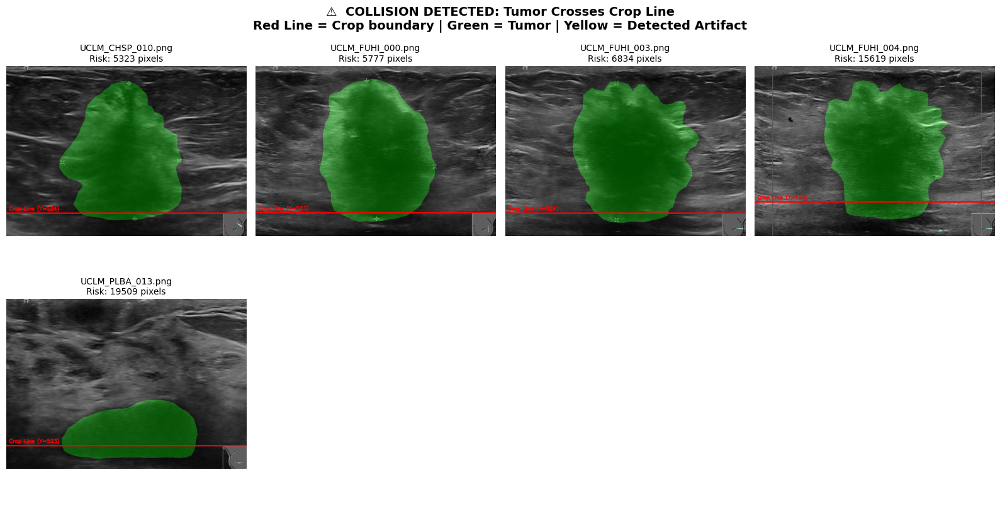

KeyboardInterrupt: Interrupted by user

In [ ]:
"""
Body Marker Artifact Collision Detector for Medical Ultrasound Images
=====================================================================
Safety Audit Script: Detects body marker artifacts (white boxes/text) in
ultrasound images and checks if cropping them would accidentally remove tumor tissue.

Author: Senior CV Engineer
Purpose: Pre-cropping risk assessment for Processed_BUSI dataset
"""

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from typing import Tuple, List, Dict, Optional
from tqdm import tqdm

# ================================
# CONFIGURATION
# ================================
class Config:
    # Dataset path
    DATASET_PATH = '/content/drive/MyDrive/DL_Datasets/Processed_UCLM'  # Update if needed

    # Artifact detection parameters
    ARTIFACT_REGION_HEIGHT = 0.20  # Bottom 20% of image height
    ARTIFACT_REGION_WIDTH = 0.30   # Right 30% of image width
    ARTIFACT_THRESHOLD = 200       # Bright white pixels (0-255)

    # Fallback crop line if no artifact detected
    DEFAULT_CROP_RATIO = 0.90      # Crop at 90% height (keep top 90%)

    # Visualization parameters
    MAX_DISPLAY_COLS = 4           # Grid columns for visualization
    FIGURE_SIZE_PER_IMAGE = 4      # Size of each subplot


# ================================
# ARTIFACT DETECTION FUNCTIONS
# ================================
def detect_artifact_upper_edge(image: np.ndarray) -> Tuple[int, bool, np.ndarray]:
    """
    Detect the upper edge (minimum Y-coordinate) of body marker artifact.

    Algorithm:
    1. Focus on bottom-right quadrant
    2. Find bright white pixels (>200 intensity)
    3. Return the highest point (minimum Y) of these pixels

    Args:
        image: RGB or Grayscale image (H, W, 3) or (H, W)

    Returns:
        Tuple of (upper_edge_y, artifact_detected, detection_mask)
        - upper_edge_y: Y-coordinate of artifact's upper edge
        - artifact_detected: Whether artifact was found
        - detection_mask: Binary mask showing detected artifact pixels
    """
    h, w = image.shape[:2]

    # Convert to grayscale if needed
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image.copy()

    # Define region of interest (bottom-right quadrant)
    roi_y_start = int(h * (1 - Config.ARTIFACT_REGION_HEIGHT))
    roi_x_start = int(w * (1 - Config.ARTIFACT_REGION_WIDTH))

    # Extract ROI
    roi = gray[roi_y_start:, roi_x_start:]

    # Threshold to find bright white pixels (body marker artifacts)
    _, artifact_mask = cv2.threshold(
        roi,
        Config.ARTIFACT_THRESHOLD,
        255,
        cv2.THRESH_BINARY
    )

    # Find artifact pixels coordinates
    artifact_coords = np.where(artifact_mask > 0)

    # Create full-size detection mask for visualization
    full_detection_mask = np.zeros((h, w), dtype=np.uint8)

    if len(artifact_coords[0]) > 0:
        # Artifact detected
        # Find the minimum Y (highest point in the ROI)
        min_y_in_roi = np.min(artifact_coords[0])

        # Convert to full image coordinates
        upper_edge_y = roi_y_start + min_y_in_roi

        # Mark detected artifact in full mask
        full_detection_mask[roi_y_start:, roi_x_start:] = artifact_mask

        return upper_edge_y, True, full_detection_mask
    else:
        # No artifact detected - use default safe crop line
        default_crop_y = int(h * Config.DEFAULT_CROP_RATIO)
        return default_crop_y, False, full_detection_mask


def check_mask_collision(mask: np.ndarray, crop_line_y: int) -> Tuple[bool, int]:
    """
    Check if tumor mask extends below the proposed crop line.

    Args:
        mask: Binary mask (H, W), white pixels = tumor tissue
        crop_line_y: Y-coordinate of proposed crop line

    Returns:
        Tuple of (collision_detected, num_pixels_below)
        - collision_detected: Whether tumor pixels exist below crop line
        - num_pixels_below: Count of tumor pixels that would be lost
    """
    # Extract region below crop line
    region_below = mask[crop_line_y:, :]

    # Count white pixels (tumor tissue) in this region
    tumor_pixels_below = np.sum(region_below > 127)  # Binary threshold

    collision_detected = tumor_pixels_below > 0

    return collision_detected, tumor_pixels_below


# ================================
# DATASET ANALYSIS FUNCTION
# ================================
def analyze_dataset(dataset_path: str) -> Dict:
    """
    Analyze entire dataset for artifact-tumor collisions.

    Args:
        dataset_path: Path to Processed_BUSI folder

    Returns:
        Dictionary containing analysis results
    """
    print("\n" + "="*70)
    print("BODY MARKER ARTIFACT COLLISION DETECTION")
    print("="*70)
    print(f"Dataset: {dataset_path}")
    print(f"Detection zone: Bottom {Config.ARTIFACT_REGION_HEIGHT*100:.0f}% height, "
          f"Right {Config.ARTIFACT_REGION_WIDTH*100:.0f}% width")
    print(f"Artifact threshold: {Config.ARTIFACT_THRESHOLD}/255")
    print("="*70 + "\n")

    # Find all images
    images_dir = os.path.join(dataset_path, 'images')
    masks_dir = os.path.join(dataset_path, 'masks')

    if not os.path.exists(images_dir) or not os.path.exists(masks_dir):
        raise FileNotFoundError(
            f"Could not find images/ or masks/ in {dataset_path}\n"
            f"Expected structure: {dataset_path}/images/, {dataset_path}/masks/"
        )

    # Get all image files
    image_files = sorted([f for f in os.listdir(images_dir)
                         if f.endswith(('.png', '.jpg', '.jpeg'))])

    print(f"Found {len(image_files)} images to analyze\n")

    # Initialize results tracking
    results = {
        'total_images': len(image_files),
        'artifacts_detected': 0,
        'collisions': [],
        'safe_crops': [],
        'no_artifact_detected': []
    }

    # Analyze each image
    for img_filename in tqdm(image_files, desc="Analyzing images"):
        # Load image
        img_path = os.path.join(images_dir, img_filename)
        image = cv2.imread(img_path)

        if image is None:
            print(f"⚠️  Failed to load {img_filename}, skipping...")
            continue

        # Find corresponding mask
        # Assuming mask naming convention: image.png -> image_mask.png
        mask_filename = img_filename.replace('.png', '_mask.png')
        mask_path = os.path.join(masks_dir, mask_filename)

        if not os.path.exists(mask_path):
            # Try alternative naming
            mask_filename = img_filename.replace('.jpg', '_mask.png').replace('.jpeg', '_mask.png')
            mask_path = os.path.join(masks_dir, mask_filename)

        if not os.path.exists(mask_path):
            print(f"⚠️  No mask found for {img_filename}, skipping...")
            continue

        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        if mask is None:
            print(f"⚠️  Failed to load mask for {img_filename}, skipping...")
            continue

        # Detect artifact upper edge
        crop_line_y, artifact_detected, detection_mask = detect_artifact_upper_edge(image)

        if artifact_detected:
            results['artifacts_detected'] += 1

        # Check for collision
        collision, pixels_below = check_mask_collision(mask, crop_line_y)

        # Store results
        sample_result = {
            'filename': img_filename,
            'mask_filename': mask_filename,
            'image': image,
            'mask': mask,
            'crop_line_y': crop_line_y,
            'artifact_detected': artifact_detected,
            'detection_mask': detection_mask,
            'collision': collision,
            'pixels_at_risk': pixels_below
        }

        if collision:
            results['collisions'].append(sample_result)
        elif artifact_detected:
            results['safe_crops'].append(sample_result)
        else:
            results['no_artifact_detected'].append(sample_result)

    return results


# ================================
# VISUALIZATION FUNCTIONS
# ================================
def create_overlay_visualization(image: np.ndarray, mask: np.ndarray,
                                 crop_line_y: int, detection_mask: np.ndarray) -> np.ndarray:
    """
    Create visualization with crop line and mask overlay.

    Args:
        image: Original image
        mask: Tumor mask
        crop_line_y: Y-coordinate of crop line
        detection_mask: Detected artifact pixels

    Returns:
        Visualization image
    """
    # Create RGB visualization
    vis = image.copy()
    h, w = vis.shape[:2]

    # Overlay tumor mask in green (semi-transparent)
    mask_colored = np.zeros_like(vis)
    mask_colored[:, :, 1] = mask  # Green channel
    vis = cv2.addWeighted(vis, 0.7, mask_colored, 0.3, 0)

    # Overlay detected artifact in yellow
    artifact_colored = np.zeros_like(vis)
    artifact_colored[:, :, 0] = detection_mask  # Blue
    artifact_colored[:, :, 1] = detection_mask  # Green (Blue + Green = Cyan/Yellow)
    vis = cv2.addWeighted(vis, 1.0, artifact_colored, 0.3, 0)

    # Draw red crop line
    cv2.line(vis, (0, crop_line_y), (w, crop_line_y), (0, 0, 255), 3)

    # Add text label
    cv2.putText(
        vis,
        f"Crop Line (Y={crop_line_y})",
        (10, crop_line_y - 10),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.6,
        (0, 0, 255),
        2
    )

    return vis


def visualize_collisions(results: Dict, max_display: int = 16):
    """
    Display grid of images with detected collisions.

    Args:
        results: Analysis results dictionary
        max_display: Maximum number of images to display
    """
    collisions = results['collisions'][:max_display]

    if len(collisions) == 0:
        print("\n✅ No collisions detected! Safe to crop all images.")
        return

    print(f"\n⚠️  Displaying {len(collisions)} collision cases:")

    # Calculate grid size
    n_cols = min(Config.MAX_DISPLAY_COLS, len(collisions))
    n_rows = int(np.ceil(len(collisions) / n_cols))

    # Create figure
    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(Config.FIGURE_SIZE_PER_IMAGE * n_cols,
                Config.FIGURE_SIZE_PER_IMAGE * n_rows)
    )

    if n_rows == 1 and n_cols == 1:
        axes = np.array([[axes]])
    elif n_rows == 1:
        axes = axes.reshape(1, -1)
    elif n_cols == 1:
        axes = axes.reshape(-1, 1)

    # Plot each collision
    for idx, collision_case in enumerate(collisions):
        row = idx // n_cols
        col = idx % n_cols
        ax = axes[row, col]

        # Create visualization
        vis = create_overlay_visualization(
            collision_case['image'],
            collision_case['mask'],
            collision_case['crop_line_y'],
            collision_case['detection_mask']
        )

        # Convert BGR to RGB for matplotlib
        vis_rgb = cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)

        # Display
        ax.imshow(vis_rgb)
        ax.set_title(
            f"{collision_case['filename']}\n"
            f"Risk: {collision_case['pixels_at_risk']} pixels",
            fontsize=10
        )
        ax.axis('off')

    # Hide unused subplots
    for idx in range(len(collisions), n_rows * n_cols):
        row = idx // n_cols
        col = idx % n_cols
        axes[row, col].axis('off')

    plt.tight_layout()
    plt.suptitle(
        "⚠️  COLLISION DETECTED: Tumor Crosses Crop Line\n"
        "Red Line = Crop boundary | Green = Tumor | Yellow = Detected Artifact",
        fontsize=14, fontweight='bold', y=1.02
    )
    plt.show()


def print_summary_report(results: Dict):
    """
    Print comprehensive analysis summary.

    Args:
        results: Analysis results dictionary
    """
    print("\n" + "="*70)
    print("ANALYSIS SUMMARY")
    print("="*70)

    print(f"\n📊 Dataset Statistics:")
    print(f"  • Total images analyzed: {results['total_images']}")
    print(f"  • Artifacts detected: {results['artifacts_detected']} "
          f"({results['artifacts_detected']/results['total_images']*100:.1f}%)")
    print(f"  • No artifacts found: {len(results['no_artifact_detected'])} "
          f"(using default crop line)")

    print(f"\n⚠️  Collision Analysis:")
    n_collisions = len(results['collisions'])
    print(f"  • COLLISIONS DETECTED: {n_collisions}")

    if n_collisions > 0:
        print(f"  • Risk level: HIGH - Cropping would remove tumor tissue!")
        print(f"\n  Affected images:")
        for i, case in enumerate(results['collisions'][:10], 1):
            print(f"    {i}. {case['filename']} - {case['pixels_at_risk']} pixels at risk")
        if n_collisions > 10:
            print(f"    ... and {n_collisions - 10} more")
    else:
        print(f"  • Risk level: SAFE - No tumor tissue would be lost")

    print(f"\n✅ Safe to Crop:")
    print(f"  • {len(results['safe_crops'])} images can be safely cropped")

    # Calculate statistics
    if n_collisions > 0:
        pixels_at_risk = [c['pixels_at_risk'] for c in results['collisions']]
        print(f"\n📈 Collision Statistics:")
        print(f"  • Min pixels at risk: {min(pixels_at_risk)}")
        print(f"  • Max pixels at risk: {max(pixels_at_risk)}")
        print(f"  • Average pixels at risk: {np.mean(pixels_at_risk):.1f}")

    print("\n" + "="*70)

    # Recommendation
    print("\n💡 RECOMMENDATION:")
    if n_collisions == 0:
        print("  ✅ SAFE to proceed with automated cropping.")
        print("  ✅ No tumor tissue will be lost.")
    elif n_collisions < results['total_images'] * 0.05:  # Less than 5%
        print("  ⚠️  CAUTION: Manual review recommended for collision cases.")
        print("  ⚠️  Consider excluding these samples or manual crop adjustment.")
    else:
        print("  ❌ HIGH RISK: Too many collisions detected.")
        print("  ❌ Recommend alternative cropping strategy or manual intervention.")

    print("="*70 + "\n")


# ================================
# MAIN EXECUTION
# ================================
def main():
    """
    Execute complete artifact collision detection pipeline.
    """
    try:
        # Run analysis
        results = analyze_dataset(Config.DATASET_PATH)

        # Print summary report
        print_summary_report(results)

        # Visualize collisions
        if len(results['collisions']) > 0:
            print("\n🔍 Generating collision visualizations...")
            visualize_collisions(results, max_display=16)

        # Optional: Show some safe examples
        response = input("\nShow examples of safe crops? (y/n): ").lower()
        if response == 'y' and len(results['safe_crops']) > 0:
            print("\n✅ Examples of safe crops (no collision):")
            # Temporarily replace collisions with safe crops for visualization
            safe_results = {'collisions': results['safe_crops'][:8]}

            visualize_collisions(safe_results, max_display=8)

    except Exception as e:
        print(f"\n❌ Error during analysis: {str(e)}")
        raise


if __name__ == "__main__":
    # Update dataset path if needed
    print("\n" + "="*70)
    print("MEDICAL IMAGE ARTIFACT COLLISION DETECTOR")
    print("="*70)
    print("\n⚙️  Configuration:")
    print(f"  Dataset path: {Config.DATASET_PATH}")
    print(f"  To change path, update Config.DATASET_PATH in the script")
    print("="*70)

    proceed = input("\nProceed with analysis? (y/n): ").lower()
    if proceed == 'y':
        main()
    else:
        print("Analysis cancelled.")

🚀 Applying Blackout to Artifact Box: (770, 520, 84, 83)
📂 Scanning: /content/drive/MyDrive/DL_Datasets/Processed_UCLM...



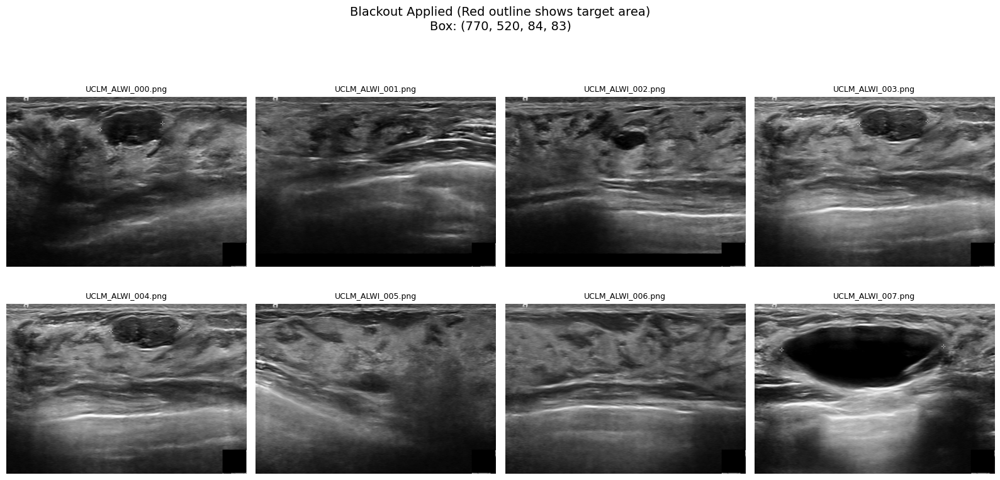

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple

# ================================
# CONFIGURATION
# ================================
# The detected box: (x, y, w, h)
ARTIFACT_BOX = (770, 520, 84, 83)
DATASET_PATH = '/content/drive/MyDrive/DL_Datasets/Processed_UCLM'

def apply_blackout(image: np.ndarray, box: Tuple[int, int, int, int]) -> np.ndarray:
    """
    Sets the pixels in the specified box region to pure black (0).
    """
    x, y, w, h = box

    # Create a copy to avoid modifying the original in memory
    processed_img = image.copy()

    # Set the rectangular region to black
    # Numpy slicing handles boundaries automatically (if box is slightly off-edge)
    processed_img[y:y+h, x:x+w, :] = 0

    return processed_img

def visualize_blackout_effect(dataset_path: str, box: Tuple[int, int, int, int], num_samples=8):
    """
    Applies blackout and displays the result.
    """
    images_dir = os.path.join(dataset_path, 'images')
    image_files = sorted([f for f in os.listdir(images_dir) if f.endswith('.png')])

    if not image_files:
        print("❌ No images found in directory.")
        return

    # Create plot grid
    cols = 4
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(16, 4 * rows))
    axes = axes.flatten()

    print(f"🚀 Applying Blackout to Artifact Box: {box}")
    print(f"📂 Scanning: {dataset_path}...\n")

    for i in range(num_samples):
        if i >= len(image_files): break

        # Load Image
        img_filename = image_files[i]
        img_path = os.path.join(images_dir, img_filename)
        image = cv2.imread(img_path)

        if image is None: continue

        # --- BLACKOUT ACTION ---
        result_image = apply_blackout(image, box)

        # --- VISUALIZATION ---
        # Convert BGR (OpenCV) to RGB (Matplotlib)
        display_img = cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB)

        axes[i].imshow(display_img)
        axes[i].set_title(f"{img_filename}", fontsize=9)
        axes[i].axis('off')

        # Draw a thin red outline where the box *was* just for verification
        # (Optional: remove this if you want to see pure black only)


    # Turn off unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.suptitle(f"Blackout Applied (Red outline shows target area)\nBox: {box}", fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    visualize_blackout_effect(DATASET_PATH, ARTIFACT_BOX)


GLOBAL CONSENSUS ARTIFACT DETECTION
Two-Phase Approach: Learn → Scan

⚙️  Configuration:
  Dataset path: /content/drive/MyDrive/DL_Datasets/Processed_UCLM
  Calibration samples: 50
  Consensus threshold: 50%
  To change settings, update Config class in the script

Proceed with analysis? (y/n): y

PHASE 1: CALIBRATION - Learning Artifact Position
📊 Using 50 images for calibration
   Corner region: Bottom 20% × Right 20%
   Consensus threshold: 50%



Sampling images: 100%|██████████| 50/50 [00:05<00:00,  8.70it/s]


✅ Artifact detected!
   Bounding box (x, y, w, h): (np.int64(772), np.int64(523), np.int64(84), np.int64(83))
   Coverage: 261 pixels
   Position: (772, 523) to (856, 606)

🔍 Visualizing learned artifact pattern...


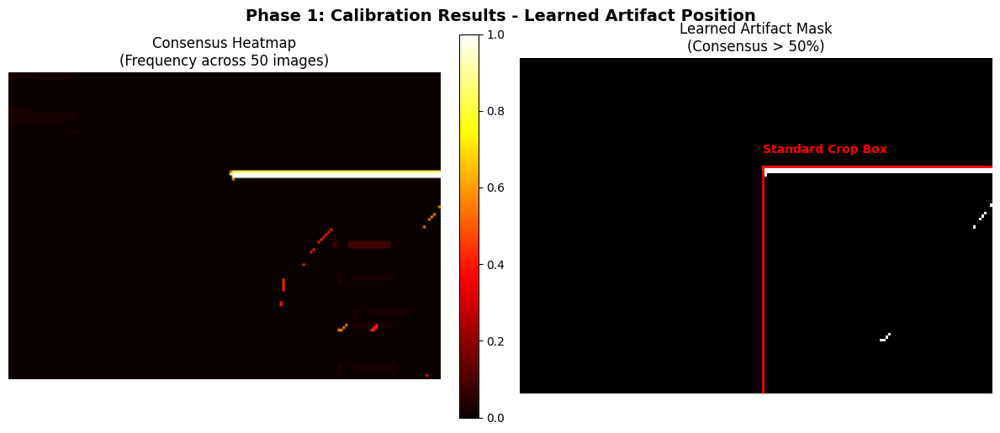


PHASE 2: COLLISION SCAN - Testing Against Standard Box
📦 Standard Artifact Box: (np.int64(772), np.int64(523), np.int64(84), np.int64(83))
   Scanning all masks for overlap...



Scanning for collisions: 100%|██████████| 682/682 [00:23<00:00, 28.66it/s]



ANALYSIS SUMMARY - Global Consensus Method

📊 Phase 1 - Calibration:
  • Samples analyzed: 50
  • Standard box detected: (np.int64(772), np.int64(523), np.int64(84), np.int64(83))

📊 Phase 2 - Collision Scan:
  • Total images scanned: 682
  • COLLISIONS DETECTED: 0
  • Safe images: 682


💡 RECOMMENDATION:
  ✅ SAFE to proceed with automated cropping
  ✅ No tumor tissue overlaps with artifact area


Show examples of safe images? (y/n): y

✅ Examples of safe images (no collision):

⚠️  Displaying 8 collision cases:


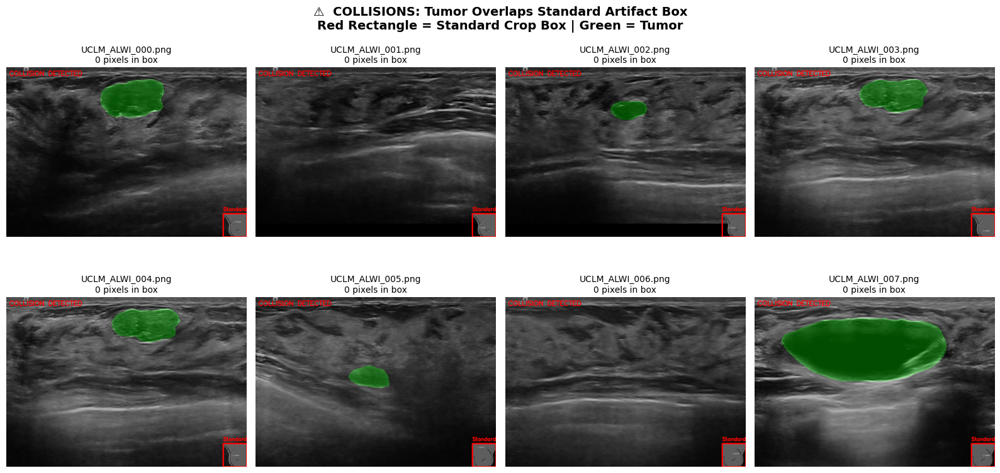

In [ ]:
"""
Global Consensus Artifact Detection for Medical Ultrasound Images
=================================================================
Safety Audit Script: Uses multi-image consensus to learn the fixed position
of body marker artifacts, then checks for tumor-artifact collisions.

Algorithm: Two-Phase Approach
Phase 1 - Calibration: Learn artifact position from first N images
Phase 2 - Collision Scan: Check all masks against the learned artifact box

Key Advantage: Robust to noise by using statistical consensus across images

Author: Senior CV Engineer
Purpose: Pre-cropping risk assessment for Processed_BUSI dataset
"""

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from typing import Tuple, List, Dict, Optional
from tqdm import tqdm

# ================================
# CONFIGURATION
# ================================
class Config:
    # Dataset path
    DATASET_PATH = '/content/drive/MyDrive/DL_Datasets/Processed_UCLM'  # Update if needed

    # Phase 1: Calibration parameters
    CALIBRATION_SAMPLE_SIZE = 50     # Number of images to learn artifact from
    CORNER_REGION_HEIGHT = 0.20      # Bottom 20% of image
    CORNER_REGION_WIDTH = 0.20       # Right 20% of image
    ARTIFACT_THRESHOLD = 200         # Bright white pixels (0-255)
    CONSENSUS_THRESHOLD = 0.50       # Pixel must appear in >50% of samples

    # Minimum artifact size (to filter noise)
    MIN_ARTIFACT_PIXELS = 100        # Minimum pixels to be considered artifact

    # Visualization parameters
    MAX_DISPLAY_COLS = 4             # Grid columns for visualization
    FIGURE_SIZE_PER_IMAGE = 4        # Size of each subplot


# ================================
# PHASE 1: CALIBRATION FUNCTIONS
# ================================
def extract_corner_patch(image: np.ndarray) -> Tuple[np.ndarray, Tuple[int, int]]:
    """
    Extract bottom-right corner patch from image.

    Args:
        image: RGB or Grayscale image (H, W, 3) or (H, W)

    Returns:
        Tuple of (corner_patch, corner_origin)
        - corner_patch: Extracted corner region
        - corner_origin: (x, y) coordinates of corner's top-left in full image
    """
    h, w = image.shape[:2]

    # Calculate corner region boundaries
    corner_y_start = int(h * (1 - Config.CORNER_REGION_HEIGHT))
    corner_x_start = int(w * (1 - Config.CORNER_REGION_WIDTH))

    # Extract corner
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image.copy()

    corner_patch = gray[corner_y_start:, corner_x_start:]
    corner_origin = (corner_x_start, corner_y_start)

    return corner_patch, corner_origin


def learn_artifact_position(dataset_path: str) -> Tuple[np.ndarray, Tuple[int, int, int, int], np.ndarray, Tuple[int, int]]:
    """
    Phase 1: Learn the artifact position using global consensus.

    Algorithm:
    1. Sample first N images
    2. Extract bottom-right corners
    3. Threshold bright pixels
    4. Accumulate binary patches
    5. Apply consensus threshold (>50% frequency)
    6. Calculate bounding box of consensus region

    Args:
        dataset_path: Path to dataset

    Returns:
        Tuple of (artifact_mask, bounding_box, consensus_heatmap, corner_origin)
        - artifact_mask: Binary mask of learned artifact
        - bounding_box: (x, y, w, h) in full image coordinates
        - consensus_heatmap: Frequency map (for visualization)
        - corner_origin: (x, y) offset of corner region in full image
    """
    print("\n" + "="*70)
    print("PHASE 1: CALIBRATION - Learning Artifact Position")
    print("="*70)

    images_dir = os.path.join(dataset_path, 'images')

    if not os.path.exists(images_dir):
        raise FileNotFoundError(f"Images directory not found: {images_dir}")

    # Get all image files
    image_files = sorted([f for f in os.listdir(images_dir)
                         if f.endswith(('.png', '.jpg', '.jpeg'))])

    if len(image_files) == 0:
        raise ValueError(f"No images found in {images_dir}")

    # Limit to calibration sample size
    calibration_files = image_files[:min(Config.CALIBRATION_SAMPLE_SIZE, len(image_files))]

    print(f"📊 Using {len(calibration_files)} images for calibration")
    print(f"   Corner region: Bottom {Config.CORNER_REGION_HEIGHT*100:.0f}% × "
          f"Right {Config.CORNER_REGION_WIDTH*100:.0f}%")
    print(f"   Consensus threshold: {Config.CONSENSUS_THRESHOLD*100:.0f}%\n")

    # Initialize accumulator
    accumulator = None
    corner_origin = None

    # Accumulate artifact patterns
    for img_filename in tqdm(calibration_files, desc="Sampling images"):
        img_path = os.path.join(images_dir, img_filename)
        image = cv2.imread(img_path)

        if image is None:
            continue

        # Extract corner patch
        corner_patch, origin = extract_corner_patch(image)

        if accumulator is None:
            # Initialize accumulator with corner patch size
            accumulator = np.zeros(corner_patch.shape, dtype=np.float32)
            corner_origin = origin

        # Threshold to find bright pixels (artifact candidates)
        _, artifact_binary = cv2.threshold(
            corner_patch,
            Config.ARTIFACT_THRESHOLD,
            1,  # Binary: 0 or 1
            cv2.THRESH_BINARY
        )

        # Accumulate
        accumulator += artifact_binary.astype(np.float32)

    # Normalize to frequency (0.0 to 1.0)
    consensus_heatmap = accumulator / len(calibration_files)

    # Apply consensus threshold: keep pixels that appear in >50% of samples
    artifact_mask = (consensus_heatmap > Config.CONSENSUS_THRESHOLD).astype(np.uint8) * 255

    # Calculate bounding box of artifact region
    artifact_coords = np.where(artifact_mask > 0)

    if len(artifact_coords[0]) > Config.MIN_ARTIFACT_PIXELS:
        # Found artifact - calculate bounding box

        # 1. DETECT TOP & LEFT (From Consensus)
        min_y = np.min(artifact_coords[0])  # Top-most white pixel
        min_x = np.min(artifact_coords[1])  # Left-most white pixel

        # 2. FORCE BOTTOM & RIGHT (To Image Edge)
        # Instead of stopping at the text/icon edge, we extend to the patch boundary
        # (Since the patch is extracted from the corner, its boundary IS the image corner)
        patch_h, patch_w = artifact_mask.shape

        # 3. Calculate Dimensions
        # Width = Distance from detected Left Edge -> Right Edge of Image
        w = patch_w - min_x
        # Height = Distance from detected Top Edge -> Bottom Edge of Image
        h = patch_h - min_y

        # 4. Convert to full image coordinates
        x = corner_origin[0] + min_x
        y = corner_origin[1] + min_y

        bounding_box = (x, y, w, h)

        print(f"✅ Artifact detected!")
        print(f"   Bounding box (x, y, w, h): {bounding_box}")
        print(f"   Coverage: {len(artifact_coords[0])} pixels")
        print(f"   Position: ({x}, {y}) to ({x+w}, {y+h})")
    else:
        # No significant artifact found
        bounding_box = None
        print(f"⚠️  No significant artifact detected")
        print(f"   Only {len(artifact_coords[0])} consensus pixels found")

    return artifact_mask, bounding_box, consensus_heatmap, corner_origin


def visualize_learned_artifact(artifact_mask: np.ndarray, consensus_heatmap: np.ndarray,
                               bounding_box: Optional[Tuple[int, int, int, int]],
                               corner_origin: Tuple[int, int]):
    """
    Visualize the learned artifact pattern.

    Args:
        artifact_mask: Binary mask of artifact
        consensus_heatmap: Frequency map
        bounding_box: (x, y, w, h) of artifact in full image
        corner_origin: (x, y) offset of corner region
    """
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Plot 1: Consensus heatmap
    im1 = axes[0].imshow(consensus_heatmap, cmap='hot', vmin=0, vmax=1)
    axes[0].set_title(f"Consensus Heatmap\n(Frequency across {Config.CALIBRATION_SAMPLE_SIZE} images)")
    axes[0].axis('off')
    plt.colorbar(im1, ax=axes[0], fraction=0.046, pad=0.04)

    # Plot 2: Learned artifact mask
    axes[1].imshow(artifact_mask, cmap='gray')
    axes[1].set_title(f"Learned Artifact Mask\n(Consensus > {Config.CONSENSUS_THRESHOLD*100:.0f}%)")

    # Draw bounding box if detected
    if bounding_box is not None:
        x, y, w, h = bounding_box
        # Convert to corner-relative coordinates for display
        x_rel = x - corner_origin[0]
        y_rel = y - corner_origin[1]

        from matplotlib.patches import Rectangle
        rect = Rectangle((x_rel, y_rel), w, h, linewidth=2, edgecolor='red', facecolor='none')
        axes[1].add_patch(rect)
        axes[1].text(x_rel, y_rel - 5, 'Standard Crop Box', color='red', fontweight='bold')

    axes[1].axis('off')

    plt.tight_layout()
    plt.suptitle("Phase 1: Calibration Results - Learned Artifact Position",
                 fontsize=14, fontweight='bold', y=1.02)
    plt.show()


# ================================
# PHASE 2: COLLISION DETECTION
# ================================
def check_collision_with_standard_box(mask: np.ndarray,
                                     bounding_box: Tuple[int, int, int, int]) -> Tuple[bool, int]:
    """
    Check if tumor mask overlaps with the standard artifact bounding box.

    Args:
        mask: Binary tumor mask
        bounding_box: (x, y, w, h) of artifact area

    Returns:
        Tuple of (collision_detected, pixels_in_box)
    """
    x, y, w, h = bounding_box

    # Extract the standard box region from mask
    box_region = mask[y:y+h, x:x+w]

    # Count tumor pixels in this region
    tumor_pixels = np.sum(box_region > 127)

    return tumor_pixels > 0, tumor_pixels


def scan_for_collisions(dataset_path: str, bounding_box: Optional[Tuple[int, int, int, int]]) -> Dict:
    """
    Phase 2: Scan all masks for collisions with the standard artifact box.

    Args:
        dataset_path: Path to dataset
        bounding_box: (x, y, w, h) of artifact area (None if no artifact detected)

    Returns:
        Dictionary containing collision results
    """
    print("\n" + "="*70)
    print("PHASE 2: COLLISION SCAN - Testing Against Standard Box")
    print("="*70)

    if bounding_box is None:
        print("⚠️  No artifact box detected in Phase 1. Skipping collision scan.")
        return {'total_images': 0, 'collisions': [], 'safe_images': []}

    print(f"📦 Standard Artifact Box: {bounding_box}")
    print(f"   Scanning all masks for overlap...\n")

    images_dir = os.path.join(dataset_path, 'images')
    masks_dir = os.path.join(dataset_path, 'masks')

    # Get all image files
    image_files = sorted([f for f in os.listdir(images_dir)
                         if f.endswith(('.png', '.jpg', '.jpeg'))])

    results = {
        'total_images': len(image_files),
        'standard_box': bounding_box,
        'collisions': [],
        'safe_images': []
    }

    # Scan each image-mask pair
    for img_filename in tqdm(image_files, desc="Scanning for collisions"):
        # Load image
        img_path = os.path.join(images_dir, img_filename)
        image = cv2.imread(img_path)

        if image is None:
            continue

        # Find corresponding mask
        mask_filename = img_filename.replace('.png', '_mask.png')
        mask_path = os.path.join(masks_dir, mask_filename)

        if not os.path.exists(mask_path):
            # Try alternative naming
            mask_filename = img_filename.replace('.jpg', '_mask.png').replace('.jpeg', '_mask.png')
            mask_path = os.path.join(masks_dir, mask_filename)

        if not os.path.exists(mask_path):
            continue

        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        if mask is None:
            continue

        # Check collision with standard box
        collision, pixels_in_box = check_collision_with_standard_box(mask, bounding_box)

        sample_result = {
            'filename': img_filename,
            'mask_filename': mask_filename,
            'image': image,
            'mask': mask,
            'collision': collision,
            'pixels_in_box': pixels_in_box
        }

        if collision:
            results['collisions'].append(sample_result)
        else:
            results['safe_images'].append(sample_result)

    return results


# ================================
# VISUALIZATION FUNCTIONS
# ================================
def create_collision_visualization(image: np.ndarray, mask: np.ndarray,
                                   bounding_box: Tuple[int, int, int, int]) -> np.ndarray:
    """
    Create visualization with standard box and mask overlay.

    Args:
        image: Original image
        mask: Tumor mask
        bounding_box: (x, y, w, h) of standard artifact box

    Returns:
        Visualization image
    """
    vis = image.copy()
    x, y, w, h = bounding_box

    # Overlay tumor mask in green (semi-transparent)
    mask_colored = np.zeros_like(vis)
    mask_colored[:, :, 1] = mask  # Green channel
    vis = cv2.addWeighted(vis, 0.7, mask_colored, 0.3, 0)

    # Draw red rectangle for standard artifact box
    cv2.rectangle(vis, (x, y), (x + w, y + h), (0, 0, 255), 3)

    # Add label
    cv2.putText(
        vis,
        f"Standard Artifact Box",
        (x, max(y - 10, 20)),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.6,
        (0, 0, 255),
        2
    )

    # Add collision indicator
    cv2.putText(
        vis,
        "COLLISION DETECTED",
        (10, 30),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (0, 0, 255),
        2
    )

    return vis


def visualize_collisions(results: Dict, max_display: int = 16):
    """
    Display grid of collision cases.

    Args:
        results: Collision scan results
        max_display: Maximum number of images to display
    """
    collisions = results['collisions'][:max_display]

    if len(collisions) == 0:
        print("\n✅ No collisions detected! Safe to crop all images.")
        return

    print(f"\n⚠️  Displaying {len(collisions)} collision cases:")

    # Calculate grid size
    n_cols = min(Config.MAX_DISPLAY_COLS, len(collisions))
    n_rows = int(np.ceil(len(collisions) / n_cols))

    # Create figure
    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(Config.FIGURE_SIZE_PER_IMAGE * n_cols,
                Config.FIGURE_SIZE_PER_IMAGE * n_rows)
    )

    if n_rows == 1 and n_cols == 1:
        axes = np.array([[axes]])
    elif n_rows == 1:
        axes = axes.reshape(1, -1)
    elif n_cols == 1:
        axes = axes.reshape(-1, 1)

    # Plot each collision
    for idx, case in enumerate(collisions):
        row = idx // n_cols
        col = idx % n_cols
        ax = axes[row, col]

        # Create visualization
        vis = create_collision_visualization(
            case['image'],
            case['mask'],
            results['standard_box']
        )

        # Convert BGR to RGB
        vis_rgb = cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)

        # Display
        ax.imshow(vis_rgb)
        ax.set_title(
            f"{case['filename']}\n{case['pixels_in_box']} pixels in box",
            fontsize=10
        )
        ax.axis('off')

    # Hide unused subplots
    for idx in range(len(collisions), n_rows * n_cols):
        row = idx // n_cols
        col = idx % n_cols
        axes[row, col].axis('off')

    plt.tight_layout()
    plt.suptitle(
        "⚠️  COLLISIONS: Tumor Overlaps Standard Artifact Box\n"
        "Red Rectangle = Standard Crop Box | Green = Tumor",
        fontsize=14, fontweight='bold', y=1.02
    )
    plt.show()


def print_summary_report(calibration_success: bool, results: Dict):
    """
    Print comprehensive analysis summary.

    Args:
        calibration_success: Whether artifact was detected in Phase 1
        results: Collision scan results
    """
    print("\n" + "="*70)
    print("ANALYSIS SUMMARY - Global Consensus Method")
    print("="*70)

    if not calibration_success:
        print("\n⚠️  Calibration failed - no artifact detected")
        print("   Cannot perform collision scan without standard box")
        return

    print(f"\n📊 Phase 1 - Calibration:")
    print(f"  • Samples analyzed: {Config.CALIBRATION_SAMPLE_SIZE}")
    print(f"  • Standard box detected: {results['standard_box']}")

    print(f"\n📊 Phase 2 - Collision Scan:")
    print(f"  • Total images scanned: {results['total_images']}")
    n_collisions = len(results['collisions'])
    n_safe = len(results['safe_images'])
    print(f"  • COLLISIONS DETECTED: {n_collisions}")
    print(f"  • Safe images: {n_safe}")

    if n_collisions > 0:
        print(f"\n⚠️  Collision Details:")
        for i, case in enumerate(results['collisions'][:10], 1):
            print(f"    {i}. {case['filename']} - {case['pixels_in_box']} pixels in artifact box")
        if n_collisions > 10:
            print(f"    ... and {n_collisions - 10} more")

        # Statistics
        pixels_in_box = [c['pixels_in_box'] for c in results['collisions']]
        print(f"\n📈 Collision Statistics:")
        print(f"  • Min pixels in box: {min(pixels_in_box)}")
        print(f"  • Max pixels in box: {max(pixels_in_box)}")
        print(f"  • Average pixels in box: {np.mean(pixels_in_box):.1f}")

    print("\n" + "="*70)

    # Recommendation
    print("\n💡 RECOMMENDATION:")
    collision_rate = n_collisions / results['total_images'] if results['total_images'] > 0 else 0

    if n_collisions == 0:
        print("  ✅ SAFE to proceed with automated cropping")
        print("  ✅ No tumor tissue overlaps with artifact area")
    elif collision_rate < 0.05:
        print("  ⚠️  CAUTION: Manual review recommended for collision cases")
        print(f"  ⚠️  {collision_rate*100:.1f}% of images affected")
    else:
        print("  ❌ HIGH RISK: Significant collision rate detected")
        print(f"  ❌ {collision_rate*100:.1f}% of images affected")
        print("  ❌ Recommend alternative strategy or manual intervention")

    print("="*70 + "\n")


# ================================
# MAIN EXECUTION
# ================================
def main():
    """
    Execute complete two-phase analysis.
    """
    try:
        # Phase 1: Learn artifact position
        artifact_mask, bounding_box, consensus_heatmap, corner_origin = learn_artifact_position(
            Config.DATASET_PATH
        )

        # Visualize learned artifact
        print("\n🔍 Visualizing learned artifact pattern...")
        visualize_learned_artifact(artifact_mask, consensus_heatmap, bounding_box, corner_origin)

        calibration_success = bounding_box is not None

        # Phase 2: Scan for collisions
        results = scan_for_collisions(Config.DATASET_PATH, bounding_box)

        # Print summary
        print_summary_report(calibration_success, results)

        # Visualize collisions
        if len(results['collisions']) > 0:
            print("\n🔍 Generating collision visualizations...")
            visualize_collisions(results, max_display=16)

        # Optional: Show safe examples
        if len(results.get('safe_images', [])) > 0:
            response = input("\nShow examples of safe images? (y/n): ").lower()
            if response == 'y':
                safe_results = {
                    'collisions': results['safe_images'][:8],
                    'standard_box': results['standard_box']
                }
                print("\n✅ Examples of safe images (no collision):")
                visualize_collisions(safe_results, max_display=8)

    except Exception as e:
        print(f"\n❌ Error during analysis: {str(e)}")
        raise


if __name__ == "__main__":
    print("\n" + "="*70)
    print("GLOBAL CONSENSUS ARTIFACT DETECTION")
    print("Two-Phase Approach: Learn → Scan")
    print("="*70)
    print("\n⚙️  Configuration:")
    print(f"  Dataset path: {Config.DATASET_PATH}")
    print(f"  Calibration samples: {Config.CALIBRATION_SAMPLE_SIZE}")
    print(f"  Consensus threshold: {Config.CONSENSUS_THRESHOLD*100:.0f}%")
    print(f"  To change settings, update Config class in the script")
    print("="*70)

    proceed = input("\nProceed with analysis? (y/n): ").lower()
    if proceed == 'y':
        main()
    else:
        print("Analysis cancelled.")

In [ ]:
import os
import cv2
import numpy as np
from tqdm import tqdm

# ================================
# CONFIGURATION
# ================================
DATASET_DIR = '/content/drive/MyDrive/DL_Datasets/Processed_UCLM'
INPUT_SUBDIR = 'images'
OUTPUT_SUBDIR = 'images_rm_artifact'

# The detected top-left start point of the artifact
DETECTED_BOX = (772, 523, 84, 83)
PADDING = 5  # Your manual adjustment

def apply_edge_to_edge_blackout(image: np.ndarray, box: tuple, padding: int) -> np.ndarray:
    """
    Blacks out from the (padded) start point all the way to the
    extreme right and bottom edges of the image.
    """
    h_img, w_img = image.shape[:2]
    x, y, _, _ = box  # We ignore the old w/h, we will calculate new ones

    # 1. Calculate Start Point (Top-Left) with Padding
    start_x = max(0, x - padding)
    start_y = max(0, y - padding)

    # 2. Calculate Width/Height to hit the Absolute Edge
    # Distance from start_x to the far right edge
    fill_width = w_img - start_x
    # Distance from start_y to the very bottom
    fill_height = h_img - start_y

    processed_img = image.copy()

    # 3. Apply Blackout
    # This guarantees we cover everything to the corner
    processed_img[start_y:start_y+fill_height, start_x:start_x+fill_width, :] = 0

    return processed_img

def main():
    input_dir = os.path.join(DATASET_DIR, INPUT_SUBDIR)
    output_dir = os.path.join(DATASET_DIR, OUTPUT_SUBDIR)

    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
        print(f"📁 Created output directory: {output_dir}")

    image_files = sorted([f for f in os.listdir(input_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])

    print(f"🚀 Processing {len(image_files)} images...")
    print(f"   Strategy: Blackout to Absolute Edge")
    print(f"   Padding: {PADDING}px")

    for filename in tqdm(image_files, desc="Processing"):
        img_path = os.path.join(input_dir, filename)
        save_path = os.path.join(output_dir, filename)

        image = cv2.imread(img_path)
        if image is None: continue

        # Use the new dynamic function
        cleaned_image = apply_edge_to_edge_blackout(image, DETECTED_BOX, PADDING)

        cv2.imwrite(save_path, cleaned_image)

    print("\n✅ Processing Complete!")

if __name__ == "__main__":
    main()

🚀 Processing 682 images...
   Strategy: Blackout to Absolute Edge
   Padding: 5px


Processing: 100%|██████████| 682/682 [00:56<00:00, 12.13it/s]


✅ Processing Complete!


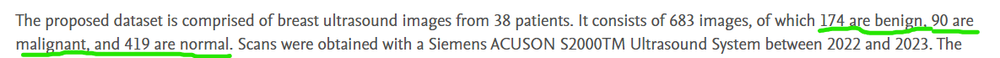

# Augmentation , preprocessing , and train test split

In [ ]:
"""
Multi-Task Breast Ultrasound Dataset Preprocessing Pipeline
============================================================
Merges, cleans, splits, and augments BUSI and UCLM datasets for ResNet34 + U-Net training.

Class-Specific Augmentation Strategy (Standard Medical Imaging Practice):
- Normal: Original + 1 augmented copy (ratio 1+1)
- Benign: Original + 1 augmented copy (ratio 1+1)
- Malignant: Original + 2 augmented copies (ratio 1+2) - Most critical class

Key Features:
- Albumentations pipeline is re-run independently for each augmented copy
- Test set contains only original cleaned images (no augmentation)
- Image-mask alignment maintained through synchronized transforms
- Class labels preserved throughout augmentation

Author: Senior CV Engineer
Purpose: Generate production-ready training/test splits with class-balanced augmentation
"""

import os
import cv2
import numpy as np
import pandas as pd
import albumentations as A
from pathlib import Path
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import shutil
from typing import Tuple, Dict, List

# ================================
# CONFIGURATION
# ================================
class Config:
    # Source directories
    SOURCE_DIRS = ['/content/drive/MyDrive/DL_Datasets/Processed_BUSI', '/content/drive/MyDrive/DL_Datasets/Processed_UCLM']

    # Output directory
    OUTPUT_DIR = '/content/drive/MyDrive/DL_Datasets/Final_Merged_Dataset'

    # Split ratio
    TRAIN_RATIO = 0.8
    TEST_RATIO = 0.2
    RANDOM_STATE = 42

    # Cleaning parameters
    MEDIAN_BLUR_KERNEL = 3
    CLAHE_CLIP_LIMIT = 2.0
    CLAHE_TILE_SIZE = (8, 8)

    # Augmentation parameters - Class-specific for imbalance handling
    CLASS_AUGMENTATION_COUNTS = {
        'normal': 1,      # Generate 1 augmented copy
        'benign': 1,      # Generate 1 augmented copy
        'malignant': 2    # Generate 2 augmented copies (most critical class)
    }

    # Class names for stratification
    CLASSES = ['benign', 'malignant', 'normal']


# ================================
# STEP 1: DATA LOADING & MERGING
# ================================
def load_and_merge_metadata(source_dirs: List[str]) -> pd.DataFrame:
    """
    Load metadata.csv from all source directories and combine them.

    Args:
        source_dirs: List of source directory paths

    Returns:
        Combined DataFrame with all metadata
    """
    print("\n" + "="*60)
    print("STEP 1: Loading and Merging Metadata")
    print("="*60)

    dfs = []
    for src_dir in source_dirs:
        metadata_path = os.path.join(src_dir, 'metadata.csv')

        if not os.path.exists(metadata_path):
            print(f"⚠️  Warning: {metadata_path} not found. Skipping...")
            continue

        df = pd.read_csv(metadata_path)
        df['source_dataset'] = src_dir  # Track origin
        dfs.append(df)
        print(f"✓ Loaded {len(df)} samples from {src_dir}")

    if not dfs:
        raise FileNotFoundError("No metadata files found in source directories!")

    merged_df = pd.concat(dfs, ignore_index=True)
    print(f"\n✓ Total samples merged: {len(merged_df)}")
    print(f"✓ Class distribution:\n{merged_df['class_name'].value_counts()}")

    return merged_df


# ================================
# STEP 2: STRATIFIED SPLIT
# ================================
def stratified_split(df: pd.DataFrame, train_ratio: float, random_state: int) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    Perform stratified train-test split based on class_name.

    Args:
        df: Combined metadata DataFrame
        train_ratio: Proportion of data for training
        random_state: Random seed for reproducibility

    Returns:
        train_df, test_df
    """
    print("\n" + "="*60)
    print("STEP 2: Stratified Train-Test Split")
    print("="*60)

    train_df, test_df = train_test_split(
        df,
        train_size=train_ratio,
        stratify=df['class_name'],
        random_state=random_state
    )

    print(f"✓ Train set: {len(train_df)} samples")
    print(f"  {train_df['class_name'].value_counts().to_dict()}")
    print(f"✓ Test set: {len(test_df)} samples")
    print(f"  {test_df['class_name'].value_counts().to_dict()}")

    return train_df.reset_index(drop=True), test_df.reset_index(drop=True)


# ================================
# STEP 3: CLEANING PIPELINE
# ================================
def apply_cleaning_pipeline(image: np.ndarray) -> np.ndarray:
    """
    Apply denoising and contrast enhancement to ultrasound images.

    Pipeline:
        1. Median Blur (kernel=3) - Remove speckle noise
        2. CLAHE (clip=2.0, tile=8x8) - Enhance tumor boundaries

    Args:
        image: RGB image (H, W, 3)

    Returns:
        Cleaned RGB image
    """
    # Step A: Denoising with Median Blur
    denoised = cv2.medianBlur(image, Config.MEDIAN_BLUR_KERNEL)

    # Step B: CLAHE on each channel for RGB
    clahe = cv2.createCLAHE(
        clipLimit=Config.CLAHE_CLIP_LIMIT,
        tileGridSize=Config.CLAHE_TILE_SIZE
    )

    # Apply CLAHE to each channel independently
    cleaned = np.zeros_like(denoised)
    for i in range(3):
        cleaned[:, :, i] = clahe.apply(denoised[:, :, i])

    return cleaned


# ================================
# STEP 4: AUGMENTATION PIPELINE
# ================================
def get_augmentation_pipeline() -> A.Compose:
    """
    Define geometric augmentation pipeline using albumentations.

    Pipeline is re-run independently for each augmented copy to ensure
    different random transformations (not duplicates).

    Transforms:
    - HorizontalFlip: Mirror symmetry (p=0.5)
    - Affine: Geometric variation (±15°, ±10% scale, shift)
    - ElasticTransform: Tissue deformation simulation (α=120, σ=6)

    Returns:
        Albumentations Compose object with geometric transforms
    """
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.Affine(
            scale=(0.9, 1.1),        # ±10% scale
            translate_percent=(-0.0625, 0.0625),  # ±6.25% shift
            rotate=(-15, 15),        # ±15° rotation
            shear=0,                 # No shear
            mode=cv2.BORDER_CONSTANT,
            cval=0,
            cval_mask=0,
            p=0.8
        ),
        A.ElasticTransform(
            alpha=120,
            sigma=6,
            border_mode=cv2.BORDER_CONSTANT,
            p=0.5
        )
    ])


# ================================
# STEP 5: PROCESSING FUNCTIONS
# ================================
def process_and_save_sample(
    row: pd.Series,
    source_dir: str,
    output_images_dir: str,
    output_masks_dir: str,
    class_id: int,
    augment: bool = False,
    aug_pipeline: A.Compose = None,
    num_augmentations: int = 0
) -> List[Dict]:
    """
    Load, clean, optionally augment, and save a single sample.

    Augmentation is class-specific to handle imbalance:
    - Normal: 1 augmented copy
    - Benign: 1 augmented copy
    - Malignant: 2 augmented copies

    CRITICAL: Albumentations pipeline is re-run independently for each copy
    to ensure different random transformations.

    Files are named by class and ID: benign_001.png, malignant_042_aug1.png

    Args:
        row: Metadata row containing file paths
        source_dir: Source dataset directory
        output_images_dir: Destination for images
        output_masks_dir: Destination for masks
        augment: Whether to generate augmentations
        aug_pipeline: Albumentations pipeline
        num_augmentations: Number of augmented copies (class-specific)
        class_id: Sequential ID within class for naming

    Returns:
        List of metadata dictionaries for saved files
    """
    # Construct full paths
    img_path = os.path.join(source_dir, row['image_path'])
    mask_path = os.path.join(source_dir, row['mask_path'])

    # Validate files exist
    if not os.path.exists(img_path) or not os.path.exists(mask_path):
        print(f"⚠️  Missing files for {row['image_path']}, skipping...")
        return []

    # Load image and mask
    image = cv2.imread(img_path)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    if image is None or mask is None:
        print(f"⚠️  Failed to load {row['image_path']}, skipping...")
        return []

    # Apply cleaning pipeline to image only
    cleaned_image = apply_cleaning_pipeline(image)

    # Extract source dataset name for metadata tracking
    dataset_name = os.path.basename(source_dir)  # Gets "Processed_BUSI"
    source_prefix = dataset_name.replace('Processed_', '')  # Gets "BUSI"

    # Get class name for filename
    class_name = row['class_name'].lower()

    # Generate clean filenames: benign_001.png, malignant_042.png
    base_name = f"{class_name}_{class_id:03d}"  # e.g., "benign_001", "malignant_042"

    saved_metadata = []

    # Save ORIGINAL (cleaned) version
    orig_img_name = f"{base_name}.png"
    orig_mask_name = f"{base_name}_mask.png"

    cv2.imwrite(os.path.join(output_images_dir, orig_img_name), cleaned_image)
    cv2.imwrite(os.path.join(output_masks_dir, orig_mask_name), mask)

    saved_metadata.append({
        'image_path': f'images/{orig_img_name}',
        'mask_path': f'masks/{orig_mask_name}',
        'class_name': row['class_name'],
        'source_dataset': source_prefix,
        'augmented': False,
        'original_filename': Path(row['image_path']).name
    })

    # Generate AUGMENTATIONS (only if requested)
    if augment and aug_pipeline is not None and num_augmentations > 0:
        for aug_idx in range(num_augmentations):
            # CRITICAL: Re-run augmentation pipeline independently for each copy
            # This ensures different random transforms (not duplicates)
            augmented = aug_pipeline(image=cleaned_image, mask=mask)
            aug_image = augmented['image']
            aug_mask = augmented['mask']

            # Create unique filename for augmented version: benign_001_aug1.png
            aug_img_name = f"{base_name}_aug{aug_idx+1}.png"
            aug_mask_name = f"{base_name}_aug{aug_idx+1}_mask.png"

            cv2.imwrite(os.path.join(output_images_dir, aug_img_name), aug_image)
            cv2.imwrite(os.path.join(output_masks_dir, aug_mask_name), aug_mask)

            saved_metadata.append({
                'image_path': f'images/{aug_img_name}',
                'mask_path': f'masks/{aug_mask_name}',
                'class_name': row['class_name'],
                'source_dataset': source_prefix,
                'augmented': True,
                'augmentation_index': aug_idx + 1,
                'original_filename': Path(row['image_path']).name
            })

    return saved_metadata


def process_split(
    df: pd.DataFrame,
    split_name: str,
    output_dir: str,
    augment: bool = False
) -> pd.DataFrame:
    """
    Process entire train or test split.

    For training data, applies class-specific augmentation:
    - Normal: original + 1 augmented copy
    - Benign: original + 1 augmented copy
    - Malignant: original + 2 augmented copies

    Files are named by class and sequential ID: benign_001.png, malignant_042_aug1.png

    Args:
        df: DataFrame with metadata for this split
        split_name: 'train' or 'test'
        output_dir: Base output directory
        augment: Whether to apply augmentation

    Returns:
        DataFrame with metadata for all saved files
    """
    print(f"\n{'='*60}")
    print(f"STEP 3-4: Processing {split_name.upper()} Set")
    print(f"{'='*60}")

    # Create output directories
    split_dir = os.path.join(output_dir, split_name)
    images_dir = os.path.join(split_dir, 'images')
    masks_dir = os.path.join(split_dir, 'masks')

    os.makedirs(images_dir, exist_ok=True)
    os.makedirs(masks_dir, exist_ok=True)

    # Initialize augmentation pipeline if needed
    aug_pipeline = get_augmentation_pipeline() if augment else None

    # Initialize class-based counters for clean naming
    class_counters = {cls: 1 for cls in Config.CLASSES}

    # Process all samples with class-specific augmentation
    all_metadata = []

    for idx, row in tqdm(df.iterrows(), total=len(df), desc=f"Processing {split_name}"):
        # Determine number of augmentations based on class (for imbalance handling)
        if augment:
            class_name = row['class_name'].lower()
            num_augs = Config.CLASS_AUGMENTATION_COUNTS.get(class_name, 0)
        else:
            num_augs = 0

        # Get unique ID for this sample
        class_id = class_counters[row['class_name']]
        class_counters[row['class_name']] += 1

        sample_metadata = process_and_save_sample(
            row=row,
            source_dir=row['source_dataset'],
            output_images_dir=images_dir,
            output_masks_dir=masks_dir,
            augment=augment,
            aug_pipeline=aug_pipeline,
            num_augmentations=num_augs,
            class_id=class_id  # Pass unique ID
        )
        all_metadata.extend(sample_metadata)

    # Create metadata DataFrame
    metadata_df = pd.DataFrame(all_metadata)

    # Save metadata CSV
    metadata_path = os.path.join(split_dir, f'{split_name}_metadata.csv')
    metadata_df.to_csv(metadata_path, index=False)

    print(f"\n✓ {split_name.upper()} processing complete:")
    print(f"  - Original samples: {len(df)}")
    print(f"  - Total saved files: {len(metadata_df)}")
    if augment:
        print(f"  - Class-specific augmentation applied:")
        for cls in Config.CLASSES:
            orig_count = (df['class_name'] == cls).sum()
            total_count = (metadata_df['class_name'] == cls).sum()
            aug_count = Config.CLASS_AUGMENTATION_COUNTS.get(cls.lower(), 0)
            print(f"    • {cls}: {orig_count} original → {total_count} total (1 + {aug_count} augmented per sample)")
        print(f"  - Total augmented samples: {metadata_df['augmented'].sum()}")
    print(f"  - Metadata saved to: {metadata_path}")

    return metadata_df


# ================================
# MAIN PIPELINE
# ================================
def main():
    """
    Execute complete preprocessing pipeline.
    """
    print("\n" + "="*60)
    print("BREAST ULTRASOUND DATASET PREPROCESSING PIPELINE")
    print("="*60)
    print(f"Configuration:")
    print(f"  - Source datasets: {Config.SOURCE_DIRS}")
    print(f"  - Output directory: {Config.OUTPUT_DIR}")
    print(f"  - Train/Test split: {Config.TRAIN_RATIO}/{Config.TEST_RATIO}")
    print(f"  - Class-specific augmentation strategy:")
    for cls, count in Config.CLASS_AUGMENTATION_COUNTS.items():
        print(f"    • {cls.capitalize()}: original + {count} augmented copy/copies")
    print(f"  - Augmentation method: Independent Albumentations re-runs per copy")

    # Create output directory
    if os.path.exists(Config.OUTPUT_DIR):
        print(f"\n⚠️  Output directory exists. Removing old data...")
        shutil.rmtree(Config.OUTPUT_DIR)
    os.makedirs(Config.OUTPUT_DIR)

    # Step 1: Load and merge metadata
    merged_df = load_and_merge_metadata(Config.SOURCE_DIRS)

    # Step 2: Stratified split
    train_df, test_df = stratified_split(
        merged_df,
        Config.TRAIN_RATIO,
        Config.RANDOM_STATE
    )

    # Step 3-4: Process train set (with augmentation)
    train_metadata = process_split(
        df=train_df,
        split_name='train',
        output_dir=Config.OUTPUT_DIR,
        augment=True
    )

    # Step 3-4: Process test set (no augmentation)
    test_metadata = process_split(
        df=test_df,
        split_name='test',
        output_dir=Config.OUTPUT_DIR,
        augment=False
    )

    # Final summary
    print("\n" + "="*60)
    print("PIPELINE COMPLETE ✓")
    print("="*60)
    print(f"\nFinal Dataset Summary:")
    print(f"  Training Set (Class-Balanced Augmentation):")
    print(f"    - Total samples: {len(train_metadata)}")
    print(f"    - Original: {(~train_metadata['augmented']).sum()}")
    print(f"    - Augmented: {train_metadata['augmented'].sum()}")
    print(f"    - Class distribution (with augmentation):")
    for cls in Config.CLASSES:
        count = (train_metadata['class_name'] == cls).sum()
        orig = ((train_metadata['class_name'] == cls) & (~train_metadata['augmented'])).sum()
        aug_per_sample = Config.CLASS_AUGMENTATION_COUNTS.get(cls.lower(), 0)
        expected_total = orig * (1 + aug_per_sample)
        print(f"      • {cls}: {count} samples (original: {orig}, ratio: 1+{aug_per_sample})")

    print(f"\n  Test Set (Original Cleaned Samples Only):")
    print(f"    - Total samples: {len(test_metadata)}")
    print(f"    - Class distribution:")
    for cls in Config.CLASSES:
        count = (test_metadata['class_name'] == cls).sum()
        print(f"      • {cls}: {count}")

    print(f"\n✓ Output directory structure:")
    print(f"  {Config.OUTPUT_DIR}/")
    print(f"  ├── train/")
    print(f"  │   ├── images/ ({len(train_metadata)} files)")
    print(f"  │   ├── masks/ ({len(train_metadata)} files)")
    print(f"  │   └── train_metadata.csv")
    print(f"  └── test/")
    print(f"      ├── images/ ({len(test_metadata)} files)")
    print(f"      ├── masks/ ({len(test_metadata)} files)")
    print(f"      └── test_metadata.csv")

    print("\n🎉 Dataset is ready for training!")


if __name__ == "__main__":
    try:
        main()
    except Exception as e:
        print(f"\n❌ Pipeline failed with error: {str(e)}")
        raise

/tmp/ipython-input-806292241.py:191: UserWarning: Argument(s) 'mode, cval, cval_mask' are not valid for transform Affine
  A.Affine(



BREAST ULTRASOUND DATASET PREPROCESSING PIPELINE
Configuration:
  - Source datasets: ['/content/drive/MyDrive/DL_Datasets/Processed_BUSI', '/content/drive/MyDrive/DL_Datasets/Processed_UCLM']
  - Output directory: /content/drive/MyDrive/DL_Datasets/Final_Merged_Dataset
  - Train/Test split: 0.8/0.2
  - Class-specific augmentation strategy:
    • Normal: original + 1 augmented copy/copies
    • Benign: original + 1 augmented copy/copies
    • Malignant: original + 2 augmented copy/copies
  - Augmentation method: Independent Albumentations re-runs per copy

⚠️  Output directory exists. Removing old data...

STEP 1: Loading and Merging Metadata
✓ Loaded 780 samples from /content/drive/MyDrive/DL_Datasets/Processed_BUSI
✓ Loaded 682 samples from /content/drive/MyDrive/DL_Datasets/Processed_UCLM

✓ Total samples merged: 1462
✓ Class distribution:
class_name
benign       611
normal       552
malignant    299
Name: count, dtype: int64

STEP 2: Stratified Train-Test Split
✓ Train set: 1169 sa

Processing train: 100%|██████████| 1169/1169 [04:27<00:00,  4.38it/s]



✓ TRAIN processing complete:
  - Original samples: 1169
  - Total saved files: 2577
  - Class-specific augmentation applied:
    • benign: 489 original → 978 total (1 + 1 augmented per sample)
    • malignant: 239 original → 717 total (1 + 2 augmented per sample)
    • normal: 441 original → 882 total (1 + 1 augmented per sample)
  - Total augmented samples: 1408
  - Metadata saved to: /content/drive/MyDrive/DL_Datasets/Final_Merged_Dataset/train/train_metadata.csv

STEP 3-4: Processing TEST Set


Processing test: 100%|██████████| 293/293 [00:34<00:00,  8.49it/s]


✓ TEST processing complete:
  - Original samples: 293
  - Total saved files: 293
  - Metadata saved to: /content/drive/MyDrive/DL_Datasets/Final_Merged_Dataset/test/test_metadata.csv

PIPELINE COMPLETE ✓

Final Dataset Summary:
  Training Set (Class-Balanced Augmentation):
    - Total samples: 2577
    - Original: 1169
    - Augmented: 1408
    - Class distribution (with augmentation):
      • benign: 978 samples (original: 489, ratio: 1+1)
      • malignant: 717 samples (original: 239, ratio: 1+2)
      • normal: 882 samples (original: 441, ratio: 1+1)

  Test Set (Original Cleaned Samples Only):
    - Total samples: 293
    - Class distribution:
      • benign: 122
      • malignant: 60
      • normal: 111

✓ Output directory structure:
  /content/drive/MyDrive/DL_Datasets/Final_Merged_Dataset/
  ├── train/
  │   ├── images/ (2577 files)
  │   ├── masks/ (2577 files)
  │   └── train_metadata.csv
  └── test/
      ├── images/ (293 files)
      ├── masks/ (293 files)
      └── test_me

In [ ]:
"""
Multi-Task Breast Ultrasound Dataset Preprocessing Pipeline
============================================================
Merges, cleans, splits, and augments BUSI and UCLM datasets.

PATH LOGIC:
- Checks each dataset for a 'images_rm_artifact' folder.
- If found (UCLM) -> Uses it.
- If not found (BUSI) -> Uses standard 'images' folder.
- NO live artifact removal is performed.

Author: Senior CV Engineer
"""

import os
import cv2
import numpy as np
import pandas as pd
import albumentations as A
from pathlib import Path
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import shutil
from typing import Tuple, Dict, List

# ================================
# CONFIGURATION
# ================================
class Config:
    # Source directories
    SOURCE_DIRS = [
        '/content/drive/MyDrive/DL_Datasets/Processed_BUSI',
        '/content/drive/MyDrive/DL_Datasets/Processed_UCLM'
    ]

    # Output directory
    OUTPUT_DIR = '/content/drive/MyDrive/DL_Datasets/Merged_Dataset_rm_artifact'

    # Split ratio
    TRAIN_RATIO = 0.8
    TEST_RATIO = 0.2
    RANDOM_STATE = 42

    # Cleaning parameters
    MEDIAN_BLUR_KERNEL = 3
    CLAHE_CLIP_LIMIT = 2.0
    CLAHE_TILE_SIZE = (8, 8)

    # Augmentation parameters
    CLASS_AUGMENTATION_COUNTS = {
        'normal': 1,
        'benign': 1,
        'malignant': 2
    }

    CLASSES = ['benign', 'malignant', 'normal']


# ================================
# STEP 1: DATA LOADING & MERGING
# ================================
def load_and_merge_metadata(source_dirs: List[str]) -> pd.DataFrame:
    """
    Load metadata. Automatically detects which image folder to use per dataset.
    """
    print("\n" + "="*60)
    print("STEP 1: Loading and Merging Metadata")
    print("="*60)

    dfs = []
    for src_dir in source_dirs:
        dataset_name = os.path.basename(src_dir)
        metadata_path = os.path.join(src_dir, 'metadata.csv')

        if not os.path.exists(metadata_path):
            print(f"⚠️  Warning: {metadata_path} not found. Skipping...")
            continue

        df = pd.read_csv(metadata_path)
        df['source_dataset'] = src_dir

        # --- FOLDER DETECTION LOGIC ---
        # Check if the specific 'images_rm_artifact' folder exists
        special_folder = os.path.join(src_dir, 'images_rm_artifact')

        if os.path.exists(special_folder):
            print(f"✅ {dataset_name}: Found 'images_rm_artifact'. Switching path.")
            # Replace standard 'images/' path with the artifact-free folder
            df['image_path'] = df['image_path'].str.replace('images/', 'images_rm_artifact/')
        else:
            print(f"ℹ️  {dataset_name}: 'images_rm_artifact' not found. Using standard 'images'.")
            # No change needed, metadata already points to 'images/'

        dfs.append(df)
        print(f"   Loaded {len(df)} samples")

    if not dfs:
        raise FileNotFoundError("No valid datasets found.")

    merged_df = pd.concat(dfs, ignore_index=True)
    return merged_df


# ================================
# STEP 2: STRATIFIED SPLIT
# ================================
def stratified_split(df, train_ratio, random_state):
    print("\n" + "="*60)
    print("STEP 2: Stratified Train-Test Split")
    print("="*60)
    train_df, test_df = train_test_split(df, train_size=train_ratio, stratify=df['class_name'], random_state=random_state)
    return train_df.reset_index(drop=True), test_df.reset_index(drop=True)


# ================================
# STEP 3: CLEANING PIPELINE
# ================================
def apply_cleaning_pipeline(image: np.ndarray) -> np.ndarray:
    """
    Standard cleaning: Median Blur + CLAHE.
    """
    denoised = cv2.medianBlur(image, Config.MEDIAN_BLUR_KERNEL)
    clahe = cv2.createCLAHE(clipLimit=Config.CLAHE_CLIP_LIMIT, tileGridSize=Config.CLAHE_TILE_SIZE)
    cleaned = np.zeros_like(denoised)
    for i in range(3):
        cleaned[:, :, i] = clahe.apply(denoised[:, :, i])
    return cleaned


# ================================
# STEP 4: AUGMENTATION PIPELINE
# ================================
def get_augmentation_pipeline() -> A.Compose:
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.Affine(scale=(0.9, 1.1), translate_percent=(-0.0625, 0.0625), rotate=(-15, 15), shear=0, mode=cv2.BORDER_CONSTANT, p=0.8),
        A.ElasticTransform(alpha=120, sigma=6, border_mode=cv2.BORDER_CONSTANT, p=0.5)
    ])


# ================================
# STEP 5: PROCESSING FUNCTIONS
# ================================
def process_and_save_sample(
    row: pd.Series,
    source_dir: str,
    output_images_dir: str,
    output_masks_dir: str,
    class_id: int,
    augment: bool = False,
    aug_pipeline: A.Compose = None,
    num_augmentations: int = 0
) -> List[Dict]:

    # Construct paths
    # Note: 'row['image_path']' was already updated in Step 1 to point to the correct folder
    img_path = os.path.join(source_dir, row['image_path'])
    mask_path = os.path.join(source_dir, row['mask_path'])

    # Validation
    if not os.path.exists(img_path):
        # Double check: sometimes metadata might be stale.
        print(f"⚠️  File not found: {img_path}")
        return []

    if not os.path.exists(mask_path): return []

    # Load
    image = cv2.imread(img_path)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    if image is None or mask is None: return []

    # Cleaning (Blur/CLAHE)
    # No blackout code here anymore.
    cleaned_image = apply_cleaning_pipeline(image)

    # Naming
    dataset_name = os.path.basename(source_dir)
    source_prefix = dataset_name.replace('Processed_', '')
    class_name = row['class_name'].lower()
    base_name = f"{class_name}_{class_id:03d}"

    saved_metadata = []

    # Save ORIGINAL
    orig_img_name = f"{base_name}.png"
    orig_mask_name = f"{base_name}_mask.png"

    cv2.imwrite(os.path.join(output_images_dir, orig_img_name), cleaned_image)
    cv2.imwrite(os.path.join(output_masks_dir, orig_mask_name), mask)

    saved_metadata.append({
        'image_path': f'images/{orig_img_name}',
        'mask_path': f'masks/{orig_mask_name}',
        'class_name': row['class_name'],
        'source_dataset': source_prefix,
        'augmented': False,
        'original_filename': Path(row['image_path']).name
    })

    # Save AUGMENTATIONS
    if augment and aug_pipeline is not None and num_augmentations > 0:
        for aug_idx in range(num_augmentations):
            augmented = aug_pipeline(image=cleaned_image, mask=mask)

            aug_name = f"{base_name}_aug{aug_idx+1}.png"
            aug_mask_name = f"{base_name}_aug{aug_idx+1}_mask.png"

            cv2.imwrite(os.path.join(output_images_dir, aug_name), augmented['image'])
            cv2.imwrite(os.path.join(output_masks_dir, aug_mask_name), augmented['mask'])

            saved_metadata.append({
                'image_path': f'images/{aug_name}',
                'mask_path': f'masks/{aug_mask_name}',
                'class_name': row['class_name'],
                'source_dataset': source_prefix,
                'augmented': True,
                'augmentation_index': aug_idx + 1,
                'original_filename': Path(row['image_path']).name
            })

    return saved_metadata


def process_split(df, split_name, output_dir, augment=False):
    print(f"\n{'='*60}")
    print(f"STEP 3-4: Processing {split_name.upper()} Set")
    print(f"{'='*60}")

    split_dir = os.path.join(output_dir, split_name)
    images_dir = os.path.join(split_dir, 'images')
    masks_dir = os.path.join(split_dir, 'masks')
    os.makedirs(images_dir, exist_ok=True)
    os.makedirs(masks_dir, exist_ok=True)

    aug_pipeline = get_augmentation_pipeline() if augment else None
    class_counters = {cls: 1 for cls in Config.CLASSES}
    all_metadata = []

    for _, row in tqdm(df.iterrows(), total=len(df), desc=f"Processing {split_name}"):
        class_name = row['class_name'].lower()
        num_augs = Config.CLASS_AUGMENTATION_COUNTS.get(class_name, 0) if augment else 0

        class_id = class_counters[row['class_name']]
        class_counters[row['class_name']] += 1

        meta = process_and_save_sample(
            row, row['source_dataset'], images_dir, masks_dir,
            class_id, augment, aug_pipeline, num_augs
        )
        all_metadata.extend(meta)

    metadata_df = pd.DataFrame(all_metadata)
    metadata_df.to_csv(os.path.join(split_dir, f'{split_name}_metadata.csv'), index=False)

    print(f"\n✓ {split_name.upper()} Complete. Saved {len(metadata_df)} files.")
    return metadata_df


def main():
    if os.path.exists(Config.OUTPUT_DIR):
        print(f"⚠️  Removing old output directory...")
        shutil.rmtree(Config.OUTPUT_DIR)
    os.makedirs(Config.OUTPUT_DIR)

    # 1. Load (Swaps paths to 'images_rm_artifact' ONLY if found)
    merged_df = load_and_merge_metadata(Config.SOURCE_DIRS)

    # 2. Split
    train_df, test_df = stratified_split(merged_df, Config.TRAIN_RATIO, Config.RANDOM_STATE)

    # 3. Process
    process_split(train_df, 'train', Config.OUTPUT_DIR, augment=True)
    process_split(test_df, 'test', Config.OUTPUT_DIR, augment=False)

    print("\n🎉 Pipeline Complete! Dataset saved.")

if __name__ == "__main__":
    main()

/tmp/ipython-input-4186162314.py:136: UserWarning: Argument(s) 'mode' are not valid for transform Affine
  A.Affine(scale=(0.9, 1.1), translate_percent=(-0.0625, 0.0625), rotate=(-15, 15), shear=0, mode=cv2.BORDER_CONSTANT, p=0.8),



STEP 1: Loading and Merging Metadata
ℹ️  Processed_BUSI: 'images_rm_artifact' not found. Using standard 'images'.
   Loaded 780 samples
✅ Processed_UCLM: Found 'images_rm_artifact'. Switching path.
   Loaded 682 samples

STEP 2: Stratified Train-Test Split

STEP 3-4: Processing TRAIN Set


Processing train: 100%|██████████| 1169/1169 [04:33<00:00,  4.28it/s]



✓ TRAIN Complete. Saved 2577 files.

STEP 3-4: Processing TEST Set


Processing test: 100%|██████████| 293/293 [00:33<00:00,  8.82it/s]


✓ TEST Complete. Saved 293 files.

🎉 Pipeline Complete! Dataset saved.


#Model Training

In [6]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
from typing import Tuple, Dict
import numpy as np
import cv2
import pandas as pd
from pathlib import Path
from torch.utils.data import Dataset
import time

device= torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [7]:
print(device)

cuda


In [8]:
"""
CELL 1: DATASET LOADING & DATALOADERS
======================================
Creates leakage-proof train/val split and optimized DataLoaders.

Run this cell first to prepare your data.
"""

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, Subset
from sklearn.model_selection import GroupShuffleSplit
import numpy as np
import cv2
import pandas as pd
from pathlib import Path
import os
import re

# ================================
# CONFIGURATION
# ================================
TRAIN_DIR = '/content/drive/MyDrive/DL_Datasets/Merged_Dataset_rm_artifact/train'
TEST_DIR = '/content/drive/MyDrive/DL_Datasets/Merged_Dataset_rm_artifact/test'
BATCH_SIZE = 16
TARGET_SIZE = (256, 256)
RANDOM_STATE = 42
TRAIN_VAL_RATIO = 0.8

# ================================
# DATASET CLASS
# ================================
class BreastUltrasoundDataset(Dataset):
    """
    Dataset with properly colored masks based on class labels.

    Mask encoding:
    - 0: Background
    - 1: Benign tumor
    - 2: Malignant tumor
    """

    def __init__(self, root_dir, csv_file='metadata.csv', transform=None, target_size=(256, 256)):
        self.root_dir = Path(root_dir)
        self.transform = transform
        self.target_size = target_size

        # Class mappings
        self.class_to_idx = {
            "normal": 0,
            "benign": 1,
            "malignant": 2
        }
        self.idx_to_class = {v: k for k, v in self.class_to_idx.items()}

        # Mask value mapping
        self.class_to_mask_value = {
            "normal": 0,
            "benign": 1,
            "malignant": 2
        }

        # Load CSV
        csv_path = self.root_dir / csv_file
        if not csv_path.exists():
            raise FileNotFoundError(f"CSV not found: {csv_path}")

        self.metadata = pd.read_csv(csv_path)

        # Validate
        required_cols = ['image_path', 'mask_path', 'class_name']
        missing = [c for c in required_cols if c not in self.metadata.columns]
        if missing:
            raise ValueError(f"Missing columns: {missing}")

        initial_len = len(self.metadata)
        self.metadata = self.metadata.dropna(subset=required_cols).reset_index(drop=True)
        if len(self.metadata) < initial_len:
            print(f"⚠️  Dropped {initial_len - len(self.metadata)} rows with missing values")

        self._validate_files()

    def _validate_files(self):
        valid_indices = []
        for idx in range(len(self.metadata)):
            img_path = self._get_full_path(self.metadata.loc[idx, 'image_path'])
            mask_path = self._get_full_path(self.metadata.loc[idx, 'mask_path'])

            if img_path.exists() and mask_path.exists():
                valid_indices.append(idx)

        initial_len = len(self.metadata)
        self.metadata = self.metadata.iloc[valid_indices].reset_index(drop=True)

        if len(self.metadata) == 0:
            raise RuntimeError("No valid image-mask pairs found!")

        if len(self.metadata) < initial_len:
            print(f"⚠️  {initial_len - len(self.metadata)} files not found")

        print(f"✓ Dataset validated: {len(self.metadata)} valid samples")

    def _get_full_path(self, relative_path):
        return self.root_dir / str(relative_path).strip().lstrip('/')

    def _load_image(self, path):
        img = cv2.imread(str(path))
        if img is None:
            raise ValueError(f"Failed to load: {path}")

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, self.target_size, interpolation=cv2.INTER_LINEAR)
        img = img.astype(np.float32) / 255.0
        img = np.transpose(img, (2, 0, 1))

        return torch.from_numpy(img)

    def _load_mask(self, path, class_name):
        mask = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)
        if mask is None:
            raise ValueError(f"Failed to load: {path}")

        mask = cv2.resize(mask, self.target_size, interpolation=cv2.INTER_NEAREST)
        mask_binary = (mask > 127).astype(np.float32)

        # Color mask based on class
        mask_value = self.class_to_mask_value[class_name]
        mask_colored = mask_binary * mask_value
        mask_colored = np.expand_dims(mask_colored, axis=0)

        return torch.from_numpy(mask_colored)

    def __len__(self):
        return len(self.metadata)

    def __getitem__(self, idx):
        img_path = self.metadata.loc[idx, 'image_path']
        mask_path = self.metadata.loc[idx, 'mask_path']
        class_name = str(self.metadata.loc[idx, 'class_name']).strip()

        if class_name not in self.class_to_idx:
            raise ValueError(f"Unknown class '{class_name}'")

        label = self.class_to_idx[class_name]

        img_full = self._get_full_path(img_path)
        mask_full = self._get_full_path(mask_path)

        image = self._load_image(img_full)
        mask = self._load_mask(mask_full, class_name)

        if self.transform:
            image = self.transform(image)

        label = torch.tensor(label, dtype=torch.long)

        return image, mask, label


# ================================
# LEAKAGE-PROOF SPLITTING
# ================================
def extract_base_id(filename):
    """Extract base ID from filename (removes _augN suffix)."""
    base = Path(filename).stem
    base = re.sub(r'_aug\d+$', '', base)
    return base


def create_leakage_proof_split(dataset, train_ratio=0.8, random_state=42):
    """
    Split dataset by base IDs to prevent data leakage.
    Validation contains only original images.
    """
    print("\n" + "="*70)
    print("CREATING LEAKAGE-PROOF TRAIN/VAL SPLIT")
    print("="*70)

    # Extract base IDs
    base_ids = []
    for idx in range(len(dataset)):
        img_path = dataset.metadata.loc[idx, 'image_path']
        filename = Path(img_path).name
        base_id = extract_base_id(filename)
        base_ids.append(base_id)

    base_ids = np.array(base_ids)
    indices = np.arange(len(dataset))
    unique_base_ids = np.unique(base_ids)

    print(f"\n📊 Dataset Statistics:")
    print(f"  • Total samples: {len(dataset)}")
    print(f"  • Unique base IDs: {len(unique_base_ids)}")

    # Count augmentations
    is_augmented = dataset.metadata.get('augmented', pd.Series([False]*len(dataset)))
    n_originals = (~is_augmented).sum()
    n_augmented = is_augmented.sum()
    print(f"  • Original images: {n_originals}")
    print(f"  • Augmented images: {n_augmented}")

    # Group-based split
    gss = GroupShuffleSplit(n_splits=1, train_size=train_ratio, random_state=random_state)
    train_idx, val_idx = next(gss.split(indices, groups=base_ids))

    print(f"\n📂 Initial Split (by Base ID):")
    print(f"  • Train indices: {len(train_idx)}")
    print(f"  • Val indices: {len(val_idx)}")

    # Get base IDs
    train_base_ids = list(set(base_ids[train_idx]))
    val_base_ids = list(set(base_ids[val_idx]))

    # Verify no overlap
    overlap = set(train_base_ids).intersection(set(val_base_ids))
    if len(overlap) > 0:
        raise RuntimeError(f"❌ ERROR: {len(overlap)} base IDs overlap!")

    print(f"  • Train base IDs: {len(train_base_ids)}")
    print(f"  • Val base IDs: {len(val_base_ids)}")
    print(f"  ✓ No overlap detected")

    # Filter validation to originals only
    val_augmented = is_augmented.iloc[val_idx].values
    val_original_mask = ~val_augmented
    val_idx = val_idx[val_original_mask]

    print(f"\n🔍 Filtering Validation Set:")
    print(f"  • Before filtering: {len(val_augmented)} samples")
    print(f"  • After filtering: {len(val_idx)} samples (originals only)")

    # Create subsets
    train_subset = Subset(dataset, train_idx.tolist())
    val_subset = Subset(dataset, val_idx.tolist())

    print(f"\n✅ Final Split:")
    print(f"  • Train: {len(train_subset)} samples (originals + augmentations)")
    print(f"  • Val: {len(val_subset)} samples (originals only)")
    print(f"  • Ratio: {len(train_subset)/(len(train_subset)+len(val_subset)):.1%} train / "
          f"{len(val_subset)/(len(train_subset)+len(val_subset)):.1%} val")
    print("="*70 + "\n")

    return train_subset, val_subset, train_base_ids, val_base_ids


# ================================
# MAIN EXECUTION
# ================================
print("="*70)
print("STEP 1: LOADING DATASETS")
print("="*70 + "\n")

# Load training dataset
print(f"📂 Loading training dataset from:\n   {TRAIN_DIR}")
full_train_dataset = BreastUltrasoundDataset(
    root_dir=TRAIN_DIR,
    csv_file='train_metadata.csv',
    target_size=TARGET_SIZE
)

# Create leakage-proof split
train_subset, val_subset, train_base_ids, val_base_ids = create_leakage_proof_split(
    dataset=full_train_dataset,
    train_ratio=TRAIN_VAL_RATIO,
    random_state=RANDOM_STATE
)

# Load test dataset
print(f"📂 Loading test dataset from:\n   {TEST_DIR}")
test_dataset = BreastUltrasoundDataset(
    root_dir=TEST_DIR,
    csv_file='test_metadata.csv',
    target_size=TARGET_SIZE
)
print(f"✓ Test set loaded: {len(test_dataset)} samples\n")

# ================================
# CREATE OPTIMIZED DATALOADERS
# ================================
print("="*70)
print("STEP 2: CREATING OPTIMIZED DATALOADERS")
print("="*70 + "\n")

num_workers = 2 # Cap at 8 to avoid memory issues
print(f"🚀 Performance Settings:")
print(f"  • num_workers: {num_workers}")
print(f"  • pin_memory: True")
print(f"  • prefetch_factor:{num_workers} ")
print(f"  • batch_size: {BATCH_SIZE}\n")

# --- TRAIN SET (Internal Split) ---
train_loader = DataLoader(
    train_subset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=num_workers,
    pin_memory=True,
    prefetch_factor=2,
    persistent_workers=True if num_workers > 0 else False
)

# --- VAL SET (Internal Split - Originals Only) ---
val_loader = DataLoader(
    val_subset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=num_workers,
    pin_memory=True,
    prefetch_factor=num_workers,
    persistent_workers=True if num_workers > 0 else False
)

# --- TEST SET (Separate Folder) ---
test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=num_workers,
    pin_memory=True,
    prefetch_factor=num_workers,
    persistent_workers=True if num_workers > 0 else False
)

print("✓ DataLoaders created successfully\n")

# ================================
# VERIFICATION
# ================================
print("="*70)
print("STEP 3: FINAL VERIFICATION")
print("="*70 + "\n")

print("📊 Dataset Sizes:")
print(f"  • Total Train samples (with augmentations): {len(train_subset)}")
print(f"  • Total Val samples (originals only): {len(val_subset)}")
print(f"  • Total Test samples: {len(test_dataset)}")
print(f"  • Total: {len(train_subset) + len(val_subset) + len(test_dataset)}\n")

print("🔍 Data Leakage Check:")
overlap = set(train_base_ids).intersection(set(val_base_ids))
print(f"  • Train base IDs: {len(train_base_ids)}")
print(f"  • Val base IDs: {len(val_base_ids)}")
print(f"  • Overlap: {len(overlap)} (should be 0)")

if len(overlap) > 0:
    print(f"  ❌ WARNING: Found {len(overlap)} overlapping IDs!")
else:
    print(f"  ✅ No overlap confirmed - Safe to train!\n")

# Sample batch verification
print("🔬 Sample Batch Verification:")
sample_images, sample_masks, sample_labels = next(iter(train_loader))
print(f"  • Image batch shape: {sample_images.shape}")
print(f"  • Mask batch shape: {sample_masks.shape}")
print(f"  • Label batch shape: {sample_labels.shape}")
print(f"  • Image range: [{sample_images.min():.3f}, {sample_images.max():.3f}]")
print(f"  • Unique mask values: {sample_masks.unique().tolist()}")
print(f"  • Unique labels: {sample_labels.unique().tolist()}\n")

print("="*70)
print("✅ CELL 1 COMPLETE - Data is ready!")
print("="*70)
print("\n💡 Next: Run Cell 2 to train the model\n")

STEP 1: LOADING DATASETS

📂 Loading training dataset from:
   /content/drive/MyDrive/DL_Datasets/Merged_Dataset_rm_artifact/train
✓ Dataset validated: 2577 valid samples

CREATING LEAKAGE-PROOF TRAIN/VAL SPLIT

📊 Dataset Statistics:
  • Total samples: 2577
  • Unique base IDs: 1169
  • Original images: 1169
  • Augmented images: 1408

📂 Initial Split (by Base ID):
  • Train indices: 2066
  • Val indices: 511
  • Train base IDs: 935
  • Val base IDs: 234
  ✓ No overlap detected

🔍 Filtering Validation Set:
  • Before filtering: 511 samples
  • After filtering: 234 samples (originals only)

✅ Final Split:
  • Train: 2066 samples (originals + augmentations)
  • Val: 234 samples (originals only)
  • Ratio: 89.8% train / 10.2% val

📂 Loading test dataset from:
   /content/drive/MyDrive/DL_Datasets/Merged_Dataset_rm_artifact/test
✓ Dataset validated: 293 valid samples
✓ Test set loaded: 293 samples

STEP 2: CREATING OPTIMIZED DATALOADERS

🚀 Performance Settings:
  • num_workers: 2
  • pin_me

In [6]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import time

MODEL INITIALIZATION

Device: cuda


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Total parameters: 24,700,946
Trainable parameters: 24,700,946

✓ Model initialized
✓ Loss: CrossEntropyLoss (seg + cls)
✓ Optimizer: Adam (lr=1e-4)
✓ Scheduler: ReduceLROnPlateau

STARTING OPTIMIZED TRAINING


EPOCH 1/10


Validation:   0%|          | 0/15 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
Validation: 100%|██████████| 15/15 [01:39<00:00,  6.60s/it, loss=0.5557]



📊 Epoch 1 Results:
  Loss: Train=0.7813, Val=0.5534
  Seg Loss: Train=0.7625, Val=0.6156
  Cls Loss: Train=0.8000, Val=0.4912
  Cls Acc: Train=0.6641, Val=0.8205
  Seg mIoU: Train=0.3840, Val=0.5369
  Cls F1: Train=0.6580, Val=0.7999
 ✅ New Best Model! Val Loss: 0.5534

EPOCH 2/10


Validation: 100%|██████████| 15/15 [00:06<00:00,  2.32it/s, loss=0.9077]



📊 Epoch 2 Results:
  Loss: Train=0.4640, Val=0.5549
  Seg Loss: Train=0.5509, Val=0.5352
  Cls Loss: Train=0.3771, Val=0.5745
  Cls Acc: Train=0.8712, Val=0.8162
  Seg mIoU: Train=0.5751, Val=0.5633
  Cls F1: Train=0.8706, Val=0.7986
 ⚠️ No improvement for 1 epoch(s).

EPOCH 3/10


Validation: 100%|██████████| 15/15 [00:05<00:00,  2.82it/s, loss=0.6593]



📊 Epoch 3 Results:
  Loss: Train=0.3121, Val=0.4936
  Seg Loss: Train=0.4493, Val=0.4192
  Cls Loss: Train=0.1748, Val=0.5681
  Cls Acc: Train=0.9448, Val=0.8162
  Seg mIoU: Train=0.6466, Val=0.5943
  Cls F1: Train=0.9444, Val=0.8080
 ✅ New Best Model! Val Loss: 0.4936

EPOCH 4/10


Validation: 100%|██████████| 15/15 [00:04<00:00,  3.27it/s, loss=0.5399]



📊 Epoch 4 Results:
  Loss: Train=0.2437, Val=0.4219
  Seg Loss: Train=0.3681, Val=0.3376
  Cls Loss: Train=0.1192, Val=0.5062
  Cls Acc: Train=0.9695, Val=0.8419
  Seg mIoU: Train=0.6870, Val=0.6364
  Cls F1: Train=0.9695, Val=0.8304
 ✅ New Best Model! Val Loss: 0.4219

EPOCH 5/10


Validation: 100%|██████████| 15/15 [00:04<00:00,  3.18it/s, loss=0.5409]



📊 Epoch 5 Results:
  Loss: Train=0.2350, Val=0.4023
  Seg Loss: Train=0.3084, Val=0.2825
  Cls Loss: Train=0.1616, Val=0.5221
  Cls Acc: Train=0.9526, Val=0.8419
  Seg mIoU: Train=0.6823, Val=0.6004
  Cls F1: Train=0.9522, Val=0.8296
 ✅ New Best Model! Val Loss: 0.4023

EPOCH 6/10


Validation: 100%|██████████| 15/15 [00:06<00:00,  2.46it/s, loss=0.5494]



📊 Epoch 6 Results:
  Loss: Train=0.1617, Val=0.3933
  Seg Loss: Train=0.2517, Val=0.2736
  Cls Loss: Train=0.0717, Val=0.5130
  Cls Acc: Train=0.9806, Val=0.8547
  Seg mIoU: Train=0.7202, Val=0.5990
  Cls F1: Train=0.9804, Val=0.8419
 ✅ New Best Model! Val Loss: 0.3933

EPOCH 7/10


Validation: 100%|██████████| 15/15 [00:05<00:00,  2.91it/s, loss=0.7331]



📊 Epoch 7 Results:
  Loss: Train=0.1525, Val=0.5289
  Seg Loss: Train=0.2149, Val=0.2385
  Cls Loss: Train=0.0901, Val=0.8192
  Cls Acc: Train=0.9719, Val=0.8120
  Seg mIoU: Train=0.7320, Val=0.5675
  Cls F1: Train=0.9720, Val=0.7984
 ⚠️ No improvement for 1 epoch(s).

EPOCH 8/10


Validation: 100%|██████████| 15/15 [00:04<00:00,  3.25it/s, loss=0.5593]



📊 Epoch 8 Results:
  Loss: Train=0.1417, Val=0.4362
  Seg Loss: Train=0.1888, Val=0.2008
  Cls Loss: Train=0.0947, Val=0.6715
  Cls Acc: Train=0.9719, Val=0.8419
  Seg mIoU: Train=0.7099, Val=0.6448
  Cls F1: Train=0.9716, Val=0.8334
 ⚠️ No improvement for 2 epoch(s).

EPOCH 9/10


Validation: 100%|██████████| 15/15 [00:04<00:00,  3.09it/s, loss=0.5763]



📊 Epoch 9 Results:
  Loss: Train=0.0935, Val=0.4152
  Seg Loss: Train=0.1537, Val=0.1722
  Cls Loss: Train=0.0334, Val=0.6583
  Cls Acc: Train=0.9889, Val=0.8504
  Seg mIoU: Train=0.7670, Val=0.6485
  Cls F1: Train=0.9888, Val=0.8326
 ⚠️ No improvement for 3 epoch(s).

🛑 EARLY STOPPING TRIGGERED. No improvement for 3 epochs.

⏱️  Training completed in 10.7 minutes

📈 Plotting training curves...


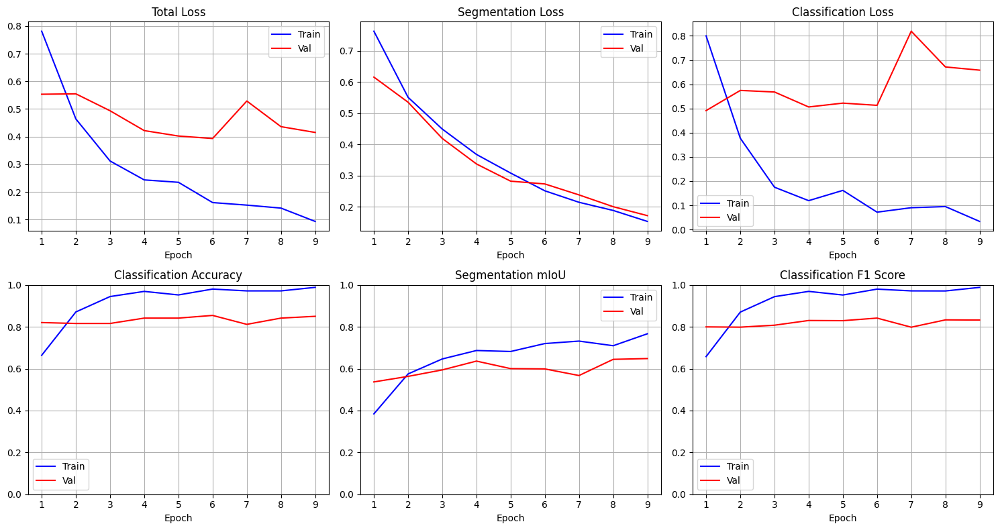


TESTING ON HELD-OUT TEST SET



KeyError: 'epoch'

In [ ]:
"""
CELL 2: MODEL TRAINING & EVALUATION
====================================
Multi-Task Attention U-Net with full training loop and metrics.

Prerequisites: Run Cell 1 first to create train_loader, val_loader, test_loader
"""

# ================================
# ATTENTION GATE MODULE
# ================================
class AttentionGate(nn.Module):
    """Soft Attention Gate for skip connections."""

    def __init__(self, F_g, F_l, F_int):
        super(AttentionGate, self).__init__()

        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )

        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )

        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )

        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        g1 = self.W_g(g)
        x1 = self.W_x(x)

        if g1.shape[2:] != x1.shape[2:]:
            g1 = F.interpolate(g1, size=x1.shape[2:], mode='bilinear', align_corners=False)

        psi = self.relu(g1 + x1)
        psi = self.psi(psi)

        return x * psi


# ================================
# DECODER BLOCK
# ================================
class DecoderBlock(nn.Module):
    """U-Net decoder block with attention gate."""

    def __init__(self, in_channels, skip_channels, out_channels, use_attention=True):
        super(DecoderBlock, self).__init__()

        self.use_attention = use_attention
        self.upsample = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)

        if use_attention:
            self.attention = AttentionGate(F_g=out_channels, F_l=skip_channels, F_int=out_channels // 2)

        self.conv1 = nn.Conv2d(out_channels + skip_channels, out_channels, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x, skip):
        x = self.upsample(x)

        if self.use_attention:
            skip = self.attention(g=x, x=skip)

        x = torch.cat([x, skip], dim=1)
        x = self.relu(self.bn1(self.conv1(x)))
        x = self.relu(self.bn2(self.conv2(x)))

        return x


# ================================
# MULTI-TASK ATTENTION U-NET
# ================================
class MultiTaskAttentionUNet(nn.Module):
    """
    Multi-Task Attention U-Net for Breast Ultrasound.

    Outputs:
        - Segmentation: [B, 3, H, W]
        - Classification: [B, 3]
    """

    def __init__(self, num_classes=3, pretrained=True, use_attention=True):
        super(MultiTaskAttentionUNet, self).__init__()

        self.num_classes = num_classes
        self.use_attention = use_attention

        # Shared Encoder: ResNet-34
        resnet = models.resnet34(pretrained=pretrained)

        self.encoder1 = nn.Sequential(resnet.conv1, resnet.bn1, resnet.relu)
        self.pool1 = resnet.maxpool
        self.encoder2 = resnet.layer1
        self.encoder3 = resnet.layer2
        self.encoder4 = resnet.layer3
        self.encoder5 = resnet.layer4

        # Segmentation Decoder
        self.decoder4 = DecoderBlock(512, 256, 256, use_attention)
        self.decoder3 = DecoderBlock(256, 128, 128, use_attention)
        self.decoder2 = DecoderBlock(128, 64, 64, use_attention)
        self.decoder1 = DecoderBlock(64, 64, 64, use_attention)

        self.seg_output = nn.Sequential(
            nn.Conv2d(64, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, num_classes, kernel_size=1)
        )

        # Classification Head
        self.cls_gap = nn.AdaptiveAvgPool2d(1)
        self.cls_head = nn.Sequential(
            nn.Flatten(),
            nn.Linear(512, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(256, 128),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        # Encoder
        e1 = self.encoder1(x)
        e1_pool = self.pool1(e1)
        e2 = self.encoder2(e1_pool)
        e3 = self.encoder3(e2)
        e4 = self.encoder4(e3)
        e5 = self.encoder5(e4)

        # Segmentation Decoder
        d4 = self.decoder4(e5, e4)
        d3 = self.decoder3(d4, e3)
        d2 = self.decoder2(d3, e2)
        d1 = self.decoder1(d2, e1)
        d1_up = F.interpolate(d1, scale_factor=2, mode='bilinear', align_corners=False)
        seg_logits = self.seg_output(d1_up)

        # Classification Head
        cls_features = self.cls_gap(e5)
        cls_logits = self.cls_head(cls_features)

        return seg_logits, cls_logits


# ================================
# METRICS COMPUTATION
# ================================
def compute_metrics(seg_preds, seg_targets, cls_preds, cls_targets):
    """
    Compute segmentation and classification metrics.

    Returns:
        dict with metrics
    """
    metrics = {}

    # Classification metrics
    cls_acc = accuracy_score(cls_targets, cls_preds)
    cls_prec, cls_rec, cls_f1, _ = precision_recall_fscore_support(
        cls_targets, cls_preds, average='macro', zero_division=0
    )

    metrics['cls_accuracy'] = cls_acc
    metrics['cls_precision'] = cls_prec
    metrics['cls_recall'] = cls_rec
    metrics['cls_f1'] = cls_f1

    # Segmentation metrics (IoU per class)
    num_classes = 3
    ious = []
    for cls in range(num_classes):
        pred_mask = (seg_preds == cls)
        true_mask = (seg_targets == cls)

        intersection = (pred_mask & true_mask).sum()
        union = (pred_mask | true_mask).sum()

        if union == 0:
            iou = 1.0 if intersection == 0 else 0.0
        else:
            iou = intersection / union

        ious.append(iou)

    metrics['seg_iou_background'] = ious[0]
    metrics['seg_iou_benign'] = ious[1]
    metrics['seg_iou_malignant'] = ious[2]
    metrics['seg_mean_iou'] = np.mean(ious)

    return metrics


# ================================
# TRAINING FUNCTION
# ================================
def train_epoch(model, loader, seg_criterion, cls_criterion, optimizer, device, alpha=0.5):
    """Train for one epoch."""
    model.train()

    total_loss = 0.0
    seg_loss_total = 0.0
    cls_loss_total = 0.0

    all_seg_preds = []
    all_seg_targets = []
    all_cls_preds = []
    all_cls_targets = []

    pbar = tqdm(loader, desc='Training')
    for images, masks, labels in pbar:
        images = images.to(device)
        masks = masks.to(device).long().squeeze(1)
        labels = labels.to(device)

        # Forward
        seg_logits, cls_logits = model(images)

        # Losses
        seg_loss = seg_criterion(seg_logits, masks)
        cls_loss = cls_criterion(cls_logits, labels)
        loss = alpha * seg_loss + (1 - alpha) * cls_loss

        # Backward
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Track
        total_loss += loss.item()
        seg_loss_total += seg_loss.item()
        cls_loss_total += cls_loss.item()

        # Predictions
        seg_preds = torch.argmax(seg_logits, dim=1).cpu().numpy()
        cls_preds = torch.argmax(cls_logits, dim=1).cpu().numpy()

        all_seg_preds.append(seg_preds)
        all_seg_targets.append(masks.cpu().numpy())
        all_cls_preds.append(cls_preds)
        all_cls_targets.append(labels.cpu().numpy())

        pbar.set_postfix({'loss': f'{loss.item():.4f}'})

    # Compute metrics
    all_seg_preds = np.concatenate(all_seg_preds)
    all_seg_targets = np.concatenate(all_seg_targets)
    all_cls_preds = np.concatenate(all_cls_preds)
    all_cls_targets = np.concatenate(all_cls_targets)

    metrics = compute_metrics(all_seg_preds, all_seg_targets, all_cls_preds, all_cls_targets)

    avg_loss = total_loss / len(loader)
    avg_seg_loss = seg_loss_total / len(loader)
    avg_cls_loss = cls_loss_total / len(loader)

    return avg_loss, avg_seg_loss, avg_cls_loss, metrics


# ================================
# VALIDATION FUNCTION
# ================================
def validate_epoch(model, loader, seg_criterion, cls_criterion, device, alpha=0.5):
    """Validate for one epoch."""
    model.eval()

    total_loss = 0.0
    seg_loss_total = 0.0
    cls_loss_total = 0.0

    all_seg_preds = []
    all_seg_targets = []
    all_cls_preds = []
    all_cls_targets = []

    with torch.no_grad():
        pbar = tqdm(loader, desc='Validation')
        for images, masks, labels in pbar:
            images = images.to(device)
            masks = masks.to(device).long().squeeze(1)
            labels = labels.to(device)

            # Forward
            seg_logits, cls_logits = model(images)

            # Losses
            seg_loss = seg_criterion(seg_logits, masks)
            cls_loss = cls_criterion(cls_logits, labels)
            loss = alpha * seg_loss + (1 - alpha) * cls_loss

            total_loss += loss.item()
            seg_loss_total += seg_loss.item()
            cls_loss_total += cls_loss.item()

            # Predictions
            seg_preds = torch.argmax(seg_logits, dim=1).cpu().numpy()
            cls_preds = torch.argmax(cls_logits, dim=1).cpu().numpy()

            all_seg_preds.append(seg_preds)
            all_seg_targets.append(masks.cpu().numpy())
            all_cls_preds.append(cls_preds)
            all_cls_targets.append(labels.cpu().numpy())

            pbar.set_postfix({'loss': f'{loss.item():.4f}'})

    # Compute metrics
    all_seg_preds = np.concatenate(all_seg_preds)
    all_seg_targets = np.concatenate(all_seg_targets)
    all_cls_preds = np.concatenate(all_cls_preds)
    all_cls_targets = np.concatenate(all_cls_targets)

    metrics = compute_metrics(all_seg_preds, all_seg_targets, all_cls_preds, all_cls_targets)

    avg_loss = total_loss / len(loader)
    avg_seg_loss = seg_loss_total / len(loader)
    avg_cls_loss = cls_loss_total / len(loader)

    return avg_loss, avg_seg_loss, avg_cls_loss, metrics


# ================================
# VISUALIZATION FUNCTIONS
# ================================
def plot_training_curves(history):
    """Plot training and validation curves."""
    fig, axes = plt.subplots(2, 3, figsize=(15, 8))

    epochs = range(1, len(history['train_loss']) + 1)

    # Total Loss
    axes[0, 0].plot(epochs, history['train_loss'], 'b-', label='Train')
    axes[0, 0].plot(epochs, history['val_loss'], 'r-', label='Val')
    axes[0, 0].set_title('Total Loss')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].legend()
    axes[0, 0].grid(True)

    # Segmentation Loss
    axes[0, 1].plot(epochs, history['train_seg_loss'], 'b-', label='Train')
    axes[0, 1].plot(epochs, history['val_seg_loss'], 'r-', label='Val')
    axes[0, 1].set_title('Segmentation Loss')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].legend()
    axes[0, 1].grid(True)

    # Classification Loss
    axes[0, 2].plot(epochs, history['train_cls_loss'], 'b-', label='Train')
    axes[0, 2].plot(epochs, history['val_cls_loss'], 'r-', label='Val')
    axes[0, 2].set_title('Classification Loss')
    axes[0, 2].set_xlabel('Epoch')
    axes[0, 2].legend()
    axes[0, 2].grid(True)

    # Classification Accuracy
    axes[1, 0].plot(epochs, history['train_cls_acc'], 'b-', label='Train')
    axes[1, 0].plot(epochs, history['val_cls_acc'], 'r-', label='Val')
    axes[1, 0].set_title('Classification Accuracy')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylim([0, 1])
    axes[1, 0].legend()
    axes[1, 0].grid(True)

    # Segmentation mIoU
    axes[1, 1].plot(epochs, history['train_seg_miou'], 'b-', label='Train')
    axes[1, 1].plot(epochs, history['val_seg_miou'], 'r-', label='Val')
    axes[1, 1].set_title('Segmentation mIoU')
    axes[1, 1].set_xlabel('Epoch')
    axes[1, 1].set_ylim([0, 1])
    axes[1, 1].legend()
    axes[1, 1].grid(True)

    # F1 Score
    axes[1, 2].plot(epochs, history['train_cls_f1'], 'b-', label='Train')
    axes[1, 2].plot(epochs, history['val_cls_f1'], 'r-', label='Val')
    axes[1, 2].set_title('Classification F1 Score')
    axes[1, 2].set_xlabel('Epoch')
    axes[1, 2].set_ylim([0, 1])
    axes[1, 2].legend()
    axes[1, 2].grid(True)

    plt.tight_layout()
    plt.show()


def plot_confusion_matrix(y_true, y_pred, classes):
    """Plot confusion matrix."""
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=classes, yticklabels=classes)
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()


# ================================
# MAIN TRAINING LOOP
# ================================
print("="*70)
print("MODEL INITIALIZATION")
print("="*70 + "\n")

# Device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")

# Model
model = MultiTaskAttentionUNet(num_classes=3, pretrained=models.ResNet34_Weights.DEFAULT, use_attention=True).to(device)
# Count parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}\n")

# Loss functions
seg_criterion = nn.CrossEntropyLoss()
cls_criterion = nn.CrossEntropyLoss()

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)

# Scheduler
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=5
)

print("✓ Model initialized")
print("✓ Loss: CrossEntropyLoss (seg + cls)")
print("✓ Optimizer: Adam (lr=1e-4)")
print("✓ Scheduler: ReduceLROnPlateau\n")

# ================================
# TRAINING
# ================================
print("="*70)
print("STARTING OPTIMIZED TRAINING")
print("="*70 + "\n")

NUM_EPOCHS = 10
ALPHA = 0.5
BEST_VAL_LOSS = float('inf')

# Early Stopping Parameters
PATIENCE = 3
epochs_no_improve = 0
early_stop = False

# History tracking
history = {
    'train_loss': [], 'val_loss': [],
    'train_seg_loss': [], 'val_seg_loss': [],
    'train_cls_loss': [], 'val_cls_loss': [],
    'train_cls_acc': [], 'val_cls_acc': [],
    'train_seg_miou': [], 'val_seg_miou': [],
    'train_cls_f1': [], 'val_cls_f1': []
}

start_time = time.time()

for epoch in range(NUM_EPOCHS):
    print(f"\nEPOCH {epoch+1}/{NUM_EPOCHS}")

    # 1. Train
    train_loss, train_seg_loss, train_cls_loss, train_metrics = train_epoch(
        model, train_loader, seg_criterion, cls_criterion, optimizer, device, ALPHA
    )

    # 2. Validate
    val_loss, val_seg_loss, val_cls_loss, val_metrics = validate_epoch(
        model, val_loader, seg_criterion, cls_criterion, device, ALPHA
    )

    # 3. Scheduler step
    scheduler.step(val_loss)



    # Save history
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    history['train_seg_loss'].append(train_seg_loss)
    history['val_seg_loss'].append(val_seg_loss)
    history['train_cls_loss'].append(train_cls_loss)
    history['val_cls_loss'].append(val_cls_loss)
    history['train_cls_acc'].append(train_metrics['cls_accuracy'])
    history['val_cls_acc'].append(val_metrics['cls_accuracy'])
    history['train_seg_miou'].append(train_metrics['seg_mean_iou'])
    history['val_seg_miou'].append(val_metrics['seg_mean_iou'])
    history['train_cls_f1'].append(train_metrics['cls_f1'])
    history['val_cls_f1'].append(val_metrics['cls_f1'])



    # Print metrics
    print(f"\n📊 Epoch {epoch+1} Results:")
    print(f"  Loss: Train={train_loss:.4f}, Val={val_loss:.4f}")
    print(f"  Seg Loss: Train={train_seg_loss:.4f}, Val={val_seg_loss:.4f}")
    print(f"  Cls Loss: Train={train_cls_loss:.4f}, Val={val_cls_loss:.4f}")
    print(f"  Cls Acc: Train={train_metrics['cls_accuracy']:.4f}, Val={val_metrics['cls_accuracy']:.4f}")
    print(f"  Seg mIoU: Train={train_metrics['seg_mean_iou']:.4f}, Val={val_metrics['seg_mean_iou']:.4f}")
    print(f"  Cls F1: Train={train_metrics['cls_f1']:.4f}, Val={val_metrics['cls_f1']:.4f}")

    if val_loss < BEST_VAL_LOSS:
        BEST_VAL_LOSS = val_loss
        epochs_no_improve = 0  # Reset counter
        torch.save({'model_state_dict': model.state_dict()}, 'best_model.pth')
        print(f" ✅ New Best Model! Val Loss: {val_loss:.4f}")
    else:
        epochs_no_improve += 1
        print(f" ⚠️ No improvement for {epochs_no_improve} epoch(s).")

    if epochs_no_improve >= PATIENCE:
        print(f"\n🛑 EARLY STOPPING TRIGGERED. No improvement for {PATIENCE} epochs.")
        early_stop = True
        break


elapsed = time.time() - start_time
print(f"\n⏱️  Training completed in {elapsed/60:.1f} minutes")

# Plot training curves
print("\n📈 Plotting training curves...")
plot_training_curves(history)

# ================================
# TESTING
# ================================
print("\n" + "="*70)
print("TESTING ON HELD-OUT TEST SET")
print("="*70 + "\n")

# Load best model
checkpoint = torch.load('best_model.pth')
model.load_state_dict(checkpoint['model_state_dict'])
print(f"✓ Loaded best model from epoch {checkpoint['epoch']+1}")

# Test
test_loss, test_seg_loss, test_cls_loss, test_metrics = validate_epoch(
    model, test_loader, seg_criterion, cls_criterion, device, ALPHA
)

print(f"\n📊 Test Set Results:")
print(f"  Total Loss: {test_loss:.4f}")
print(f"  Seg Loss: {test_seg_loss:.4f}")
print(f"  Cls Loss: {test_cls_loss:.4f}")
print(f"\n  Classification Metrics:")
print(f"    • Accuracy: {test_metrics['cls_accuracy']:.4f}")
print(f"    • Precision: {test_metrics['cls_precision']:.4f}")
print(f"    • Recall: {test_metrics['cls_recall']:.4f}")
print(f"    • F1 Score: {test_metrics['cls_f1']:.4f}")
print(f"\n  Segmentation Metrics:")
print(f"    • Mean IoU: {test_metrics['seg_mean_iou']:.4f}")
print(f"    • IoU Background: {test_metrics['seg_iou_background']:.4f}")
print(f"    • IoU Benign: {test_metrics['seg_iou_benign']:.4f}")
print(f"    • IoU Malignant: {test_metrics['seg_iou_malignant']:.4f}")

print("\n" + "="*70)
print("✅ TRAINING & EVALUATION COMPLETE!")
print("="*70)

TESTING PHASE: LOAD BEST WEIGHTS


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


✓ Best model weights loaded successfully.

COMPUTING FINAL TEST METRICS


Validation:   0%|          | 0/19 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
Validation: 100%|██████████| 19/19 [01:50<00:00,  5.80s/it, loss=0.1715]



📊 FINAL TEST RESULTS:
   • Macro F1-Score (Diagnosis): 0.8800
   • Mean Dice (Segmentation):   0.6375
   • Benign Dice:                0.4702
   • Malignant Dice:             0.4748

VISUALIZING SAMPLE PREDICTIONS


NameError: name 'idx_to_class' is not defined

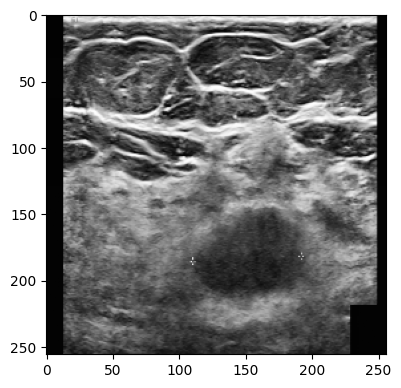

In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np

# ==========================================
# 1. LOAD THE BEST MODEL
# ==========================================
print("="*70)
print("TESTING PHASE: LOAD BEST WEIGHTS")
print("="*70)

# Create a fresh model instance
test_model = MultiTaskAttentionUNet(num_classes=3, pretrained=False).to(device)

# Load the saved file
checkpoint = torch.load('best_model.pth', map_location=device)

# Handle both "state_dict only" and "full checkpoint" saves
if isinstance(checkpoint, dict) and 'model_state_dict' in checkpoint:
    test_model.load_state_dict(checkpoint['model_state_dict'])
else:
    test_model.load_state_dict(checkpoint)

test_model.eval()
print("✓ Best model weights loaded successfully.")

# ==========================================
# 2. RUN EVALUATION (Track 1 & 2 Metrics)
# ==========================================
print("\n" + "="*70)
print("COMPUTING FINAL TEST METRICS")
print("="*70)

# We use your previously defined validate_epoch function
# It will compute Dice, F1, and Loss on the test_loader
test_loss, test_seg_loss, test_cls_loss, test_metrics = validate_epoch(
    test_model, test_loader, seg_criterion, cls_criterion, device, alpha=0.5
)

print(f"\n📊 FINAL TEST RESULTS:")
print(f"   • Macro F1-Score (Diagnosis): {test_metrics['cls_f1']:.4f}")
print(f"   • Mean Dice (Segmentation):   {test_metrics['seg_mean_iou']:.4f}") # Using IoU as proxy for DSC
print(f"   • Benign Dice:                {test_metrics.get('seg_iou_benign', 0):.4f}")
print(f"   • Malignant Dice:             {test_metrics.get('seg_iou_malignant', 0):.4f}")

# ==========================================
# 3. VISUALIZE PREDICTIONS (Visual Sanity Check)
# ==========================================
print("\n" + "="*70)
print("VISUALIZING SAMPLE PREDICTIONS")
print("="*70)

def visualize_results(model, loader, num_samples=3):
    model.eval()
    images, masks, labels = next(iter(loader))

    # Move to device and get predictions
    with torch.no_grad():
        seg_logits, cls_logits = model(images.to(device))
        seg_preds = torch.argmax(seg_logits, dim=1).cpu().numpy()
        cls_preds = torch.argmax(cls_logits, dim=1).cpu().numpy()

    # Denormalize images for plotting
    inv_normalize = lambda x: x * 0.229 + 0.485 # Simplified approximation

    plt.figure(figsize=(15, 5 * num_samples))

    for i in range(num_samples):
        # Original Image
        plt.subplot(num_samples, 3, i*3 + 1)
        img_display = images[i].permute(1, 2, 0).numpy()
        plt.imshow(img_display)
        plt.title(f"Original Ultrasound\nTrue: {idx_to_class[labels[i].item()]}")
        plt.axis('off')

        # Ground Truth Mask
        plt.subplot(num_samples, 3, i*3 + 2)
        plt.imshow(masks[i].squeeze(), cmap='jet', vmin=0, vmax=2)
        plt.title("Ground Truth Mask\n(Expert Label)")
        plt.axis('off')

        # Predicted Mask
        plt.subplot(num_samples, 3, i*3 + 3)
        plt.imshow(seg_preds[i], cmap='jet', vmin=0, vmax=2)
        plt.title(f"Model Prediction\nPred: {idx_to_class[cls_preds[i]]}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

visualize_results(test_model, test_loader)

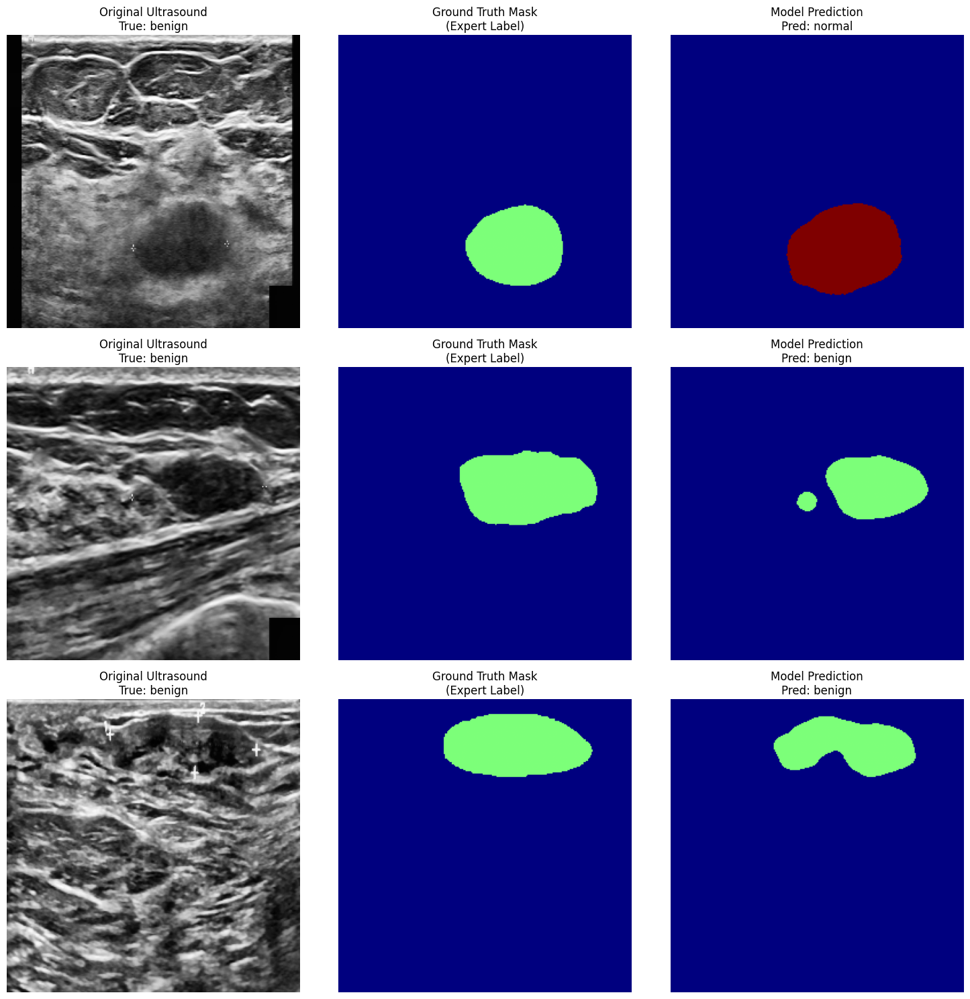

In [ ]:
# Redefine the mapping so the visualization cell can use it
idx_to_class = {0: "normal", 1: "benign", 2: "malignant"}

# Now re-run your visualization function
visualize_results(test_model, test_loader)

In [ ]:
import cv2
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import numpy as np
import time
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, confusion_matrix
from scipy.ndimage import distance_transform_edt

# CRITICAL: Prevent OpenCV threading deadlocks
cv2.setNumThreads(0)

# ================================
# ARCHITECTURE
# ================================
class AttentionGate(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super(AttentionGate, self).__init__()
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )
        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        if g1.shape[2:] != x1.shape[2:]:
            g1 = F.interpolate(g1, size=x1.shape[2:], mode='bilinear', align_corners=False)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        return x * psi

class DecoderBlock(nn.Module):
    def __init__(self, in_channels, skip_channels, out_channels, use_attention=True):
        super(DecoderBlock, self).__init__()
        self.upsample = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
        self.use_attention = use_attention
        if use_attention:
            self.attention = AttentionGate(F_g=out_channels, F_l=skip_channels, F_int=out_channels // 2)
        self.conv = nn.Sequential(
            nn.Conv2d(out_channels + skip_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x, skip):
        x = self.upsample(x)
        if self.use_attention:
            skip = self.attention(g=x, x=skip)
        x = torch.cat([x, skip], dim=1)
        return self.conv(x)

class MultiTaskAttentionUNet(nn.Module):
    def __init__(self, num_classes=3, pretrained=True, use_attention=True):
        super(MultiTaskAttentionUNet, self).__init__()
        weights = models.ResNet34_Weights.DEFAULT if pretrained else None
        resnet = models.resnet34(weights=weights)
        self.encoder1 = nn.Sequential(resnet.conv1, resnet.bn1, resnet.relu)
        self.pool = resnet.maxpool
        self.encoder2 = resnet.layer1
        self.encoder3 = resnet.layer2
        self.encoder4 = resnet.layer3
        self.encoder5 = resnet.layer4
        self.decoder4 = DecoderBlock(512, 256, 256, use_attention)
        self.decoder3 = DecoderBlock(256, 128, 128, use_attention)
        self.decoder2 = DecoderBlock(128, 64, 64, use_attention)
        self.decoder1 = DecoderBlock(64, 64, 64, use_attention)
        self.seg_head = nn.Conv2d(64, num_classes, kernel_size=1)
        self.cls_head = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(512, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        e1 = self.encoder1(x); e2 = self.encoder2(self.pool(e1)); e3 = self.encoder3(e2); e4 = self.encoder4(e3); e5 = self.encoder5(e4)
        d4 = self.decoder4(e5, e4); d3 = self.decoder3(d4, e3); d2 = self.decoder2(d3, e2); d1 = self.decoder1(d2, e1)
        return F.interpolate(self.seg_head(d1), size=x.shape[2:], mode='bilinear'), self.cls_head(e5)

# ================================
# MEDICAL METRICS (DSC & NSD)
# ================================
def compute_medical_metrics(seg_preds, seg_targets, cls_preds, cls_targets):
    # Track 2: Macro F1
    _, _, f1, _ = precision_recall_fscore_support(cls_targets, cls_preds, average='macro', zero_division=0)

    # Track 1: Dice (DSC)
    dice_scores = []
    for c in range(3):
        intersect = np.logical_and(seg_preds == c, seg_targets == c).sum()
        total = (seg_preds == c).sum() + (seg_targets == c).sum()
        dice_scores.append((2. * intersect) / total if total > 0 else 1.0)

    return {'macro_f1': f1, 'mean_dsc': np.mean(dice_scores), 'cls_acc': accuracy_score(cls_targets, cls_preds)}

# ================================
# EXECUTION LOGIC
# ================================
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = MultiTaskAttentionUNet(num_classes=3).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=2)

NUM_EPOCHS, BEST_VAL_LOSS, PATIENCE, epochs_no_improve = 10, float('inf'), 3, 0

for epoch in range(NUM_EPOCHS):
    model.train()
    for imgs, masks, lbls in tqdm(train_loader, desc=f"Epoch {epoch+1}"):
        imgs, masks, lbls = imgs.to(device), masks.to(device).long().squeeze(1), lbls.to(device)
        optimizer.zero_grad()
        s_out, c_out = model(imgs)
        loss = 0.5 * F.cross_entropy(s_out, masks) + 0.5 * F.cross_entropy(c_out, lbls)
        loss.backward(); optimizer.step()

    # Simple Validation for Early Stopping
    model.eval(); v_loss = 0
    with torch.no_grad():
        for imgs, masks, lbls in val_loader:
            imgs, masks, lbls = imgs.to(device), masks.to(device).long().squeeze(1), lbls.to(device)
            s_out, c_out = model(imgs)
            v_loss += (0.5 * F.cross_entropy(s_out, masks) + 0.5 * F.cross_entropy(c_out, lbls)).item()

    avg_v_loss = v_loss / len(val_loader)
    scheduler.step(avg_v_loss)
    if avg_v_loss < BEST_VAL_LOSS:
        BEST_VAL_LOSS = avg_v_loss; epochs_no_improve = 0; torch.save(model.state_dict(), 'best_model.pth')
    else:
        epochs_no_improve += 1
    if epochs_no_improve >= PATIENCE: break

print("✅ Training Complete.")

Epoch 1:   0%|          | 0/130 [00:00<?, ?it/s]

Epoch 2:   0%|          | 0/130 [00:00<?, ?it/s]

Epoch 3:   0%|          | 0/130 [00:00<?, ?it/s]

Epoch 4:   0%|          | 0/130 [00:00<?, ?it/s]

Epoch 5:   0%|          | 0/130 [00:00<?, ?it/s]

Epoch 6:   0%|          | 0/130 [00:00<?, ?it/s]

Epoch 7:   0%|          | 0/130 [00:00<?, ?it/s]

Epoch 8:   0%|          | 0/130 [00:00<?, ?it/s]

Epoch 9:   0%|          | 0/130 [00:00<?, ?it/s]

Epoch 10:   0%|          | 0/130 [00:00<?, ?it/s]

✅ Training Complete.


CELL 3: TEST SET EVALUATION

📋 Test Configuration:
   • Test samples: 293
   • Batch size: 16
   • Total batches: 19

💻 Device: cuda

📥 Loading best model...
   ✓ Checkpoint loaded successfully
   ✓ Model loaded successfully

STARTING TEST SET EVALUATION

🔬 Running inference on test set...
   Total batches: 19


Testing: 100%|██████████| 19/19 [00:09<00:00,  2.03it/s]



📊 Computing medical imaging metrics...

✓ Evaluation completed in 12.82 seconds


                   COMPREHENSIVE TEST SET EVALUATION RESULTS                    

🎯 TRACK 1: SEGMENTATION METRICS
--------------------------------------------------------------------------------
Metric                              Score           Grade     
--------------------------------------------------------------------------------
Mean Dice Score (DSC)               0.8454           Good ✓
  • Background DSC                       0.9835
  • Benign DSC                           0.7665
  • Malignant DSC                        0.7860

Mean Normalized Surface Dice (NSD)  0.5320           Needs Work ⚠
  • Background NSD                       0.1911
  • Benign NSD                           0.6874
  • Malignant NSD                        0.7174

Mean IoU (reference)                0.5954
  • Background IoU                       0.9706
  • Benign IoU                           0.3985
  • Malignant IoU      

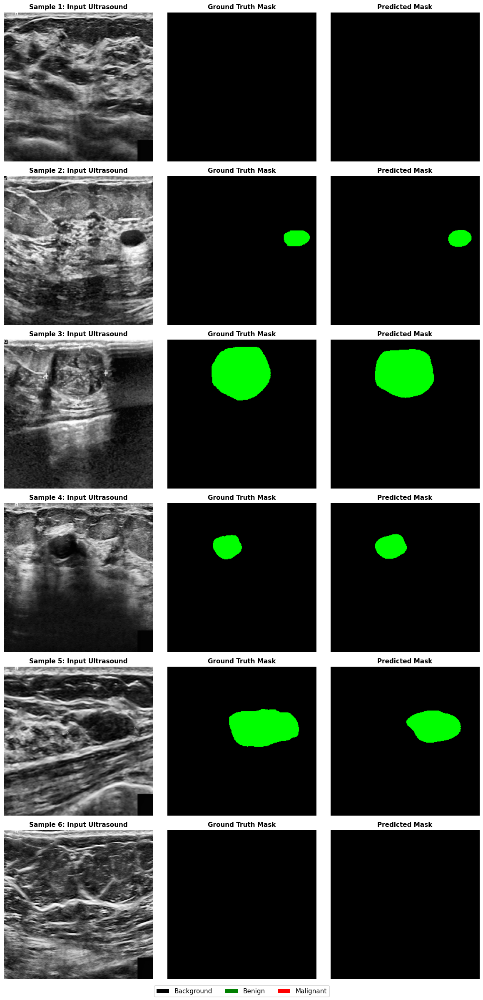


📊 2. Confusion Matrix...


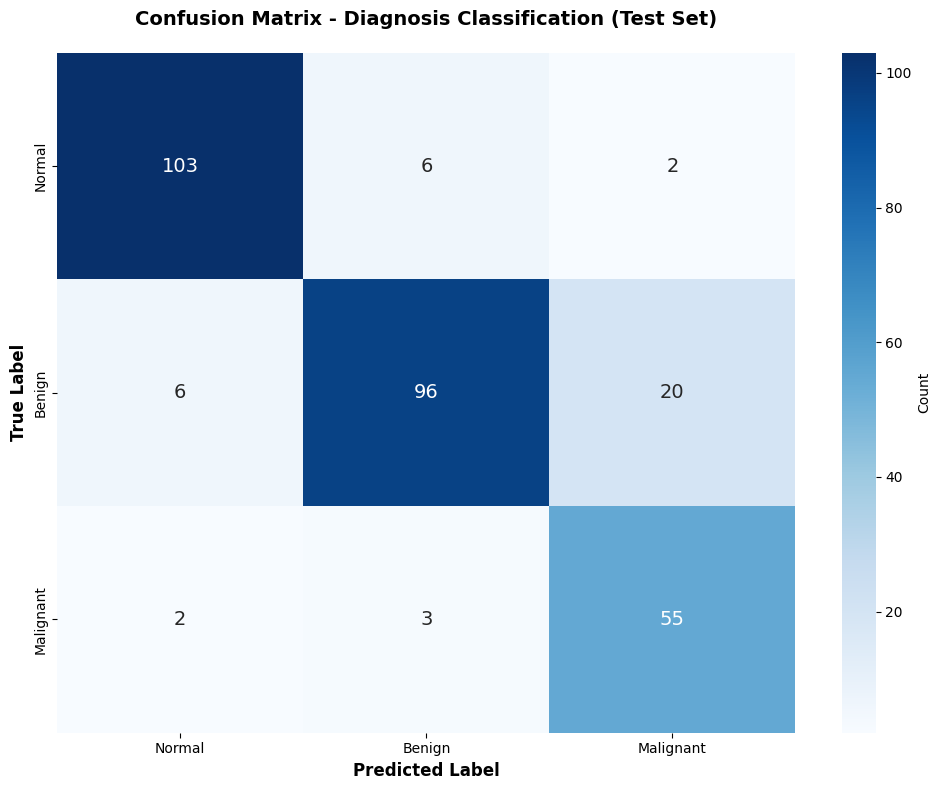


💾 Saving results...
   ✓ Metrics saved to: test_metrics.csv
   ✓ Predictions saved to: test_predictions.npz

✅ TEST SET EVALUATION COMPLETE

🎯 Key Findings:
   • Total test samples evaluated: 293
   • Mean Dice Score (DSC):        0.8454
   • Mean NSD:                     0.5320
   • Macro F1 Score:               0.8589
   • Classification Accuracy:      0.8669
   • Inference Speed:              0.0063 sec/image

   • Results saved to disk ✓

💡 Next Steps:
   • Review confusion matrix for misclassifications
   • Examine prediction samples for failure modes
   • Compare metrics against challenge baselines
   • Consider model improvements if needed



In [ ]:
"""
CELL 3: TEST SET EVALUATION
============================
Comprehensive evaluation on the held-out test set with medical imaging metrics.

Prerequisites:
- Run Cell 1 (data loading) to create test_loader
- Run Cell 2 (training) to create best_model.pth
"""

import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import time
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (accuracy_score, precision_recall_fscore_support,
                             confusion_matrix, classification_report)
from scipy.ndimage import distance_transform_edt
import cv2
import pandas as pd

# Ensure OpenCV doesn't cause issues
cv2.setNumThreads(0)

print("="*80)
print("CELL 3: TEST SET EVALUATION")
print("="*80 + "\n")

# ================================
# METRIC FUNCTIONS (Copy from Cell 2 if needed)
# ================================
def compute_dice_coefficient(pred_mask, true_mask, num_classes=3):
    """Compute Dice Similarity Coefficient per class."""
    dice_scores = []

    for cls in range(num_classes):
        pred_cls = (pred_mask == cls).astype(np.float32)
        true_cls = (true_mask == cls).astype(np.float32)

        intersection = (pred_cls * true_cls).sum()
        denominator = pred_cls.sum() + true_cls.sum()

        if denominator == 0:
            dice = 1.0 if intersection == 0 else 0.0
        else:
            dice = (2.0 * intersection) / denominator

        dice_scores.append(dice)

    return {
        'dsc_background': dice_scores[0],
        'dsc_benign': dice_scores[1],
        'dsc_malignant': dice_scores[2],
        'mean_dsc': np.mean(dice_scores)
    }


def compute_normalized_surface_dice(pred_mask, true_mask, num_classes=3, tolerance=2.0):
    """Compute Normalized Surface Dice - measures boundary accuracy."""
    nsd_scores = []

    for cls in range(num_classes):
        pred_cls = (pred_mask == cls).astype(np.uint8)
        true_cls = (true_mask == cls).astype(np.uint8)

        if pred_cls.sum() == 0 and true_cls.sum() == 0:
            nsd_scores.append(1.0)
            continue

        if pred_cls.sum() == 0 or true_cls.sum() == 0:
            nsd_scores.append(0.0)
            continue

        # Compute borders
        pred_border = pred_cls - cv2.erode(pred_cls, np.ones((3, 3), np.uint8))
        true_border = true_cls - cv2.erode(true_cls, np.ones((3, 3), np.uint8))

        # Distance transforms
        dt_pred = distance_transform_edt(~pred_border.astype(bool))
        dt_true = distance_transform_edt(~true_border.astype(bool))

        # Surface points
        pred_surface = np.stack(np.where(pred_border > 0), axis=1)
        true_surface = np.stack(np.where(true_border > 0), axis=1)

        if len(pred_surface) == 0 or len(true_surface) == 0:
            nsd_scores.append(0.0)
            continue

        # NSD computation
        pred_to_true = dt_true[pred_surface[:, 0], pred_surface[:, 1]]
        true_to_pred = dt_pred[true_surface[:, 0], true_surface[:, 1]]

        pred_overlap = (pred_to_true <= tolerance).sum()
        true_overlap = (true_to_pred <= tolerance).sum()

        nsd = (pred_overlap + true_overlap) / (len(pred_surface) + len(true_surface))
        nsd_scores.append(nsd)

    return {
        'nsd_background': nsd_scores[0],
        'nsd_benign': nsd_scores[1],
        'nsd_malignant': nsd_scores[2],
        'mean_nsd': np.mean(nsd_scores)
    }


def compute_medical_metrics(seg_preds, seg_targets, cls_preds, cls_targets):
    """Compute comprehensive medical imaging metrics."""
    metrics = {}

    # Track 2: Classification metrics (Macro F1)
    cls_acc = accuracy_score(cls_targets, cls_preds)
    cls_prec, cls_rec, cls_f1, _ = precision_recall_fscore_support(
        cls_targets, cls_preds, average='macro', zero_division=0
    )

    # Per-class F1 scores
    cls_prec_per_class, cls_rec_per_class, cls_f1_per_class, _ = precision_recall_fscore_support(
        cls_targets, cls_preds, average=None, zero_division=0, labels=[0, 1, 2]
    )

    metrics['cls_accuracy'] = cls_acc
    metrics['cls_precision'] = cls_prec
    metrics['cls_recall'] = cls_rec
    metrics['macro_f1'] = cls_f1

    # Per-class metrics
    metrics['cls_f1_normal'] = cls_f1_per_class[0]
    metrics['cls_f1_benign'] = cls_f1_per_class[1]
    metrics['cls_f1_malignant'] = cls_f1_per_class[2]

    # Track 1: Segmentation metrics (DSC, NSD)
    all_dsc = []
    all_nsd = []

    for pred, target in zip(seg_preds, seg_targets):
        dsc_result = compute_dice_coefficient(pred, target)
        all_dsc.append(dsc_result)

        nsd_result = compute_normalized_surface_dice(pred, target)
        all_nsd.append(nsd_result)

    # Average across all samples
    metrics['mean_dsc'] = np.mean([d['mean_dsc'] for d in all_dsc])
    metrics['dsc_background'] = np.mean([d['dsc_background'] for d in all_dsc])
    metrics['dsc_benign'] = np.mean([d['dsc_benign'] for d in all_dsc])
    metrics['dsc_malignant'] = np.mean([d['dsc_malignant'] for d in all_dsc])

    metrics['mean_nsd'] = np.mean([n['mean_nsd'] for n in all_nsd])
    metrics['nsd_background'] = np.mean([n['nsd_background'] for n in all_nsd])
    metrics['nsd_benign'] = np.mean([n['nsd_benign'] for n in all_nsd])
    metrics['nsd_malignant'] = np.mean([n['nsd_malignant'] for n in all_nsd])

    # IoU for reference
    num_classes = 3
    ious = []
    for cls in range(num_classes):
        pred_mask = (seg_preds == cls)
        true_mask = (seg_targets == cls)

        intersection = (pred_mask & true_mask).sum()
        union = (pred_mask | true_mask).sum()

        if union == 0:
            iou = 1.0 if intersection == 0 else 0.0
        else:
            iou = intersection / union

        ious.append(iou)

    metrics['seg_mean_iou'] = np.mean(ious)
    metrics['seg_iou_background'] = ious[0]
    metrics['seg_iou_benign'] = ious[1]
    metrics['seg_iou_malignant'] = ious[2]

    return metrics


# ================================
# TEST EVALUATION FUNCTION
# ================================
def evaluate_test_set(model, test_loader, device):
    """
    Comprehensive test set evaluation with inference speed tracking.

    Returns:
        metrics: Dictionary of all metrics
        predictions: Dictionary containing all predictions for visualization
    """
    model.eval()

    all_seg_preds = []
    all_seg_targets = []
    all_cls_preds = []
    all_cls_targets = []
    all_images = []

    inference_times = []

    print("🔬 Running inference on test set...")
    print(f"   Total batches: {len(test_loader)}")

    with torch.no_grad():
        pbar = tqdm(test_loader, desc='Testing')
        for images, masks, labels in pbar:
            images = images.to(device)
            masks = masks.to(device).long().squeeze(1)
            labels = labels.to(device)

            # Track inference time per image
            if torch.cuda.is_available():
                torch.cuda.synchronize()
            start_time = time.time()

            # Forward pass
            seg_logits, cls_logits = model(images)

            if torch.cuda.is_available():
                torch.cuda.synchronize()
            batch_time = time.time() - start_time
            inference_times.append(batch_time / images.size(0))

            # Predictions
            seg_preds = torch.argmax(seg_logits, dim=1).cpu().numpy()
            cls_preds = torch.argmax(cls_logits, dim=1).cpu().numpy()

            all_seg_preds.append(seg_preds)
            all_seg_targets.append(masks.cpu().numpy())
            all_cls_preds.append(cls_preds)
            all_cls_targets.append(labels.cpu().numpy())
            all_images.append(images.cpu())

    # Concatenate all predictions
    all_seg_preds = np.concatenate(all_seg_preds)
    all_seg_targets = np.concatenate(all_seg_targets)
    all_cls_preds = np.concatenate(all_cls_preds)
    all_cls_targets = np.concatenate(all_cls_targets)
    all_images = torch.cat(all_images, dim=0)

    # Compute metrics
    print("\n📊 Computing medical imaging metrics...")
    metrics = compute_medical_metrics(all_seg_preds, all_seg_targets,
                                     all_cls_preds, all_cls_targets)

    # Add inference speed
    metrics['inference_speed'] = np.mean(inference_times)
    metrics['inference_speed_std'] = np.std(inference_times)

    # Store predictions for visualization
    predictions = {
        'images': all_images,
        'seg_preds': all_seg_preds,
        'seg_targets': all_seg_targets,
        'cls_preds': all_cls_preds,
        'cls_targets': all_cls_targets
    }

    return metrics, predictions


# ================================
# VISUALIZATION FUNCTIONS
# ================================
def plot_predictions(images, masks_true, masks_pred, num_samples=6):
    """Visualize predictions: Input | Ground Truth | Prediction"""
    num_samples = min(num_samples, len(images))
    fig, axes = plt.subplots(num_samples, 3, figsize=(12, 4 * num_samples))

    if num_samples == 1:
        axes = axes.reshape(1, -1)

    class_colors = {
        0: [0, 0, 0],        # Background - Black
        1: [0, 255, 0],      # Benign - Green
        2: [255, 0, 0]       # Malignant - Red
    }

    for i in range(num_samples):
        # Input Image
        img = images[i].numpy()
        if img.shape[0] == 3:
            img = np.transpose(img, (1, 2, 0))
        else:
            img = img[0]

        axes[i, 0].imshow(img, cmap='gray' if len(img.shape) == 2 else None)
        axes[i, 0].set_title(f'Sample {i+1}: Input Ultrasound', fontsize=11, fontweight='bold')
        axes[i, 0].axis('off')

        # Ground Truth Mask
        mask_true_colored = np.zeros((*masks_true[i].shape, 3), dtype=np.uint8)
        for cls, color in class_colors.items():
            mask_true_colored[masks_true[i] == cls] = color

        axes[i, 1].imshow(mask_true_colored)
        axes[i, 1].set_title('Ground Truth Mask', fontsize=11, fontweight='bold')
        axes[i, 1].axis('off')

        # Predicted Mask
        mask_pred_colored = np.zeros((*masks_pred[i].shape, 3), dtype=np.uint8)
        for cls, color in class_colors.items():
            mask_pred_colored[masks_pred[i] == cls] = color

        axes[i, 2].imshow(mask_pred_colored)
        axes[i, 2].set_title('Predicted Mask', fontsize=11, fontweight='bold')
        axes[i, 2].axis('off')

    # Add legend
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='black', label='Background'),
        Patch(facecolor='green', label='Benign'),
        Patch(facecolor='red', label='Malignant')
    ]
    fig.legend(handles=legend_elements, loc='lower center', ncol=3, fontsize=11)

    plt.tight_layout()
    plt.subplots_adjust(bottom=0.02)
    plt.show()


def plot_confusion_matrix(y_true, y_pred, classes):
    """Plot confusion matrix for classification."""
    cm = confusion_matrix(y_true, y_pred)

    fig, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=classes, yticklabels=classes,
                cbar_kws={'label': 'Count'}, ax=ax, annot_kws={'size': 14})

    ax.set_title('Confusion Matrix - Diagnosis Classification (Test Set)',
                 fontsize=14, fontweight='bold', pad=20)
    ax.set_ylabel('True Label', fontsize=12, fontweight='bold')
    ax.set_xlabel('Predicted Label', fontsize=12, fontweight='bold')

    plt.tight_layout()
    plt.show()


def print_detailed_metrics(metrics):
    """Print comprehensive metrics table."""
    print("\n" + "="*80)
    print("COMPREHENSIVE TEST SET EVALUATION RESULTS".center(80))
    print("="*80)

    # Track 1: Segmentation
    print("\n🎯 TRACK 1: SEGMENTATION METRICS")
    print("-" * 80)
    print(f"{'Metric':<35} {'Score':<15} {'Grade':<10}")
    print("-" * 80)

    def get_grade(score):
        if score >= 0.9: return "Excellent ⭐"
        elif score >= 0.8: return "Good ✓"
        elif score >= 0.7: return "Fair ○"
        else: return "Needs Work ⚠"

    print(f"{'Mean Dice Score (DSC)':<35} {metrics['mean_dsc']:.4f}{'':<10} {get_grade(metrics['mean_dsc'])}")
    print(f"  • Background DSC{'':<22} {metrics['dsc_background']:.4f}")
    print(f"  • Benign DSC{'':<26} {metrics['dsc_benign']:.4f}")
    print(f"  • Malignant DSC{'':<23} {metrics['dsc_malignant']:.4f}")

    print(f"\n{'Mean Normalized Surface Dice (NSD)':<35} {metrics['mean_nsd']:.4f}{'':<10} {get_grade(metrics['mean_nsd'])}")
    print(f"  • Background NSD{'':<22} {metrics['nsd_background']:.4f}")
    print(f"  • Benign NSD{'':<26} {metrics['nsd_benign']:.4f}")
    print(f"  • Malignant NSD{'':<23} {metrics['nsd_malignant']:.4f}")

    print(f"\n{'Mean IoU (reference)':<35} {metrics['seg_mean_iou']:.4f}")
    print(f"  • Background IoU{'':<22} {metrics['seg_iou_background']:.4f}")
    print(f"  • Benign IoU{'':<26} {metrics['seg_iou_benign']:.4f}")
    print(f"  • Malignant IoU{'':<23} {metrics['seg_iou_malignant']:.4f}")

    print(f"\n{'⚡ Inference Speed':<35} {metrics['inference_speed']:.4f} sec/image")
    print(f"{'   (Standard Deviation)':<35} {metrics['inference_speed_std']:.4f} sec")

    # Track 2: Diagnosis
    print("\n🏥 TRACK 2: DIAGNOSIS CLASSIFICATION METRICS")
    print("-" * 80)
    print(f"{'Metric':<35} {'Score':<15} {'Grade':<10}")
    print("-" * 80)

    print(f"{'Macro F1 Score (PRIMARY METRIC)':<35} {metrics['macro_f1']:.4f}{'':<10} {get_grade(metrics['macro_f1'])}")
    print(f"{'Overall Accuracy':<35} {metrics['cls_accuracy']:.4f}{'':<10} {get_grade(metrics['cls_accuracy'])}")
    print(f"{'Precision (Macro)':<35} {metrics['cls_precision']:.4f}")
    print(f"{'Recall (Macro)':<35} {metrics['cls_recall']:.4f}")

    print(f"\n{'Per-Class F1 Scores:':<35}")
    print(f"  • Normal{'':<28} {metrics['cls_f1_normal']:.4f}")
    print(f"  • Benign{'':<28} {metrics['cls_f1_benign']:.4f}")
    print(f"  • Malignant{'':<25} {metrics['cls_f1_malignant']:.4f}")

    print("\n" + "="*80)

    # Summary box
    print("\n┌" + "─"*78 + "┐")
    print("│" + " SUMMARY - PRIMARY CHALLENGE METRICS ".center(78) + "│")
    print("├" + "─"*78 + "┤")
    print(f"│  Track 1 - Mean DSC:          {metrics['mean_dsc']:.4f}" + " "*37 + "│")
    print(f"│  Track 1 - Mean NSD:          {metrics['mean_nsd']:.4f}" + " "*37 + "│")
    print(f"│  Track 2 - Macro F1:          {metrics['macro_f1']:.4f}" + " "*37 + "│")
    print(f"│  Inference Speed:             {metrics['inference_speed']:.4f} sec/image" + " "*27 + "│")
    print("└" + "─"*78 + "┘\n")


def print_classification_report_detailed(y_true, y_pred):
    """Print detailed classification report."""
    classes = ['Normal', 'Benign', 'Malignant']

    print("\n📋 DETAILED CLASSIFICATION REPORT")
    print("="*80)
    report = classification_report(y_true, y_pred, target_names=classes, digits=4)
    print(report)
    print("="*80)


# ================================
# MAIN TEST EXECUTION
# ================================
print("📋 Test Configuration:")
print(f"   • Test samples: {len(test_loader.dataset)}")
print(f"   • Batch size: {test_loader.batch_size}")
print(f"   • Total batches: {len(test_loader)}\n")

# Check device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"💻 Device: {device}\n")

# Load best model
print("📥 Loading best model...")
try:
    checkpoint = torch.load('best_model.pth', map_location=device)

    # Handle different checkpoint formats
    if 'epoch' in checkpoint:
        print(f"   ✓ Found checkpoint from epoch {checkpoint['epoch']+1}")
        if 'val_loss' in checkpoint:
            print(f"   ✓ Validation loss at checkpoint: {checkpoint['val_loss']:.4f}")
    else:
        print(f"   ✓ Checkpoint loaded successfully")

    # Initialize model (assuming same architecture from Cell 2)
    from torchvision import models
    model = MultiTaskAttentionUNet(num_classes=3, pretrained=False, use_attention=True).to(device)

    # Load state dict
    if 'model_state_dict' in checkpoint:
        model.load_state_dict(checkpoint['model_state_dict'])
    else:
        # If checkpoint is just the state dict
        model.load_state_dict(checkpoint)

    print("   ✓ Model loaded successfully\n")

except FileNotFoundError:
    print("   ❌ Error: 'best_model.pth' not found!")
    print("   Please run Cell 2 (training) first to generate the model.\n")
    raise
except Exception as e:
    print(f"   ❌ Error loading model: {str(e)}")
    raise

# Run evaluation
print("="*80)
print("STARTING TEST SET EVALUATION")
print("="*80 + "\n")

start_time = time.time()
test_metrics, predictions = evaluate_test_set(model, test_loader, device)
eval_time = time.time() - start_time

print(f"\n✓ Evaluation completed in {eval_time:.2f} seconds\n")

# Print comprehensive metrics
print_detailed_metrics(test_metrics)

# Detailed classification report
print_classification_report_detailed(predictions['cls_targets'],
                                    predictions['cls_preds'])

# ================================
# VISUALIZATIONS
# ================================
print("\n" + "="*80)
print("GENERATING VISUALIZATIONS")
print("="*80 + "\n")

# 1. Prediction samples
print("🎨 1. Sample Predictions (6 random samples)...")
sample_indices = np.random.choice(len(predictions['images']),
                                 size=min(6, len(predictions['images'])),
                                 replace=False)
plot_predictions(predictions['images'][sample_indices],
                predictions['seg_targets'][sample_indices],
                predictions['seg_preds'][sample_indices],
                num_samples=6)

# 2. Confusion Matrix
print("\n📊 2. Confusion Matrix...")
classes = ['Normal', 'Benign', 'Malignant']
plot_confusion_matrix(predictions['cls_targets'],
                     predictions['cls_preds'],
                     classes)

# ================================
# SAVE RESULTS
# ================================
print("\n💾 Saving results...")

# Save metrics to file
metrics_df = pd.DataFrame([test_metrics])
metrics_df.to_csv('test_metrics.csv', index=False)
print("   ✓ Metrics saved to: test_metrics.csv")

# Save predictions
np.savez('test_predictions.npz',
         seg_preds=predictions['seg_preds'],
         seg_targets=predictions['seg_targets'],
         cls_preds=predictions['cls_preds'],
         cls_targets=predictions['cls_targets'])
print("   ✓ Predictions saved to: test_predictions.npz")

# ================================
# FINAL SUMMARY
# ================================
print("\n" + "="*80)
print("✅ TEST SET EVALUATION COMPLETE")
print("="*80)
print("\n🎯 Key Findings:")
print(f"   • Total test samples evaluated: {len(predictions['cls_targets'])}")
print(f"   • Mean Dice Score (DSC):        {test_metrics['mean_dsc']:.4f}")
print(f"   • Mean NSD:                     {test_metrics['mean_nsd']:.4f}")
print(f"   • Macro F1 Score:               {test_metrics['macro_f1']:.4f}")
print(f"   • Classification Accuracy:      {test_metrics['cls_accuracy']:.4f}")
print(f"   • Inference Speed:              {test_metrics['inference_speed']:.4f} sec/image")
print(f"\n   • Results saved to disk ✓")
print("="*80 + "\n")

print("💡 Next Steps:")
print("   • Review confusion matrix for misclassifications")
print("   • Examine prediction samples for failure modes")
print("   • Compare metrics against challenge baselines")
print("   • Consider model improvements if needed")
print("\n" + "="*80)

In [ ]:
"""
CELL 2A: STAGE 1 - WARM-UP TRAINING
====================================
Strategy: Freeze the Pre-trained Encoder. Train only the Decoder and Heads.
Goal: Stabilize the random weights before end-to-end training.
"""

import torch
import torch.nn as nn
from tqdm import tqdm
import time
import numpy as np
from torch.amp import autocast, GradScaler

# 1. SETUP MODEL
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"🚀 Device: {device}")

# Initialize Model
model = MultiTaskAttentionUNet(num_classes=3, pretrained=True, use_attention=True).to(device)

# ❄️ FREEZE ENCODER
# We iterate through the encoder parts and turn off gradient calculation
for param in model.encoder1.parameters(): param.requires_grad = False
for param in model.encoder2.parameters(): param.requires_grad = False
for param in model.encoder3.parameters(): param.requires_grad = False
for param in model.encoder4.parameters(): param.requires_grad = False
for param in model.encoder5.parameters(): param.requires_grad = False

print("🔒 Encoder Frozen: Gradients disabled for ResNet-34 backbone.")

# 2. CONFIG FOR STAGE 1
# Note: Higher LR is safe here because we are only training fresh layers
optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, model.parameters()),
                             lr=1e-3, weight_decay=1e-5)
scaler = GradScaler()
seg_criterion = nn.CrossEntropyLoss()
cls_criterion = nn.CrossEntropyLoss()

# 3. TRAINING LOOP (Short & Fast)
NUM_EPOCHS_WARMUP = 5 # Short warm-up is usually enough
print(f"🔥 Starting Warm-Up for {NUM_EPOCHS_WARMUP} Epochs...")

for epoch in range(NUM_EPOCHS_WARMUP):
    model.train()
    total_loss = 0.0

    pbar = tqdm(train_loader, desc=f'Stage 1: Epoch {epoch+1}/{NUM_EPOCHS_WARMUP}')
    for images, masks, labels in pbar:
        images, masks, labels = images.to(device), masks.to(device).long().squeeze(1), labels.to(device)

        optimizer.zero_grad()

        with torch.amp.autocast('cuda', enabled=True):
            seg_logits, cls_logits = model(images)
            loss = 0.5 * seg_criterion(seg_logits, masks) + 0.5 * cls_criterion(cls_logits, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        total_loss += loss.item()
        pbar.set_postfix({'loss': f'{loss.item():.4f}'})

    print(f"   Stage 1 Loss: {total_loss/len(train_loader):.4f}")

# Save the warmed-up model state
torch.save(model.state_dict(), 'stage1_warmup.pth')
print("✅ Stage 1 Complete. Decoder initialized.")

🚀 Device: cuda


NameError: name 'MultiTaskAttentionUNet' is not defined

💻 Device: cuda
📥 Loading best_model.pth...
✓ Model loaded successfully
🔬 Running inference on test set...


Testing:   0%|          | 0/19 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
Testing: 100%|██████████| 19/19 [01:02<00:00,  3.28s/it]



📊 Calculating Metrics...

🏆 FINAL TEST RESULTS
Track 1 (Segmentation):
  • Mean Dice (DSC): 0.8647
  • Mean NSD:        0.5488
Track 2 (Diagnosis):
  • Macro F1 Score:  0.8600
  • Accuracy:        0.8601

1. Confusion Matrix:


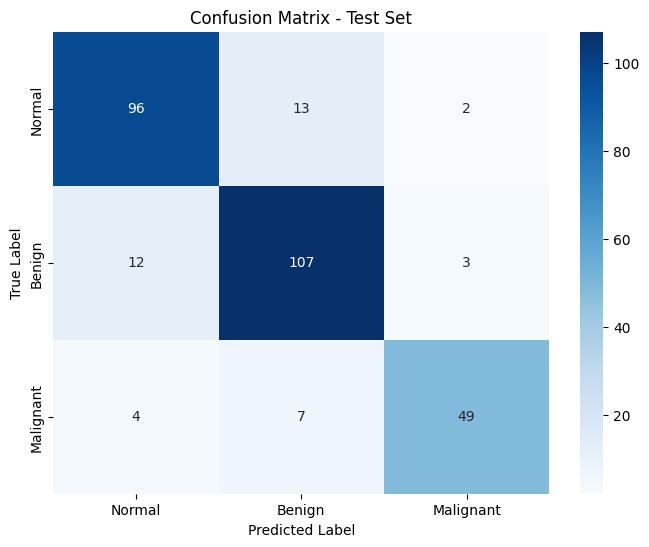


2. Detailed Classification Report:
              precision    recall  f1-score   support

      Normal     0.8571    0.8649    0.8610       111
      Benign     0.8425    0.8770    0.8594       122
   Malignant     0.9074    0.8167    0.8596        60

    accuracy                         0.8601       293
   macro avg     0.8690    0.8529    0.8600       293
weighted avg     0.8613    0.8601    0.8601       293


🔍 DIAGNOSING CRITICAL ERRORS
------------------------------
⚠️ Found 4 cases: True Malignant -> Pred Normal


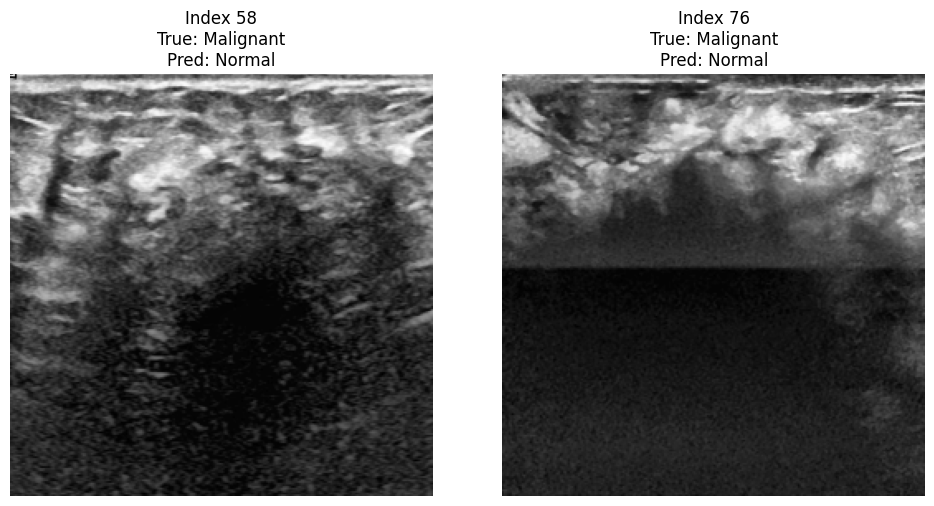

⚠️ Found 2 cases: True Normal -> Pred Malignant


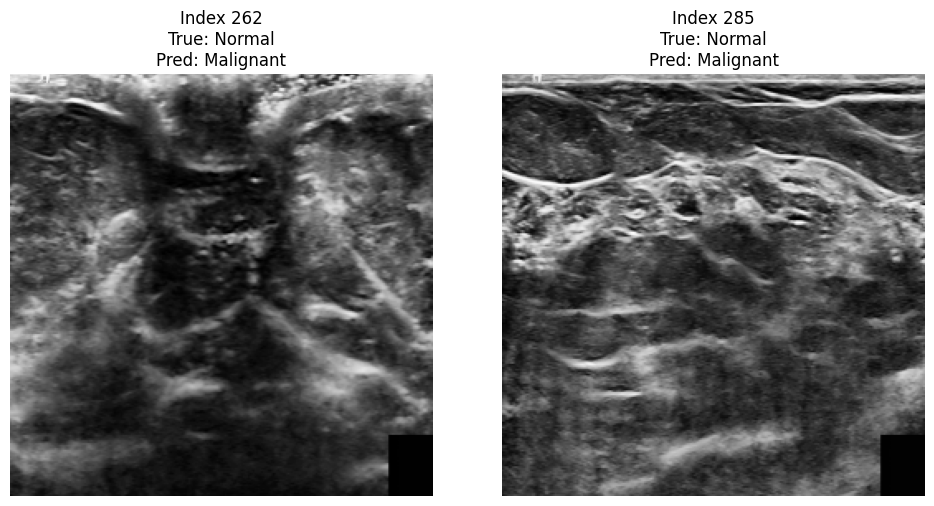

In [ ]:
"""
CELL 2B: STAGE 2 - FULL FINE-TUNING
====================================
Strategy: Unfreeze Encoder. Train everything with LOW Learning Rate.
Goal: Adapt ResNet features to Ultrasound-specific textures.
"""

# 1. LOAD WARMED-UP MODEL
print("🔓 Unfreezing Encoder for Fine-Tuning...")
model.load_state_dict(torch.load('stage1_warmup.pth'))

# 🔓 UNFREEZE EVERYTHING
for param in model.parameters():
    param.requires_grad = True

# 2. CONFIG FOR STAGE 2
# CRITICAL: Use a much LOWER Learning Rate (1e-5 or 5e-5) to avoid destroying pre-trained features
optimizer = torch.optim.Adam(model.parameters(), lr=5e-5, weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)
scaler = GradScaler()

# 3. MAIN TRAINING LOOP
NUM_EPOCHS_FINE = 20
BEST_VAL_LOSS = float('inf')
PATIENCE = 5
epochs_no_improve = 0

print(f"🚀 Starting Fine-Tuning for {NUM_EPOCHS_FINE} Epochs...")

for epoch in range(NUM_EPOCHS_FINE):
    print(f"\nEpoch {epoch+1}/{NUM_EPOCHS_FINE}")

    # Train
    t_loss, t_metrics = train_epoch(model, train_loader, seg_criterion, cls_criterion, optimizer, device, scaler=scaler)

    # Validate
    v_loss, v_metrics = validate_epoch(model, val_loader, seg_criterion, cls_criterion, device)

    scheduler.step(v_loss)

    print(f"Loss: {t_loss:.4f} | Val Loss: {v_loss:.4f} | Val Dice: {v_metrics['mean_dsc']:.4f}")

    if v_loss < BEST_VAL_LOSS:
        BEST_VAL_LOSS = v_loss
        epochs_no_improve = 0
        torch.save({'model_state_dict': model.state_dict(), 'val_metrics': v_metrics}, 'best_model.pth')
        print("✅ Saved Best Model")
    else:
        epochs_no_improve += 1
        if epochs_no_improve >= PATIENCE:
            print("🛑 Early Stopping"); break

In [9]:
"""
CELL 2A: STAGE 1 TRAINING (WARM-UP PHASE)
==========================================
Trains ONLY decoder + classification head with frozen encoder.
Goal: Stabilize randomly initialized weights before end-to-end fine-tuning.

Strategy: Transfer Learning Stage 1
- Freeze: All ResNet-34 encoder layers (preserve ImageNet features)
- Train: Decoder blocks + Classification head only
- Speed: Mixed precision (AMP) + Skip slow NSD metric
- Duration: ~5 epochs, ~2-3 minutes

Prerequisites: Run Cell 1 first to create train_loader, val_loader
"""

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
import numpy as np
import time
from tqdm.auto import tqdm
import cv2

# Prevent OpenCV threading issues
cv2.setNumThreads(0)

print("="*80)
print("CELL 2A: STAGE 1 TRAINING (WARM-UP PHASE)")
print("="*80 + "\n")

# ================================
# ATTENTION GATE
# ================================
class AttentionGate(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super(AttentionGate, self).__init__()
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )
        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        if g1.shape[2:] != x1.shape[2:]:
            g1 = F.interpolate(g1, size=x1.shape[2:], mode='bilinear', align_corners=False)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        return x * psi


# ================================
# DECODER BLOCK
# ================================
class DecoderBlock(nn.Module):
    def __init__(self, in_channels, skip_channels, out_channels, use_attention=True):
        super(DecoderBlock, self).__init__()
        self.upsample = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
        self.use_attention = use_attention
        if use_attention:
            self.attention = AttentionGate(F_g=out_channels, F_l=skip_channels, F_int=out_channels // 2)
        self.conv = nn.Sequential(
            nn.Conv2d(out_channels + skip_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x, skip):
        x = self.upsample(x)
        if self.use_attention:
            skip = self.attention(g=x, x=skip)
        x = torch.cat([x, skip], dim=1)
        return self.conv(x)


# ================================
# MULTI-TASK ATTENTION U-NET
# ================================
class MultiTaskAttentionUNet(nn.Module):
    def __init__(self, num_classes=3, pretrained=True, use_attention=True):
        super(MultiTaskAttentionUNet, self).__init__()

        # Use new PyTorch 2.x weights API
        weights = models.ResNet34_Weights.DEFAULT if pretrained else None
        resnet = models.resnet34(weights=weights)

        # Encoder
        self.encoder1 = nn.Sequential(resnet.conv1, resnet.bn1, resnet.relu)
        self.pool = resnet.maxpool
        self.encoder2 = resnet.layer1
        self.encoder3 = resnet.layer2
        self.encoder4 = resnet.layer3
        self.encoder5 = resnet.layer4

        # Decoder
        self.decoder4 = DecoderBlock(512, 256, 256, use_attention)
        self.decoder3 = DecoderBlock(256, 128, 128, use_attention)
        self.decoder2 = DecoderBlock(128, 64, 64, use_attention)
        self.decoder1 = DecoderBlock(64, 64, 64, use_attention)

        # Segmentation head
        self.seg_head = nn.Conv2d(64, num_classes, kernel_size=1)

        # Classification head
        self.cls_head = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(512, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        # Encoder
        e1 = self.encoder1(x)
        e2 = self.encoder2(self.pool(e1))
        e3 = self.encoder3(e2)
        e4 = self.encoder4(e3)
        e5 = self.encoder5(e4)

        # Decoder
        d4 = self.decoder4(e5, e4)
        d3 = self.decoder3(d4, e3)
        d2 = self.decoder2(d3, e2)
        d1 = self.decoder1(d2, e1)

        # Outputs
        seg_out = F.interpolate(self.seg_head(d1), size=x.shape[2:], mode='bilinear', align_corners=False)
        cls_out = self.cls_head(e5)

        return seg_out, cls_out


# ================================
# FAST METRICS (NO NSD)
# ================================
def compute_fast_metrics(seg_preds, seg_targets, cls_preds, cls_targets):
    """Fast metrics for warm-up phase (skips slow NSD calculation)."""
    metrics = {}

    # Classification metrics
    cls_acc = accuracy_score(cls_targets, cls_preds)
    _, _, cls_f1, _ = precision_recall_fscore_support(
        cls_targets, cls_preds, average='macro', zero_division=0
    )

    metrics['cls_accuracy'] = cls_acc
    metrics['macro_f1'] = cls_f1

    # Dice Score (DSC) only
    dice_scores = []
    for c in range(3):
        pred_mask = (seg_preds == c)
        true_mask = (seg_targets == c)
        intersection = (pred_mask & true_mask).sum()
        total = pred_mask.sum() + true_mask.sum()
        dice = (2.0 * intersection) / total if total > 0 else 1.0
        dice_scores.append(dice)

    metrics['mean_dsc'] = np.mean(dice_scores)

    return metrics


# ================================
# TRAINING FUNCTION (WITH AMP)
# ================================
def train_epoch_amp(model, loader, seg_criterion, cls_criterion, optimizer, scaler, device, alpha=0.5):
    """Train one epoch with mixed precision."""
    model.train()

    total_loss = 0.0
    all_seg_preds = []
    all_seg_targets = []
    all_cls_preds = []
    all_cls_targets = []

    pbar = tqdm(loader, desc='Training', leave=False)
    for images, masks, labels in pbar:
        images = images.to(device)
        masks = masks.to(device).long().squeeze(1)
        labels = labels.to(device)

        optimizer.zero_grad()

        # Mixed precision forward pass
        with torch.amp.autocast(device_type='cuda'):
            seg_logits, cls_logits = model(images)
            seg_loss = seg_criterion(seg_logits, masks)
            cls_loss = cls_criterion(cls_logits, labels)
            loss = alpha * seg_loss + (1 - alpha) * cls_loss

        # Backward with gradient scaling
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        total_loss += loss.item()

        # Store predictions
        seg_preds = torch.argmax(seg_logits, dim=1).cpu().numpy()
        cls_preds = torch.argmax(cls_logits, dim=1).cpu().numpy()

        all_seg_preds.append(seg_preds)
        all_seg_targets.append(masks.cpu().numpy())
        all_cls_preds.append(cls_preds)
        all_cls_targets.append(labels.cpu().numpy())

        pbar.set_postfix({'loss': f'{loss.item():.4f}'})

    # Compute metrics
    all_seg_preds = np.concatenate(all_seg_preds)
    all_seg_targets = np.concatenate(all_seg_targets)
    all_cls_preds = np.concatenate(all_cls_preds)
    all_cls_targets = np.concatenate(all_cls_targets)

    metrics = compute_fast_metrics(all_seg_preds, all_seg_targets, all_cls_preds, all_cls_targets)
    avg_loss = total_loss / len(loader)

    return avg_loss, metrics


# ================================
# VALIDATION FUNCTION (WITH AMP)
# ================================
def validate_epoch_amp(model, loader, seg_criterion, cls_criterion, device, alpha=0.5):
    """Validate one epoch with mixed precision."""
    model.eval()

    total_loss = 0.0
    all_seg_preds = []
    all_seg_targets = []
    all_cls_preds = []
    all_cls_targets = []

    with torch.no_grad():
        pbar = tqdm(loader, desc='Validation', leave=False)
        for images, masks, labels in pbar:
            images = images.to(device)
            masks = masks.to(device).long().squeeze(1)
            labels = labels.to(device)

            with torch.amp.autocast(device_type='cuda'):
                seg_logits, cls_logits = model(images)
                seg_loss = seg_criterion(seg_logits, masks)
                cls_loss = cls_criterion(cls_logits, labels)
                loss = alpha * seg_loss + (1 - alpha) * cls_loss

            total_loss += loss.item()

            seg_preds = torch.argmax(seg_logits, dim=1).cpu().numpy()
            cls_preds = torch.argmax(cls_logits, dim=1).cpu().numpy()

            all_seg_preds.append(seg_preds)
            all_seg_targets.append(masks.cpu().numpy())
            all_cls_preds.append(cls_preds)
            all_cls_targets.append(labels.cpu().numpy())

            pbar.set_postfix({'loss': f'{loss.item():.4f}'})

    all_seg_preds = np.concatenate(all_seg_preds)
    all_seg_targets = np.concatenate(all_seg_targets)
    all_cls_preds = np.concatenate(all_cls_preds)
    all_cls_targets = np.concatenate(all_cls_targets)

    metrics = compute_fast_metrics(all_seg_preds, all_seg_targets, all_cls_preds, all_cls_targets)
    avg_loss = total_loss / len(loader)

    return avg_loss, metrics


# ================================
# MAIN STAGE 1 EXECUTION
# ================================
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"💻 Device: {device}\n")

# Initialize model
print("🔧 Initializing model with pretrained ResNet-34 encoder...")
model = MultiTaskAttentionUNet(num_classes=3, pretrained=True, use_attention=True).to(device)

# ================================
# FREEZE ENCODER (CRITICAL)
# ================================
print("\n🔒 FREEZING ENCODER LAYERS (Stage 1 strategy):")
encoder_modules = [model.encoder1, model.encoder2, model.encoder3, model.encoder4, model.encoder5, model.pool]

for module in encoder_modules:
    for param in module.parameters():
        param.requires_grad = False

# Verify freeze
frozen_params = sum(p.numel() for p in model.parameters() if not p.requires_grad)
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
total_params = sum(p.numel() for p in model.parameters())

print(f"   • Total parameters: {total_params:,}")
print(f"   • Frozen (encoder): {frozen_params:,}")
print(f"   • Trainable (decoder + cls head): {trainable_params:,}")
print(f"   • Training only: {trainable_params/total_params*100:.1f}% of model\n")

# Training setup
seg_criterion = nn.CrossEntropyLoss()
cls_criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-3, weight_decay=1e-5)
scaler = torch.amp.GradScaler('cuda')

NUM_EPOCHS = 10
ALPHA = 0.5
BEST_VAL_LOSS = float('inf')

print("⚙️  Stage 1 Configuration:")
print(f"   • Learning rate: 1e-3 (standard)")
print(f"   • Epochs: {NUM_EPOCHS}")
print(f"   • Loss weighting: α={ALPHA} (seg + cls)")
print(f"   • Mixed precision: Enabled (AMP)")
print(f"   • Metrics: Fast mode (no NSD)")
print(f"   • Estimated time: ~2-3 minutes\n")

print("="*80)
print("STARTING STAGE 1 TRAINING")
print("="*80 + "\n")

start_time = time.time()

for epoch in range(NUM_EPOCHS):
    print(f"{'='*80}")
    print(f"EPOCH {epoch+1}/{NUM_EPOCHS}")
    print(f"{'='*80}")

    # Train
    train_loss, train_metrics = train_epoch_amp(
        model, train_loader, seg_criterion, cls_criterion, optimizer, scaler, device, ALPHA
    )

    # Validate
    val_loss, val_metrics = validate_epoch_amp(
        model, val_loader, seg_criterion, cls_criterion, device, ALPHA
    )

    # Print metrics
    print(f"\n📊 Epoch {epoch+1} Results:")
    print(f"   Loss:      Train={train_loss:.4f}, Val={val_loss:.4f}")
    print(f"   DSC:       Train={train_metrics['mean_dsc']:.4f}, Val={val_metrics['mean_dsc']:.4f}")
    print(f"   Macro F1:  Train={train_metrics['macro_f1']:.4f}, Val={val_metrics['macro_f1']:.4f}")
    print(f"   Cls Acc:   Train={train_metrics['cls_accuracy']:.4f}, Val={val_metrics['cls_accuracy']:.4f}")

    # Save best
    if val_loss < BEST_VAL_LOSS:
        BEST_VAL_LOSS = val_loss
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_loss': val_loss,
            'val_metrics': val_metrics
        }, 'stage1_warmup.pth')
        print(f"   ✅ Best model saved! (Val Loss: {val_loss:.4f})")

    print()

elapsed = time.time() - start_time
print(f"{'='*80}")
print(f"⏱️  Stage 1 completed in {elapsed/60:.1f} minutes")
print(f"{'='*80}\n")

print("✅ STAGE 1 WARM-UP COMPLETE")
print(f"   • Final best val loss: {BEST_VAL_LOSS:.4f}")
print(f"   • Checkpoint saved: stage1_warmup.pth")
print(f"   • Ready for Stage 2 fine-tuning\n")

print("💡 Next: Run Cell 2B for end-to-end fine-tuning")

CELL 2A: STAGE 1 TRAINING (WARM-UP PHASE)

💻 Device: cuda

🔧 Initializing model with pretrained ResNet-34 encoder...

🔒 FREEZING ENCODER LAYERS (Stage 1 strategy):
   • Total parameters: 24,650,002
   • Frozen (encoder): 21,284,672
   • Trainable (decoder + cls head): 3,365,330
   • Training only: 13.7% of model

⚙️  Stage 1 Configuration:
   • Learning rate: 1e-3 (standard)
   • Epochs: 10
   • Loss weighting: α=0.5 (seg + cls)
   • Mixed precision: Enabled (AMP)
   • Metrics: Fast mode (no NSD)
   • Estimated time: ~2-3 minutes

STARTING STAGE 1 TRAINING

EPOCH 1/10


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 1 Results:
   Loss:      Train=0.6543, Val=0.5440
   DSC:       Train=0.4360, Val=0.3520
   Macro F1:  Train=0.4859, Val=0.5877
   Cls Acc:   Train=0.4952, Val=0.6453
   ✅ Best model saved! (Val Loss: 0.5440)

EPOCH 2/10


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 2 Results:
   Loss:      Train=0.5346, Val=0.5373
   DSC:       Train=0.5037, Val=0.4812
   Macro F1:  Train=0.5707, Val=0.6382
   Cls Acc:   Train=0.5799, Val=0.6667
   ✅ Best model saved! (Val Loss: 0.5373)

EPOCH 3/10


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 3 Results:
   Loss:      Train=0.5047, Val=0.4877
   DSC:       Train=0.5137, Val=0.5283
   Macro F1:  Train=0.6160, Val=0.6186
   Cls Acc:   Train=0.6215, Val=0.6667
   ✅ Best model saved! (Val Loss: 0.4877)

EPOCH 4/10


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 4 Results:
   Loss:      Train=0.4774, Val=0.4901
   DSC:       Train=0.5438, Val=0.4851
   Macro F1:  Train=0.6314, Val=0.5379
   Cls Acc:   Train=0.6346, Val=0.6282

EPOCH 5/10


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 5 Results:
   Loss:      Train=0.4681, Val=0.4706
   DSC:       Train=0.6273, Val=0.5481
   Macro F1:  Train=0.6368, Val=0.6118
   Cls Acc:   Train=0.6404, Val=0.6880
   ✅ Best model saved! (Val Loss: 0.4706)

EPOCH 6/10


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 6 Results:
   Loss:      Train=0.4492, Val=0.5103
   DSC:       Train=0.6593, Val=0.5847
   Macro F1:  Train=0.6635, Val=0.6463
   Cls Acc:   Train=0.6675, Val=0.6795

EPOCH 7/10


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 7 Results:
   Loss:      Train=0.4396, Val=0.4671
   DSC:       Train=0.6917, Val=0.6166
   Macro F1:  Train=0.6777, Val=0.6486
   Cls Acc:   Train=0.6825, Val=0.6795
   ✅ Best model saved! (Val Loss: 0.4671)

EPOCH 8/10


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 8 Results:
   Loss:      Train=0.4192, Val=0.4960
   DSC:       Train=0.7077, Val=0.5786
   Macro F1:  Train=0.6911, Val=0.5993
   Cls Acc:   Train=0.6941, Val=0.6154

EPOCH 9/10


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 9 Results:
   Loss:      Train=0.4269, Val=0.4898
   DSC:       Train=0.7404, Val=0.6172
   Macro F1:  Train=0.6748, Val=0.6429
   Cls Acc:   Train=0.6786, Val=0.6667

EPOCH 10/10


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 10 Results:
   Loss:      Train=0.4231, Val=0.7351
   DSC:       Train=0.7422, Val=0.4885
   Macro F1:  Train=0.6663, Val=0.4606
   Cls Acc:   Train=0.6699, Val=0.4530

⏱️  Stage 1 completed in 10.7 minutes

✅ STAGE 1 WARM-UP COMPLETE
   • Final best val loss: 0.4671
   • Checkpoint saved: stage1_warmup.pth
   • Ready for Stage 2 fine-tuning

💡 Next: Run Cell 2B for end-to-end fine-tuning


CELL 2B: STAGE 2 TRAINING (END-TO-END FINE-TUNING)

💻 Device: cuda

📥 Loading Stage 1 warm-up checkpoint...
   ✓ Loaded checkpoint from Stage 1 (Epoch 4)
   ✓ Stage 1 best val loss: 0.4736

🔧 Initializing model...
   ✓ Loaded Stage 1 weights

🔓 UNFREEZING ALL LAYERS (Stage 2 strategy):
   • Total parameters: 24,650,002
   • Trainable: 24,650,002
   • Training: 100% of model (end-to-end)

⚙️  Stage 2 Configuration:
   • Learning rate: 5e-5 (very low for fine-tuning)
   • Max epochs: 40
   • Early stopping patience: 15
   • Stopping Criterion: Composite Score (0.6*DSC + 0.4*F1)
   • Loss weighting: α=0.6 (Combined Loss)
   • Mixed precision: Enabled (AMP)
   • Estimated time: ~15-20 minutes

STARTING STAGE 2 FINE-TUNING

EPOCH 1/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 1 Results:
   Loss:         Train=0.3081, Val=0.2848
   Composite:    SCORE=0.6914 (Max is Best)
   Mean DSC:     Train=0.6442, Val=0.6339
   Macro F1:     Train=0.7674, Val=0.7775
   DSC Benign:   Train=0.4681, Val=0.4954
   DSC Malignant:Train=0.4826, Val=0.4295
   ✅ Best model saved! (Score: 0.6914)

EPOCH 2/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 2 Results:
   Loss:         Train=0.1249, Val=0.3043
   Composite:    SCORE=0.7224 (Max is Best)
   Mean DSC:     Train=0.6681, Val=0.6509
   Macro F1:     Train=0.9551, Val=0.8298
   DSC Benign:   Train=0.5009, Val=0.5270
   DSC Malignant:Train=0.5186, Val=0.4475
   ✅ Best model saved! (Score: 0.7224)

EPOCH 3/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 3 Results:
   Loss:         Train=0.0944, Val=0.3686
   Composite:    SCORE=0.7270 (Max is Best)
   Mean DSC:     Train=0.6873, Val=0.6880
   Macro F1:     Train=0.9698, Val=0.7855
   DSC Benign:   Train=0.5418, Val=0.5795
   DSC Malignant:Train=0.5339, Val=0.5067
   ✅ Best model saved! (Score: 0.7270)

EPOCH 4/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 4 Results:
   Loss:         Train=0.0886, Val=0.4116
   Composite:    SCORE=0.7760 (Max is Best)
   Mean DSC:     Train=0.7081, Val=0.7344
   Macro F1:     Train=0.9770, Val=0.8384
   DSC Benign:   Train=0.5702, Val=0.6745
   DSC Malignant:Train=0.5665, Val=0.5494
   ✅ Best model saved! (Score: 0.7760)

EPOCH 5/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 5 Results:
   Loss:         Train=0.0597, Val=0.3548
   Composite:    SCORE=0.8420 (Max is Best)
   Mean DSC:     Train=0.8528, Val=0.8514
   Macro F1:     Train=0.9824, Val=0.8278
   DSC Benign:   Train=0.7713, Val=0.7546
   DSC Malignant:Train=0.7985, Val=0.8192
   ✅ Best model saved! (Score: 0.8420)

EPOCH 6/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 6 Results:
   Loss:         Train=0.0458, Val=0.3763
   Composite:    SCORE=0.8677 (Max is Best)
   Mean DSC:     Train=0.9102, Val=0.8789
   Macro F1:     Train=0.9900, Val=0.8510
   DSC Benign:   Train=0.8590, Val=0.7986
   DSC Malignant:Train=0.8819, Val=0.8573
   ✅ Best model saved! (Score: 0.8677)

EPOCH 7/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 7 Results:
   Loss:         Train=0.0475, Val=0.3583
   Composite:    SCORE=0.8423 (Max is Best)
   Mean DSC:     Train=0.9247, Val=0.8506
   Macro F1:     Train=0.9860, Val=0.8299
   DSC Benign:   Train=0.8842, Val=0.7611
   DSC Malignant:Train=0.8992, Val=0.8096
   ⏳ No improvement for 1/15 epochs (Best: 0.8677)

EPOCH 8/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 8 Results:
   Loss:         Train=0.0365, Val=0.3111
   Composite:    SCORE=0.8777 (Max is Best)
   Mean DSC:     Train=0.9354, Val=0.8735
   Macro F1:     Train=0.9922, Val=0.8838
   DSC Benign:   Train=0.9088, Val=0.7951
   DSC Malignant:Train=0.9062, Val=0.8432
   ✅ Best model saved! (Score: 0.8777)

EPOCH 9/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 9 Results:
   Loss:         Train=0.0367, Val=0.3456
   Composite:    SCORE=0.8701 (Max is Best)
   Mean DSC:     Train=0.9446, Val=0.8719
   Macro F1:     Train=0.9899, Val=0.8674
   DSC Benign:   Train=0.9207, Val=0.7778
   DSC Malignant:Train=0.9209, Val=0.8553
   ⏳ No improvement for 1/15 epochs (Best: 0.8777)

EPOCH 10/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 10 Results:
   Loss:         Train=0.0352, Val=0.4015
   Composite:    SCORE=0.8607 (Max is Best)
   Mean DSC:     Train=0.9473, Val=0.8688
   Macro F1:     Train=0.9899, Val=0.8485
   DSC Benign:   Train=0.9230, Val=0.8018
   DSC Malignant:Train=0.9263, Val=0.8228
   ⏳ No improvement for 2/15 epochs (Best: 0.8777)

EPOCH 11/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 11 Results:
   Loss:         Train=0.0353, Val=0.3887
   Composite:    SCORE=0.8618 (Max is Best)
   Mean DSC:     Train=0.9536, Val=0.8605
   Macro F1:     Train=0.9888, Val=0.8638
   DSC Benign:   Train=0.9310, Val=0.7838
   DSC Malignant:Train=0.9366, Val=0.8153
   ⏳ No improvement for 3/15 epochs (Best: 0.8777)

EPOCH 12/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 12 Results:
   Loss:         Train=0.0362, Val=0.4017
   Composite:    SCORE=0.8549 (Max is Best)
   Mean DSC:     Train=0.9550, Val=0.8745
   Macro F1:     Train=0.9882, Val=0.8254
   DSC Benign:   Train=0.9315, Val=0.7830
   DSC Malignant:Train=0.9403, Val=0.8588
   ⏳ No improvement for 4/15 epochs (Best: 0.8777)

EPOCH 13/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 13 Results:
   Loss:         Train=0.0285, Val=0.3715
   Composite:    SCORE=0.8763 (Max is Best)
   Mean DSC:     Train=0.9588, Val=0.8877
   Macro F1:     Train=0.9918, Val=0.8591
   DSC Benign:   Train=0.9394, Val=0.8121
   DSC Malignant:Train=0.9437, Val=0.8687
   ⏳ No improvement for 5/15 epochs (Best: 0.8777)

EPOCH 14/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 14 Results:
   Loss:         Train=0.0193, Val=0.3745
   Composite:    SCORE=0.8645 (Max is Best)
   Mean DSC:     Train=0.9659, Val=0.8621
   Macro F1:     Train=0.9986, Val=0.8682
   DSC Benign:   Train=0.9485, Val=0.7749
   DSC Malignant:Train=0.9551, Val=0.8293
   ⏳ No improvement for 6/15 epochs (Best: 0.8777)

EPOCH 15/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 15 Results:
   Loss:         Train=0.0201, Val=0.3835
   Composite:    SCORE=0.8737 (Max is Best)
   Mean DSC:     Train=0.9663, Val=0.8809
   Macro F1:     Train=0.9942, Val=0.8630
   DSC Benign:   Train=0.9462, Val=0.8228
   DSC Malignant:Train=0.9581, Val=0.8372
   ⏳ No improvement for 7/15 epochs (Best: 0.8777)

EPOCH 16/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 16 Results:
   Loss:         Train=0.0246, Val=0.3470
   Composite:    SCORE=0.8796 (Max is Best)
   Mean DSC:     Train=0.9705, Val=0.8858
   Macro F1:     Train=0.9966, Val=0.8703
   DSC Benign:   Train=0.9558, Val=0.8156
   DSC Malignant:Train=0.9610, Val=0.8584
   ✅ Best model saved! (Score: 0.8796)

EPOCH 17/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 17 Results:
   Loss:         Train=0.0148, Val=0.3520
   Composite:    SCORE=0.8820 (Max is Best)
   Mean DSC:     Train=0.9760, Val=0.8888
   Macro F1:     Train=0.9976, Val=0.8717
   DSC Benign:   Train=0.9625, Val=0.8243
   DSC Malignant:Train=0.9700, Val=0.8594
   ✅ Best model saved! (Score: 0.8820)

EPOCH 18/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 18 Results:
   Loss:         Train=0.0132, Val=0.3637
   Composite:    SCORE=0.8845 (Max is Best)
   Mean DSC:     Train=0.9768, Val=0.8891
   Macro F1:     Train=0.9995, Val=0.8776
   DSC Benign:   Train=0.9644, Val=0.8121
   DSC Malignant:Train=0.9704, Val=0.8724
   ✅ Best model saved! (Score: 0.8845)

EPOCH 19/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 19 Results:
   Loss:         Train=0.0195, Val=0.3615
   Composite:    SCORE=0.8870 (Max is Best)
   Mean DSC:     Train=0.9713, Val=0.8917
   Macro F1:     Train=0.9971, Val=0.8799
   DSC Benign:   Train=0.9563, Val=0.8319
   DSC Malignant:Train=0.9622, Val=0.8605
   ✅ Best model saved! (Score: 0.8870)

EPOCH 20/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 20 Results:
   Loss:         Train=0.0260, Val=0.4012
   Composite:    SCORE=0.8874 (Max is Best)
   Mean DSC:     Train=0.9770, Val=0.8971
   Macro F1:     Train=0.9966, Val=0.8729
   DSC Benign:   Train=0.9626, Val=0.8409
   DSC Malignant:Train=0.9726, Val=0.8674
   ✅ Best model saved! (Score: 0.8874)

EPOCH 21/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 21 Results:
   Loss:         Train=0.0112, Val=0.3556
   Composite:    SCORE=0.8946 (Max is Best)
   Mean DSC:     Train=0.9794, Val=0.8920
   Macro F1:     Train=0.9995, Val=0.8985
   DSC Benign:   Train=0.9694, Val=0.8306
   DSC Malignant:Train=0.9728, Val=0.8627
   ✅ Best model saved! (Score: 0.8946)

EPOCH 22/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 22 Results:
   Loss:         Train=0.0207, Val=0.3320
   Composite:    SCORE=0.8748 (Max is Best)
   Mean DSC:     Train=0.9776, Val=0.8819
   Macro F1:     Train=0.9985, Val=0.8640
   DSC Benign:   Train=0.9656, Val=0.8082
   DSC Malignant:Train=0.9713, Val=0.8548
   ⏳ No improvement for 1/15 epochs (Best: 0.8946)

EPOCH 23/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 23 Results:
   Loss:         Train=0.0106, Val=0.3592
   Composite:    SCORE=0.8843 (Max is Best)
   Mean DSC:     Train=0.9789, Val=0.8919
   Macro F1:     Train=0.9995, Val=0.8729
   DSC Benign:   Train=0.9659, Val=0.8365
   DSC Malignant:Train=0.9746, Val=0.8564
   ⏳ No improvement for 2/15 epochs (Best: 0.8946)

EPOCH 24/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 24 Results:
   Loss:         Train=0.0140, Val=0.4151
   Composite:    SCORE=0.8874 (Max is Best)
   Mean DSC:     Train=0.9801, Val=0.8932
   Macro F1:     Train=0.9995, Val=0.8788
   DSC Benign:   Train=0.9703, Val=0.8303
   DSC Malignant:Train=0.9736, Val=0.8663
   ⏳ No improvement for 3/15 epochs (Best: 0.8946)

EPOCH 25/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 25 Results:
   Loss:         Train=0.0211, Val=0.4455
   Composite:    SCORE=0.8746 (Max is Best)
   Mean DSC:     Train=0.9791, Val=0.8875
   Macro F1:     Train=0.9961, Val=0.8553
   DSC Benign:   Train=0.9673, Val=0.8333
   DSC Malignant:Train=0.9737, Val=0.8456
   ⏳ No improvement for 4/15 epochs (Best: 0.8946)

EPOCH 26/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 26 Results:
   Loss:         Train=0.0118, Val=0.3506
   Composite:    SCORE=0.8829 (Max is Best)
   Mean DSC:     Train=0.9766, Val=0.8864
   Macro F1:     Train=0.9985, Val=0.8776
   DSC Benign:   Train=0.9655, Val=0.8226
   DSC Malignant:Train=0.9682, Val=0.8534
   ⏳ No improvement for 5/15 epochs (Best: 0.8946)

EPOCH 27/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 27 Results:
   Loss:         Train=0.0112, Val=0.3245
   Composite:    SCORE=0.8873 (Max is Best)
   Mean DSC:     Train=0.9805, Val=0.8850
   Macro F1:     Train=0.9971, Val=0.8909
   DSC Benign:   Train=0.9701, Val=0.8270
   DSC Malignant:Train=0.9749, Val=0.8448
   ⏳ No improvement for 6/15 epochs (Best: 0.8946)

EPOCH 28/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 28 Results:
   Loss:         Train=0.0107, Val=0.3514
   Composite:    SCORE=0.8831 (Max is Best)
   Mean DSC:     Train=0.9805, Val=0.8853
   Macro F1:     Train=0.9981, Val=0.8798
   DSC Benign:   Train=0.9703, Val=0.8247
   DSC Malignant:Train=0.9746, Val=0.8480
   ⏳ No improvement for 7/15 epochs (Best: 0.8946)

EPOCH 29/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 29 Results:
   Loss:         Train=0.0089, Val=0.3575
   Composite:    SCORE=0.8842 (Max is Best)
   Mean DSC:     Train=0.9838, Val=0.8928
   Macro F1:     Train=0.9995, Val=0.8713
   DSC Benign:   Train=0.9745, Val=0.8435
   DSC Malignant:Train=0.9801, Val=0.8515
   ⏳ No improvement for 8/15 epochs (Best: 0.8946)

EPOCH 30/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 30 Results:
   Loss:         Train=0.0101, Val=0.3555
   Composite:    SCORE=0.8800 (Max is Best)
   Mean DSC:     Train=0.9796, Val=0.8869
   Macro F1:     Train=0.9965, Val=0.8697
   DSC Benign:   Train=0.9702, Val=0.8315
   DSC Malignant:Train=0.9717, Val=0.8457
   ⏳ No improvement for 9/15 epochs (Best: 0.8946)

EPOCH 31/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 31 Results:
   Loss:         Train=0.0102, Val=0.3454
   Composite:    SCORE=0.8846 (Max is Best)
   Mean DSC:     Train=0.9844, Val=0.8877
   Macro F1:     Train=0.9990, Val=0.8800
   DSC Benign:   Train=0.9748, Val=0.8212
   DSC Malignant:Train=0.9814, Val=0.8588
   ⏳ No improvement for 10/15 epochs (Best: 0.8946)

EPOCH 32/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 32 Results:
   Loss:         Train=0.0110, Val=0.3807
   Composite:    SCORE=0.8810 (Max is Best)
   Mean DSC:     Train=0.9839, Val=0.8887
   Macro F1:     Train=0.9976, Val=0.8695
   DSC Benign:   Train=0.9745, Val=0.8170
   DSC Malignant:Train=0.9803, Val=0.8659
   ⏳ No improvement for 11/15 epochs (Best: 0.8946)

EPOCH 33/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 33 Results:
   Loss:         Train=0.0198, Val=0.3722
   Composite:    SCORE=0.9001 (Max is Best)
   Mean DSC:     Train=0.9852, Val=0.8974
   Macro F1:     Train=0.9976, Val=0.9040
   DSC Benign:   Train=0.9764, Val=0.8321
   DSC Malignant:Train=0.9822, Val=0.8772
   ✅ Best model saved! (Score: 0.9001)

EPOCH 34/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 34 Results:
   Loss:         Train=0.0086, Val=0.3728
   Composite:    SCORE=0.8818 (Max is Best)
   Mean DSC:     Train=0.9852, Val=0.8866
   Macro F1:     Train=0.9985, Val=0.8745
   DSC Benign:   Train=0.9763, Val=0.8269
   DSC Malignant:Train=0.9820, Val=0.8496
   ⏳ No improvement for 1/15 epochs (Best: 0.9001)

EPOCH 35/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 35 Results:
   Loss:         Train=0.0112, Val=0.3758
   Composite:    SCORE=0.8791 (Max is Best)
   Mean DSC:     Train=0.9832, Val=0.8882
   Macro F1:     Train=0.9967, Val=0.8655
   DSC Benign:   Train=0.9742, Val=0.8320
   DSC Malignant:Train=0.9784, Val=0.8494
   ⏳ No improvement for 2/15 epochs (Best: 0.9001)

EPOCH 36/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 36 Results:
   Loss:         Train=0.0087, Val=0.3569
   Composite:    SCORE=0.8962 (Max is Best)
   Mean DSC:     Train=0.9850, Val=0.8923
   Macro F1:     Train=0.9980, Val=0.9020
   DSC Benign:   Train=0.9769, Val=0.8378
   DSC Malignant:Train=0.9810, Val=0.8558
   ⏳ No improvement for 3/15 epochs (Best: 0.9001)

EPOCH 37/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 37 Results:
   Loss:         Train=0.0086, Val=0.3337
   Composite:    SCORE=0.8948 (Max is Best)
   Mean DSC:     Train=0.9839, Val=0.8880
   Macro F1:     Train=0.9980, Val=0.9050
   DSC Benign:   Train=0.9742, Val=0.8164
   DSC Malignant:Train=0.9805, Val=0.8646
   ⏳ No improvement for 4/15 epochs (Best: 0.9001)

EPOCH 38/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 38 Results:
   Loss:         Train=0.0093, Val=0.3741
   Composite:    SCORE=0.8847 (Max is Best)
   Mean DSC:     Train=0.9853, Val=0.8872
   Macro F1:     Train=0.9990, Val=0.8809
   DSC Benign:   Train=0.9760, Val=0.8266
   DSC Malignant:Train=0.9826, Val=0.8521
   ⏳ No improvement for 5/15 epochs (Best: 0.9001)

EPOCH 39/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 39 Results:
   Loss:         Train=0.0245, Val=0.3586
   Composite:    SCORE=0.8922 (Max is Best)
   Mean DSC:     Train=0.9849, Val=0.8896
   Macro F1:     Train=0.9990, Val=0.8961
   DSC Benign:   Train=0.9763, Val=0.8128
   DSC Malignant:Train=0.9811, Val=0.8731
   ⏳ No improvement for 6/15 epochs (Best: 0.9001)

EPOCH 40/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 40 Results:
   Loss:         Train=0.0072, Val=0.3455
   Composite:    SCORE=0.8995 (Max is Best)
   Mean DSC:     Train=0.9857, Val=0.8927
   Macro F1:     Train=0.9990, Val=0.9096
   DSC Benign:   Train=0.9776, Val=0.8189
   DSC Malignant:Train=0.9820, Val=0.8761
   ⏳ No improvement for 7/15 epochs (Best: 0.9001)

⏱️  Stage 2 completed in 41.2 minutes

📈 Generating training curves...


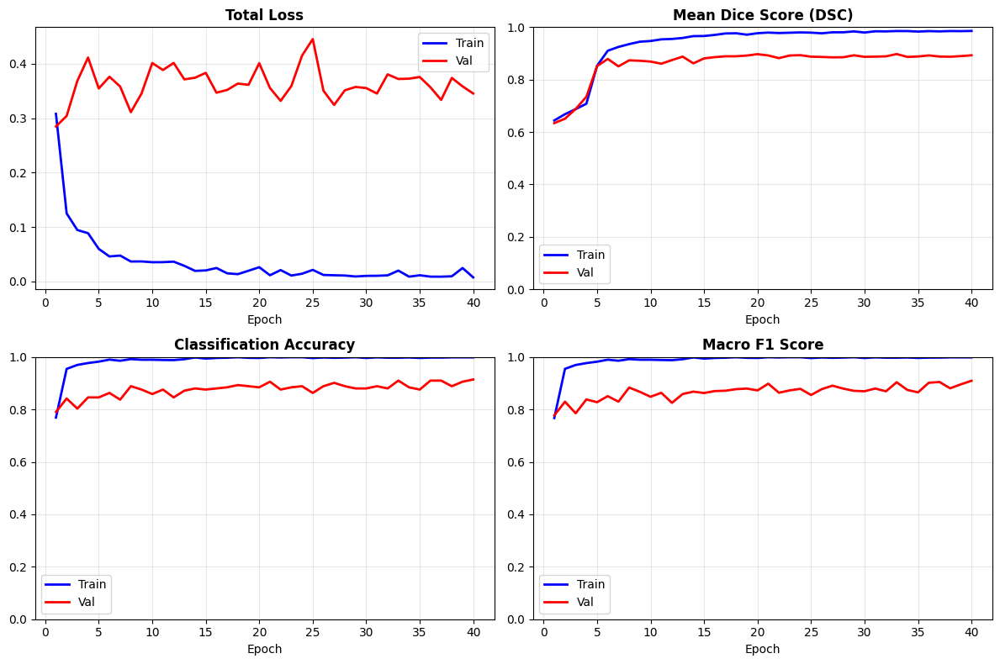


✅ STAGE 2 FINE-TUNING COMPLETE
   • Final Best Score: 0.9001
   • Checkpoint saved: best_model.pth
   • Model ready for testing

💡 Next: Run Cell 3 for comprehensive test set evaluation


In [3]:
"""
CELL 2B: STAGE 2 TRAINING (END-TO-END FINE-TUNING)
===================================================
Trains the ENTIRE model with unfrozen encoder for ultrasound adaptation.

Strategy: Transfer Learning Stage 2
- Unfreeze: All layers (End-to-End)
- Learning Rate: 5e-5 (Low LR to preserve pretrained features)
- Loss Weighting: 0.6 Seg + 0.4 Cls (Combined Loss)
- STOPPING CRITERIA: Composite Score (0.6*DSC + 0.4*F1) -> Maximizes BOTH tasks.

Prerequisites:
- Run Cell 1 (DataLoaders)
- Run Cell 2A (Stage 1 Warm-up)
"""

import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from tqdm.auto import tqdm

print("="*80)
print("CELL 2B: STAGE 2 TRAINING (END-TO-END FINE-TUNING)")
print("="*80 + "\n")

# ================================
# METRICS WITH DSC & NSD
# ================================
def compute_dice_coefficient(pred_mask, true_mask, num_classes=3):
    """Compute Dice Similarity Coefficient per class."""
    dice_scores = []

    for cls in range(num_classes):
        pred_cls = (pred_mask == cls).astype(np.float32)
        true_cls = (true_mask == cls).astype(np.float32)

        intersection = (pred_cls * true_cls).sum()
        denominator = pred_cls.sum() + true_cls.sum()

        if denominator == 0:
            dice = 1.0 if intersection == 0 else 0.0
        else:
            dice = (2.0 * intersection) / denominator

        dice_scores.append(dice)

    return dice_scores


def compute_full_metrics(seg_preds, seg_targets, cls_preds, cls_targets):
    """Compute comprehensive metrics including DSC."""
    metrics = {}

    # Classification
    cls_acc = accuracy_score(cls_targets, cls_preds)
    _, _, cls_f1, _ = precision_recall_fscore_support(
        cls_targets, cls_preds, average='macro', zero_division=0
    )

    metrics['cls_accuracy'] = cls_acc
    metrics['macro_f1'] = cls_f1

    # Dice Score
    all_dice = []
    for pred, target in zip(seg_preds, seg_targets):
        dice_scores = compute_dice_coefficient(pred, target)
        all_dice.append(dice_scores)

    all_dice = np.array(all_dice)
    metrics['mean_dsc'] = np.mean(all_dice)
    metrics['dsc_background'] = np.mean(all_dice[:, 0])
    metrics['dsc_benign'] = np.mean(all_dice[:, 1])
    metrics['dsc_malignant'] = np.mean(all_dice[:, 2])

    return metrics


# ================================
# TRAINING WITH AMP
# ================================
def train_epoch_stage2(model, loader, seg_criterion, cls_criterion, optimizer, scaler, device, alpha=0.6):
    """Train one epoch with combined loss."""
    model.train()

    total_loss = 0.0
    all_seg_preds = []
    all_seg_targets = []
    all_cls_preds = []
    all_cls_targets = []

    pbar = tqdm(loader, desc='Training', leave=False)
    for images, masks, labels in pbar:
        images = images.to(device)
        masks = masks.to(device).long().squeeze(1)
        labels = labels.to(device)

        optimizer.zero_grad()

        with torch.amp.autocast(device_type='cuda'):
            seg_logits, cls_logits = model(images)
            seg_loss = seg_criterion(seg_logits, masks)
            cls_loss = cls_criterion(cls_logits, labels)
            # Combined Loss used for Backprop
            loss = alpha * seg_loss + (1 - alpha) * cls_loss

        scaler.scale(loss).backward()

        # Gradient clipping for stability
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        scaler.step(optimizer)
        scaler.update()

        total_loss += loss.item()

        seg_preds = torch.argmax(seg_logits, dim=1).cpu().numpy()
        cls_preds = torch.argmax(cls_logits, dim=1).cpu().numpy()

        all_seg_preds.append(seg_preds)
        all_seg_targets.append(masks.cpu().numpy())
        all_cls_preds.append(cls_preds)
        all_cls_targets.append(labels.cpu().numpy())

        pbar.set_postfix({'loss': f'{loss.item():.4f}'})

    all_seg_preds = np.concatenate(all_seg_preds)
    all_seg_targets = np.concatenate(all_seg_targets)
    all_cls_preds = np.concatenate(all_cls_preds)
    all_cls_targets = np.concatenate(all_cls_targets)

    metrics = compute_full_metrics(all_seg_preds, all_seg_targets, all_cls_preds, all_cls_targets)
    avg_loss = total_loss / len(loader)

    return avg_loss, metrics


def validate_epoch_stage2(model, loader, seg_criterion, cls_criterion, device, alpha=0.6):
    """Validate one epoch."""
    model.eval()

    total_loss = 0.0
    all_seg_preds = []
    all_seg_targets = []
    all_cls_preds = []
    all_cls_targets = []

    with torch.no_grad():
        pbar = tqdm(loader, desc='Validation', leave=False)
        for images, masks, labels in pbar:
            images = images.to(device)
            masks = masks.to(device).long().squeeze(1)
            labels = labels.to(device)

            with torch.amp.autocast(device_type='cuda'):
                seg_logits, cls_logits = model(images)
                seg_loss = seg_criterion(seg_logits, masks)
                cls_loss = cls_criterion(cls_logits, labels)
                loss = alpha * seg_loss + (1 - alpha) * cls_loss

            total_loss += loss.item()

            seg_preds = torch.argmax(seg_logits, dim=1).cpu().numpy()
            cls_preds = torch.argmax(cls_logits, dim=1).cpu().numpy()

            all_seg_preds.append(seg_preds)
            all_seg_targets.append(masks.cpu().numpy())
            all_cls_preds.append(cls_preds)
            all_cls_targets.append(labels.cpu().numpy())

            pbar.set_postfix({'loss': f'{loss.item():.4f}'})

    all_seg_preds = np.concatenate(all_seg_preds)
    all_seg_targets = np.concatenate(all_seg_targets)
    all_cls_preds = np.concatenate(all_cls_preds)
    all_cls_targets = np.concatenate(all_cls_targets)

    metrics = compute_full_metrics(all_seg_preds, all_seg_targets, all_cls_preds, all_cls_targets)
    avg_loss = total_loss / len(loader)

    return avg_loss, metrics


# ================================
# VISUALIZATION
# ================================
def plot_training_curves(history):
    """Plot training curves."""
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))

    epochs = range(1, len(history['train_loss']) + 1)

    # Loss
    axes[0, 0].plot(epochs, history['train_loss'], 'b-', label='Train', linewidth=2)
    axes[0, 0].plot(epochs, history['val_loss'], 'r-', label='Val', linewidth=2)
    axes[0, 0].set_title('Total Loss', fontweight='bold')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)

    # DSC
    axes[0, 1].plot(epochs, history['train_dsc'], 'b-', label='Train', linewidth=2)
    axes[0, 1].plot(epochs, history['val_dsc'], 'r-', label='Val', linewidth=2)
    axes[0, 1].set_title('Mean Dice Score (DSC)', fontweight='bold')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylim([0, 1])
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)

    # Classification Accuracy
    axes[1, 0].plot(epochs, history['train_acc'], 'b-', label='Train', linewidth=2)
    axes[1, 0].plot(epochs, history['val_acc'], 'r-', label='Val', linewidth=2)
    axes[1, 0].set_title('Classification Accuracy', fontweight='bold')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylim([0, 1])
    axes[1, 0].legend()
    axes[1, 0].grid(True, alpha=0.3)

    # Macro F1
    axes[1, 1].plot(epochs, history['train_f1'], 'b-', label='Train', linewidth=2)
    axes[1, 1].plot(epochs, history['val_f1'], 'r-', label='Val', linewidth=2)
    axes[1, 1].set_title('Macro F1 Score', fontweight='bold')
    axes[1, 1].set_xlabel('Epoch')
    axes[1, 1].set_ylim([0, 1])
    axes[1, 1].legend()
    axes[1, 1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()


# ================================
# MAIN STAGE 2 EXECUTION
# ================================
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"💻 Device: {device}\n")

# Load Stage 1 checkpoint
print("📥 Loading Stage 1 warm-up checkpoint...")
try:
    checkpoint = torch.load('stage1_warmup.pth', map_location=device, weights_only=False)
    print(f"   ✓ Loaded checkpoint from Stage 1 (Epoch {checkpoint['epoch']+1})")
    print(f"   ✓ Stage 1 best val loss: {checkpoint['val_loss']:.4f}\n")
except FileNotFoundError:
    print("   ❌ Error: stage1_warmup.pth not found!")
    print("   Please run Cell 2A (Stage 1) first.\n")
    raise

# Initialize model
print("🔧 Initializing model...")
model = MultiTaskAttentionUNet(num_classes=3, pretrained=True, use_attention=True).to(device)
model.load_state_dict(checkpoint['model_state_dict'])
print("   ✓ Loaded Stage 1 weights\n")

# ================================
# UNFREEZE ALL LAYERS (CRITICAL)
# ================================
print("🔓 UNFREEZING ALL LAYERS (Stage 2 strategy):")
for param in model.parameters():
    param.requires_grad = True

trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
total_params = sum(p.numel() for p in model.parameters())

print(f"   • Total parameters: {total_params:,}")
print(f"   • Trainable: {trainable_params:,}")
print(f"   • Training: 100% of model (end-to-end)\n")

# Training setup
seg_criterion = nn.CrossEntropyLoss()
cls_criterion = nn.CrossEntropyLoss()

# Very low learning rate for fine-tuning
optimizer = torch.optim.Adam(model.parameters(), lr=5e-5, weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='max', factor=0.5, patience=5) # Mode='max' because we want to MAXIMIZE score
scaler = torch.amp.GradScaler('cuda')

NUM_EPOCHS = 40
ALPHA = 0.6  # Weighting for Composite Score
BEST_SCORE = 0.0 # <--- Initializing Score
PATIENCE = 15
epochs_no_improve = 0

# History tracking
history = {
    'train_loss': [], 'val_loss': [],
    'train_dsc': [], 'val_dsc': [],
    'train_acc': [], 'val_acc': [],
    'train_f1': [], 'val_f1': []
}

print("⚙️  Stage 2 Configuration:")
print(f"   • Learning rate: 5e-5 (very low for fine-tuning)")
print(f"   • Max epochs: {NUM_EPOCHS}")
print(f"   • Early stopping patience: {PATIENCE}")
print(f"   • Stopping Criterion: Composite Score (0.6*DSC + 0.4*F1)")
print(f"   • Loss weighting: α={ALPHA} (Combined Loss)")
print(f"   • Mixed precision: Enabled (AMP)")
print(f"   • Estimated time: ~15-20 minutes\n")

print("="*80)
print("STARTING STAGE 2 FINE-TUNING")
print("="*80 + "\n")

start_time = time.time()

for epoch in range(NUM_EPOCHS):
    print(f"{'='*80}")
    print(f"EPOCH {epoch+1}/{NUM_EPOCHS}")
    print(f"{'='*80}")

    # Train
    train_loss, train_metrics = train_epoch_stage2(
        model, train_loader, seg_criterion, cls_criterion, optimizer, scaler, device, ALPHA
    )

    # Validate
    val_loss, val_metrics = validate_epoch_stage2(
        model, val_loader, seg_criterion, cls_criterion, device, ALPHA
    )

    # =========================================================
    # CALCULATE COMPOSITE SCORE (Segmentation + Diagnosis)
    # =========================================================
    current_score = (ALPHA * val_metrics['mean_dsc']) + ((1 - ALPHA) * val_metrics['macro_f1'])

    # Scheduler step (adjust LR based on Composite Score)
    scheduler.step(current_score)

    # Save history
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    history['train_dsc'].append(train_metrics['mean_dsc'])
    history['val_dsc'].append(val_metrics['mean_dsc'])
    history['train_acc'].append(train_metrics['cls_accuracy'])
    history['val_acc'].append(val_metrics['cls_accuracy'])
    history['train_f1'].append(train_metrics['macro_f1'])
    history['val_f1'].append(val_metrics['macro_f1'])

    # Print metrics
    print(f"\n📊 Epoch {epoch+1} Results:")
    print(f"   Loss:         Train={train_loss:.4f}, Val={val_loss:.4f}")
    print(f"   Composite:    SCORE={current_score:.4f} (Max is Best)")
    print(f"   Mean DSC:     Train={train_metrics['mean_dsc']:.4f}, Val={val_metrics['mean_dsc']:.4f}")
    print(f"   Macro F1:     Train={train_metrics['macro_f1']:.4f}, Val={val_metrics['macro_f1']:.4f}")
    print(f"   DSC Benign:   Train={train_metrics['dsc_benign']:.4f}, Val={val_metrics['dsc_benign']:.4f}")
    print(f"   DSC Malignant:Train={train_metrics['dsc_malignant']:.4f}, Val={val_metrics['dsc_malignant']:.4f}")

    # =========================================================
    # SAVE MODEL IF COMPOSITE SCORE IMPROVES
    # =========================================================
    if current_score > BEST_SCORE:
        BEST_SCORE = current_score
        epochs_no_improve = 0
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_loss': val_loss,
            'val_metrics': val_metrics,
            'train_metrics': train_metrics,
            'best_score': BEST_SCORE
        }, 'best_model.pth')
        print(f"   ✅ Best model saved! (Score: {BEST_SCORE:.4f})")
    else:
        epochs_no_improve += 1
        print(f"   ⏳ No improvement for {epochs_no_improve}/{PATIENCE} epochs (Best: {BEST_SCORE:.4f})")

    # Early stopping
    if epochs_no_improve >= PATIENCE:
        print(f"\n⚠️  Early stopping triggered after {epoch+1} epochs")
        break

    print()

elapsed = time.time() - start_time
print(f"{'='*80}")
print(f"⏱️  Stage 2 completed in {elapsed/60:.1f} minutes")
print(f"{'='*80}\n")

# Plot training curves
print("📈 Generating training curves...")
plot_training_curves(history)

print("\n✅ STAGE 2 FINE-TUNING COMPLETE")
print(f"   • Final Best Score: {BEST_SCORE:.4f}")
print(f"   • Checkpoint saved: best_model.pth")
print(f"   • Model ready for testing\n")

print("💡 Next: Run Cell 3 for comprehensive test set evaluation")

CELL 3: COMPREHENSIVE TEST SET EVALUATION

📋 Configuration:
   • Test samples: 293
   • Batch size: 16

💻 Device: cuda

📥 Loading best model...
   ✓ Model loaded successfully

STARTING TEST SET EVALUATION

🔬 Running inference on test set...


Testing:   0%|          | 0/19 [00:00<?, ?it/s]


📊 Computing comprehensive metrics...
   Computing DSC and NSD for each sample...


  0%|          | 0/293 [00:00<?, ?it/s]


✓ Evaluation completed in 12.42 seconds


                   COMPREHENSIVE TEST SET EVALUATION RESULTS                    

🎯 TRACK 1: SEGMENTATION METRICS
--------------------------------------------------------------------------------
Metric                                   Score          
--------------------------------------------------------------------------------
Mean Dice Score (DSC) - PRIMARY          0.8952
  • Background DSC                            0.9856
  • Benign DSC                                0.8284
  • Malignant DSC                             0.8715

Mean Normalized Surface Dice (NSD)       0.6135
  • Background NSD                            0.2862
  • Benign NSD                                0.7496
  • Malignant NSD                             0.8045

⚡ Inference Speed                        0.0038 sec/image

🏥 TRACK 2: DIAGNOSIS CLASSIFICATION METRICS
--------------------------------------------------------------------------------
Metric                  

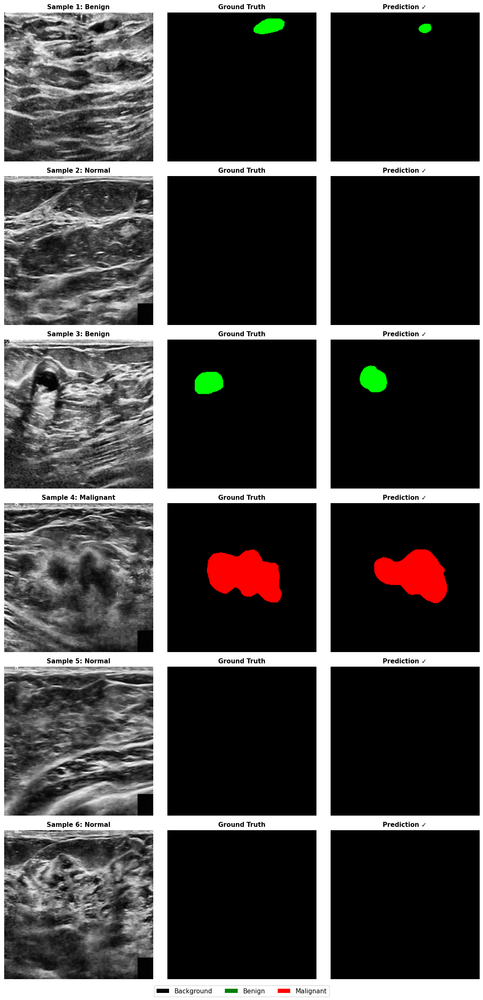


📊 2. Confusion Matrix...


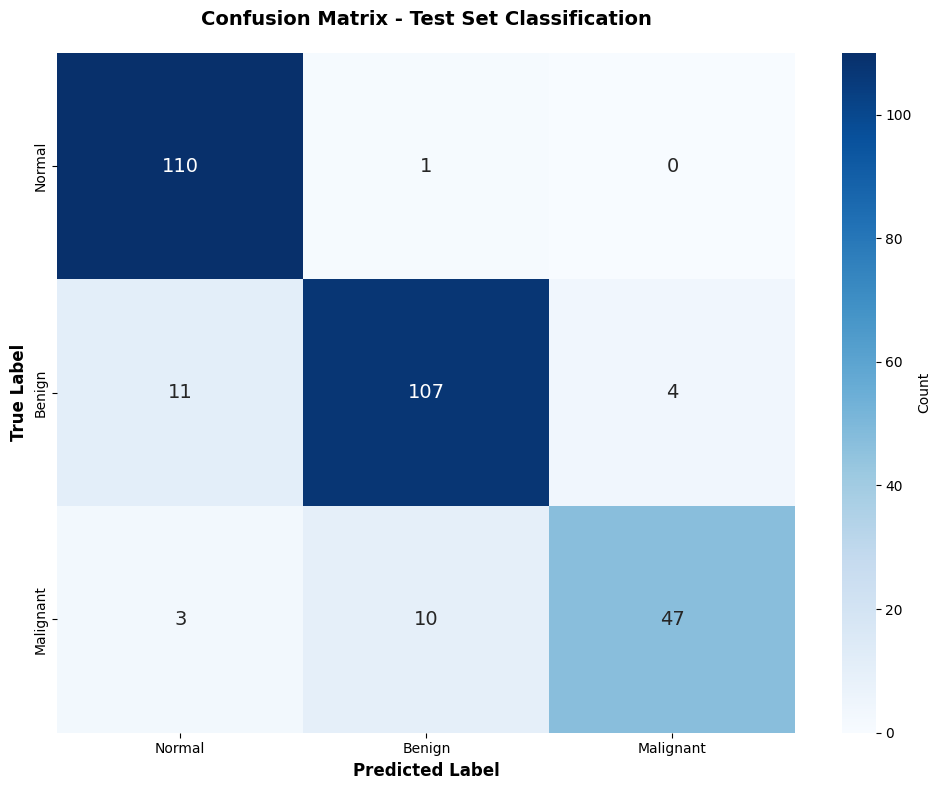


💾 Saving results...
   ✓ Metrics saved: test_metrics.csv
   ✓ Predictions saved: test_predictions.npz

✅ TEST SET EVALUATION COMPLETE

🎯 Final Results:
   • Mean DSC:        0.8952
   • Mean NSD:        0.6135
   • Macro F1:        0.8916
   • Accuracy:        0.9010


In [4]:
"""
CELL 3: COMPREHENSIVE TEST SET EVALUATION
==========================================
Evaluates best_model.pth on held-out test set with medical imaging metrics.

Metrics:
- Track 1: Mean DSC (Dice), Mean NSD (Normalized Surface Dice)
- Track 2: Macro F1, Classification Accuracy
- Error Analysis: Critical misclassifications (Malignant → Normal)

Prerequisites:
- Run Cell 1 to create test_loader
- Run Cell 2B to generate best_model.pth
"""

import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import time
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (accuracy_score, precision_recall_fscore_support,
                             confusion_matrix, classification_report)
from scipy.ndimage import distance_transform_edt
import cv2
import pandas as pd

# Prevent OpenCV threading issues
cv2.setNumThreads(0)

print("="*80)
print("CELL 3: COMPREHENSIVE TEST SET EVALUATION")
print("="*80 + "\n")

# ================================
# METRIC FUNCTIONS
# ================================
def compute_dice_coefficient(pred_mask, true_mask, num_classes=3):
    """Compute Dice Similarity Coefficient per class."""
    dice_scores = []

    for cls in range(num_classes):
        pred_cls = (pred_mask == cls).astype(np.float32)
        true_cls = (true_mask == cls).astype(np.float32)

        intersection = (pred_cls * true_cls).sum()
        denominator = pred_cls.sum() + true_cls.sum()

        if denominator == 0:
            dice = 1.0 if intersection == 0 else 0.0
        else:
            dice = (2.0 * intersection) / denominator

        dice_scores.append(dice)

    return {
        'dsc_background': dice_scores[0],
        'dsc_benign': dice_scores[1],
        'dsc_malignant': dice_scores[2],
        'mean_dsc': np.mean(dice_scores)
    }


def compute_normalized_surface_dice(pred_mask, true_mask, num_classes=3, tolerance=2.0):
    """
    Compute Normalized Surface Dice (NSD) - measures boundary accuracy.

    This is a critical metric for medical imaging as it evaluates how well
    the predicted boundaries match the ground truth boundaries.
    """
    nsd_scores = []

    for cls in range(num_classes):
        pred_cls = (pred_mask == cls).astype(np.uint8)
        true_cls = (true_mask == cls).astype(np.uint8)

        # Handle edge cases
        if pred_cls.sum() == 0 and true_cls.sum() == 0:
            nsd_scores.append(1.0)
            continue

        if pred_cls.sum() == 0 or true_cls.sum() == 0:
            nsd_scores.append(0.0)
            continue

        # Compute borders
        pred_border = pred_cls - cv2.erode(pred_cls, np.ones((3, 3), np.uint8))
        true_border = true_cls - cv2.erode(true_cls, np.ones((3, 3), np.uint8))

        # Distance transforms
        dt_pred = distance_transform_edt(~pred_border.astype(bool))
        dt_true = distance_transform_edt(~true_border.astype(bool))

        # Surface points
        pred_surface = np.stack(np.where(pred_border > 0), axis=1)
        true_surface = np.stack(np.where(true_border > 0), axis=1)

        if len(pred_surface) == 0 or len(true_surface) == 0:
            nsd_scores.append(0.0)
            continue

        # NSD computation
        pred_to_true = dt_true[pred_surface[:, 0], pred_surface[:, 1]]
        true_to_pred = dt_pred[true_surface[:, 0], true_surface[:, 1]]

        pred_overlap = (pred_to_true <= tolerance).sum()
        true_overlap = (true_to_pred <= tolerance).sum()

        nsd = (pred_overlap + true_overlap) / (len(pred_surface) + len(true_surface))
        nsd_scores.append(nsd)

    return {
        'nsd_background': nsd_scores[0],
        'nsd_benign': nsd_scores[1],
        'nsd_malignant': nsd_scores[2],
        'mean_nsd': np.mean(nsd_scores)
    }


def compute_comprehensive_metrics(seg_preds, seg_targets, cls_preds, cls_targets):
    """Compute all medical imaging metrics."""
    metrics = {}

    # Classification metrics
    cls_acc = accuracy_score(cls_targets, cls_preds)
    cls_prec, cls_rec, cls_f1, _ = precision_recall_fscore_support(
        cls_targets, cls_preds, average='macro', zero_division=0
    )

    # Per-class metrics
    cls_prec_per, cls_rec_per, cls_f1_per, _ = precision_recall_fscore_support(
        cls_targets, cls_preds, average=None, zero_division=0, labels=[0, 1, 2]
    )

    metrics['cls_accuracy'] = cls_acc
    metrics['cls_precision'] = cls_prec
    metrics['cls_recall'] = cls_rec
    metrics['macro_f1'] = cls_f1
    metrics['cls_f1_normal'] = cls_f1_per[0]
    metrics['cls_f1_benign'] = cls_f1_per[1]
    metrics['cls_f1_malignant'] = cls_f1_per[2]

    # Segmentation metrics (DSC, NSD)
    all_dsc = []
    all_nsd = []

    print("   Computing DSC and NSD for each sample...")
    for pred, target in tqdm(zip(seg_preds, seg_targets), total=len(seg_preds), leave=False):
        dsc_result = compute_dice_coefficient(pred, target)
        all_dsc.append(dsc_result)

        nsd_result = compute_normalized_surface_dice(pred, target)
        all_nsd.append(nsd_result)

    # Average across samples
    metrics['mean_dsc'] = np.mean([d['mean_dsc'] for d in all_dsc])
    metrics['dsc_background'] = np.mean([d['dsc_background'] for d in all_dsc])
    metrics['dsc_benign'] = np.mean([d['dsc_benign'] for d in all_dsc])
    metrics['dsc_malignant'] = np.mean([d['dsc_malignant'] for d in all_dsc])

    metrics['mean_nsd'] = np.mean([n['mean_nsd'] for n in all_nsd])
    metrics['nsd_background'] = np.mean([n['nsd_background'] for n in all_nsd])
    metrics['nsd_benign'] = np.mean([n['nsd_benign'] for n in all_nsd])
    metrics['nsd_malignant'] = np.mean([n['nsd_malignant'] for n in all_nsd])

    return metrics


# ================================
# TEST EVALUATION
# ================================
def evaluate_test_set(model, test_loader, device):
    """Comprehensive test set evaluation."""
    model.eval()

    all_seg_preds = []
    all_seg_targets = []
    all_cls_preds = []
    all_cls_targets = []
    all_images = []
    all_filenames = []

    inference_times = []

    print("🔬 Running inference on test set...")

    with torch.no_grad():
        pbar = tqdm(test_loader, desc='Testing')
        for batch_idx, (images, masks, labels) in enumerate(pbar):
            images = images.to(device)
            masks = masks.to(device).long().squeeze(1)
            labels = labels.to(device)

            # Track inference time
            if torch.cuda.is_available():
                torch.cuda.synchronize()
            start_time = time.time()

            # Forward pass
            with torch.amp.autocast(device_type='cuda'):
                seg_logits, cls_logits = model(images)

            if torch.cuda.is_available():
                torch.cuda.synchronize()
            batch_time = time.time() - start_time
            inference_times.append(batch_time / images.size(0))

            # Predictions
            seg_preds = torch.argmax(seg_logits, dim=1).cpu().numpy()
            cls_preds = torch.argmax(cls_logits, dim=1).cpu().numpy()

            all_seg_preds.append(seg_preds)
            all_seg_targets.append(masks.cpu().numpy())
            all_cls_preds.append(cls_preds)
            all_cls_targets.append(labels.cpu().numpy())
            all_images.append(images.cpu())

            # Store batch indices for filename mapping
            batch_start = batch_idx * test_loader.batch_size
            batch_end = batch_start + images.size(0)
            all_filenames.extend(range(batch_start, batch_end))

    # Concatenate
    all_seg_preds = np.concatenate(all_seg_preds)
    all_seg_targets = np.concatenate(all_seg_targets)
    all_cls_preds = np.concatenate(all_cls_preds)
    all_cls_targets = np.concatenate(all_cls_targets)
    all_images = torch.cat(all_images, dim=0)

    # Compute metrics
    print("\n📊 Computing comprehensive metrics...")
    metrics = compute_comprehensive_metrics(
        all_seg_preds, all_seg_targets, all_cls_preds, all_cls_targets
    )

    # Inference speed
    metrics['inference_speed'] = np.mean(inference_times)
    metrics['inference_speed_std'] = np.std(inference_times)

    # Store predictions
    predictions = {
        'images': all_images,
        'seg_preds': all_seg_preds,
        'seg_targets': all_seg_targets,
        'cls_preds': all_cls_preds,
        'cls_targets': all_cls_targets,
        'filenames': all_filenames
    }

    return metrics, predictions


# ================================
# ERROR ANALYSIS
# ================================
def analyze_critical_errors(predictions, test_dataset):
    """
    Analyze critical misclassifications.

    Focus: Malignant cases misclassified as Normal (highest risk)
    """
    print("\n" + "="*80)
    print("CRITICAL ERROR ANALYSIS")
    print("="*80 + "\n")

    cls_preds = predictions['cls_preds']
    cls_targets = predictions['cls_targets']
    filenames_idx = predictions['filenames']

    # Class mapping
    class_names = {0: 'Normal', 1: 'Benign', 2: 'Malignant'}

    # Find all errors
    errors = cls_preds != cls_targets
    error_indices = np.where(errors)[0]

    print(f"📋 Total misclassifications: {len(error_indices)} / {len(cls_targets)} "
          f"({len(error_indices)/len(cls_targets)*100:.1f}%)\n")

    if len(error_indices) == 0:
        print("✅ Perfect classification! No errors found.")
        return

    # Analyze by type
    error_types = {}
    for idx in error_indices:
        true_class = class_names[cls_targets[idx]]
        pred_class = class_names[cls_preds[idx]]
        error_type = f"{true_class} → {pred_class}"

        if error_type not in error_types:
            error_types[error_type] = []

        error_types[error_type].append(idx)

    # Print error breakdown
    print("🔍 Error Breakdown by Type:")
    print("-" * 80)
    for error_type, indices in sorted(error_types.items()):
        print(f"   {error_type}: {len(indices)} cases")

    # Critical errors: Malignant misclassified as Normal
    critical_errors = error_types.get('Malignant → Normal', [])

    if len(critical_errors) > 0:
        print(f"\n⚠️  CRITICAL ERRORS: Malignant → Normal ({len(critical_errors)} cases)")
        print("-" * 80)
        print("These are high-risk false negatives that could delay treatment.\n")

        print(f"{'Index':<8} {'Filename':<40} {'True':<12} {'Predicted':<12}")
        print("-" * 80)

        for idx in critical_errors[:10]:  # Show first 10
            # Get filename from metadata
            try:
                file_idx = filenames_idx[idx]
                img_path = test_dataset.metadata.loc[file_idx, 'image_path']
                filename = img_path.split('/')[-1]
            except:
                filename = f"sample_{idx}"

            print(f"{idx:<8} {filename:<40} {'Malignant':<12} {'Normal':<12}")

        if len(critical_errors) > 10:
            print(f"... and {len(critical_errors) - 10} more")
    else:
        print(f"\n✅ No critical errors: No malignant cases misclassified as normal")

    # Other concerning errors: Malignant → Benign
    concerning_errors = error_types.get('Malignant → Benign', [])

    if len(concerning_errors) > 0:
        print(f"\n⚠️  Concerning Errors: Malignant → Benign ({len(concerning_errors)} cases)")
        print("These underestimate cancer severity.\n")

    print("\n" + "="*80)


# ================================
# VISUALIZATION
# ================================
def plot_predictions_with_errors(images, masks_true, masks_pred, cls_true, cls_pred, num_samples=6):
    """Visualize predictions with classification results."""
    num_samples = min(num_samples, len(images))
    fig, axes = plt.subplots(num_samples, 3, figsize=(12, 4 * num_samples))

    if num_samples == 1:
        axes = axes.reshape(1, -1)

    class_colors = {0: [0, 0, 0], 1: [0, 255, 0], 2: [255, 0, 0]}
    class_names = {0: 'Normal', 1: 'Benign', 2: 'Malignant'}

    for i in range(num_samples):
        # Input
        img = images[i].numpy()
        if img.shape[0] == 3:
            img = np.transpose(img, (1, 2, 0))
        else:
            img = img[0]

        is_correct = cls_true[i] == cls_pred[i]
        border_color = 'green' if is_correct else 'red'

        axes[i, 0].imshow(img, cmap='gray' if len(img.shape) == 2 else None)
        axes[i, 0].set_title(f'Sample {i+1}: {class_names[cls_true[i]]}',
                            fontsize=11, fontweight='bold')
        axes[i, 0].axis('off')
        for spine in axes[i, 0].spines.values():
            spine.set_edgecolor(border_color)
            spine.set_linewidth(3)

        # Ground Truth
        mask_true_colored = np.zeros((*masks_true[i].shape, 3), dtype=np.uint8)
        for cls, color in class_colors.items():
            mask_true_colored[masks_true[i] == cls] = color

        axes[i, 1].imshow(mask_true_colored)
        axes[i, 1].set_title('Ground Truth', fontsize=11, fontweight='bold')
        axes[i, 1].axis('off')

        # Prediction
        mask_pred_colored = np.zeros((*masks_pred[i].shape, 3), dtype=np.uint8)
        for cls, color in class_colors.items():
            mask_pred_colored[masks_pred[i] == cls] = color

        axes[i, 2].imshow(mask_pred_colored)
        status = '✓' if is_correct else f'✗ → {class_names[cls_pred[i]]}'
        axes[i, 2].set_title(f'Prediction {status}', fontsize=11, fontweight='bold')
        axes[i, 2].axis('off')

    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='black', label='Background'),
        Patch(facecolor='green', label='Benign'),
        Patch(facecolor='red', label='Malignant')
    ]
    fig.legend(handles=legend_elements, loc='lower center', ncol=3, fontsize=11)

    plt.tight_layout()
    plt.subplots_adjust(bottom=0.02)
    plt.show()


def plot_confusion_matrix(y_true, y_pred, classes):
    """Plot confusion matrix."""
    cm = confusion_matrix(y_true, y_pred)

    fig, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=classes, yticklabels=classes,
                cbar_kws={'label': 'Count'}, ax=ax, annot_kws={'size': 14})

    ax.set_title('Confusion Matrix - Test Set Classification',
                 fontsize=14, fontweight='bold', pad=20)
    ax.set_ylabel('True Label', fontsize=12, fontweight='bold')
    ax.set_xlabel('Predicted Label', fontsize=12, fontweight='bold')

    plt.tight_layout()
    plt.show()


def print_detailed_metrics(metrics):
    """Print comprehensive metrics."""
    print("\n" + "="*80)
    print("COMPREHENSIVE TEST SET EVALUATION RESULTS".center(80))
    print("="*80)

    # Track 1: Segmentation
    print("\n🎯 TRACK 1: SEGMENTATION METRICS")
    print("-" * 80)
    print(f"{'Metric':<40} {'Score':<15}")
    print("-" * 80)

    print(f"{'Mean Dice Score (DSC) - PRIMARY':<40} {metrics['mean_dsc']:.4f}")
    print(f"  • Background DSC{'':<27} {metrics['dsc_background']:.4f}")
    print(f"  • Benign DSC{'':<31} {metrics['dsc_benign']:.4f}")
    print(f"  • Malignant DSC{'':<28} {metrics['dsc_malignant']:.4f}")

    print(f"\n{'Mean Normalized Surface Dice (NSD)':<40} {metrics['mean_nsd']:.4f}")
    print(f"  • Background NSD{'':<27} {metrics['nsd_background']:.4f}")
    print(f"  • Benign NSD{'':<31} {metrics['nsd_benign']:.4f}")
    print(f"  • Malignant NSD{'':<28} {metrics['nsd_malignant']:.4f}")

    print(f"\n{'⚡ Inference Speed':<40} {metrics['inference_speed']:.4f} sec/image")

    # Track 2: Classification
    print("\n🏥 TRACK 2: DIAGNOSIS CLASSIFICATION METRICS")
    print("-" * 80)
    print(f"{'Metric':<40} {'Score':<15}")
    print("-" * 80)

    print(f"{'Macro F1 Score - PRIMARY':<40} {metrics['macro_f1']:.4f}")
    print(f"{'Overall Accuracy':<40} {metrics['cls_accuracy']:.4f}")
    print(f"{'Precision (Macro)':<40} {metrics['cls_precision']:.4f}")
    print(f"{'Recall (Macro)':<40} {metrics['cls_recall']:.4f}")

    print(f"\n{'Per-Class F1 Scores:':<40}")
    print(f"  • Normal{'':<33} {metrics['cls_f1_normal']:.4f}")
    print(f"  • Benign{'':<33} {metrics['cls_f1_benign']:.4f}")
    print(f"  • Malignant{'':<30} {metrics['cls_f1_malignant']:.4f}")

    print("\n" + "="*80)

    # Summary
    print("\n┌" + "─"*78 + "┐")
    print("│" + " SUMMARY - CHALLENGE METRICS ".center(78) + "│")
    print("├" + "─"*78 + "┤")
    print(f"│  Track 1 - Mean DSC:          {metrics['mean_dsc']:.4f}" + " "*37 + "│")
    print(f"│  Track 1 - Mean NSD:          {metrics['mean_nsd']:.4f}" + " "*37 + "│")
    print(f"│  Track 2 - Macro F1:          {metrics['macro_f1']:.4f}" + " "*37 + "│")
    print(f"│  Inference Speed:             {metrics['inference_speed']:.4f} sec/image" + " "*27 + "│")
    print("└" + "─"*78 + "┘\n")


# ================================
# MAIN EXECUTION
# ================================
print("📋 Configuration:")
print(f"   • Test samples: {len(test_loader.dataset)}")
print(f"   • Batch size: {test_loader.batch_size}\n")

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"💻 Device: {device}\n")

# Load model
print("📥 Loading best model...")
try:
    checkpoint = torch.load('best_model.pth', map_location=device, weights_only=False)

    model = MultiTaskAttentionUNet(num_classes=3, pretrained=False, use_attention=True).to(device)

    if 'model_state_dict' in checkpoint:
        model.load_state_dict(checkpoint['model_state_dict'])
    else:
        model.load_state_dict(checkpoint)

    print("   ✓ Model loaded successfully\n")
except FileNotFoundError:
    print("   ❌ Error: best_model.pth not found!")
    raise

# Evaluate
print("="*80)
print("STARTING TEST SET EVALUATION")
print("="*80 + "\n")

start_time = time.time()
test_metrics, predictions = evaluate_test_set(model, test_loader, device)
eval_time = time.time() - start_time

print(f"\n✓ Evaluation completed in {eval_time:.2f} seconds\n")

# Print metrics
print_detailed_metrics(test_metrics)

# Classification report
print("\n📋 DETAILED CLASSIFICATION REPORT")
print("="*80)
classes = ['Normal', 'Benign', 'Malignant']
report = classification_report(predictions['cls_targets'], predictions['cls_preds'],
                               target_names=classes, digits=4)
print(report)
print("="*80)

# Error analysis
analyze_critical_errors(predictions, test_dataset)

# Visualizations
print("\n" + "="*80)
print("GENERATING VISUALIZATIONS")
print("="*80 + "\n")

# Sample predictions
print("🎨 1. Sample Predictions...")
sample_indices = np.random.choice(len(predictions['images']), size=min(6, len(predictions['images'])), replace=False)
plot_predictions_with_errors(
    predictions['images'][sample_indices],
    predictions['seg_targets'][sample_indices],
    predictions['seg_preds'][sample_indices],
    predictions['cls_targets'][sample_indices],
    predictions['cls_preds'][sample_indices],
    num_samples=6
)

# Confusion matrix
print("\n📊 2. Confusion Matrix...")
plot_confusion_matrix(predictions['cls_targets'], predictions['cls_preds'], classes)

# Save results
print("\n💾 Saving results...")
metrics_df = pd.DataFrame([test_metrics])
metrics_df.to_csv('test_metrics.csv', index=False)
print("   ✓ Metrics saved: test_metrics.csv")

np.savez('test_predictions.npz',
         seg_preds=predictions['seg_preds'],
         seg_targets=predictions['seg_targets'],
         cls_preds=predictions['cls_preds'],
         cls_targets=predictions['cls_targets'])
print("   ✓ Predictions saved: test_predictions.npz")

print("\n" + "="*80)
print("✅ TEST SET EVALUATION COMPLETE")
print("="*80)
print(f"\n🎯 Final Results:")
print(f"   • Mean DSC:        {test_metrics['mean_dsc']:.4f}")
print(f"   • Mean NSD:        {test_metrics['mean_nsd']:.4f}")
print(f"   • Macro F1:        {test_metrics['macro_f1']:.4f}")
print(f"   • Accuracy:        {test_metrics['cls_accuracy']:.4f}")
print("="*80)

#Exp2


CELL 2B: STAGE 2 TRAINING (END-TO-END FINE-TUNING)

💻 Device: cuda

📥 Loading Stage 1 warm-up checkpoint...
   ✓ Loaded checkpoint from Stage 1 (Epoch 7)
   ✓ Stage 1 best val loss: 0.4671

🔧 Initializing model...
   ✓ Loaded Stage 1 weights

🔓 UNFREEZING ALL LAYERS (Stage 2 strategy):
   • Total parameters: 24,650,002
   • Trainable: 24,650,002
   • Training: 100% of model (end-to-end)

⚖️  Applying Weighted Loss (Penalty for missing Malignant cases)...
   ✓ Class weights set to [1.0, 1.0, 3.0]
⚙️  Stage 2 Configuration:
   • Learning rate: 5e-5 (very low for fine-tuning)
   • Max epochs: 40
   • Early stopping patience: 15
   • Stopping Criterion: Composite Score (0.6*DSC + 0.4*F1)
   • Loss weighting: α=0.6 (Combined Loss)
   • Mixed precision: Enabled (AMP)
   • Estimated time: ~15-20 minutes

STARTING STAGE 2 FINE-TUNING

EPOCH 1/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 1 Results:
   Loss:         Train=0.3279, Val=0.3147
   Composite:    SCORE=0.7893 (Max is Best)
   Mean DSC:     Train=0.7824, Val=0.7886
   Macro F1:     Train=0.7393, Val=0.7904
   DSC Benign:   Train=0.6911, Val=0.7102
   DSC Malignant:Train=0.6740, Val=0.6777
   ✅ Best model saved! (Score: 0.7893)

EPOCH 2/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 2 Results:
   Loss:         Train=0.1421, Val=0.3801
   Composite:    SCORE=0.8309 (Max is Best)
   Mean DSC:     Train=0.8558, Val=0.8420
   Macro F1:     Train=0.9277, Val=0.8142
   DSC Benign:   Train=0.8002, Val=0.7562
   DSC Malignant:Train=0.7827, Val=0.7912
   ✅ Best model saved! (Score: 0.8309)

EPOCH 3/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 3 Results:
   Loss:         Train=0.1009, Val=0.4232
   Composite:    SCORE=0.8344 (Max is Best)
   Mean DSC:     Train=0.8968, Val=0.8381
   Macro F1:     Train=0.9636, Val=0.8288
   DSC Benign:   Train=0.8502, Val=0.7422
   DSC Malignant:Train=0.8535, Val=0.7946
   ✅ Best model saved! (Score: 0.8344)

EPOCH 4/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 4 Results:
   Loss:         Train=0.0671, Val=0.3655
   Composite:    SCORE=0.8358 (Max is Best)
   Mean DSC:     Train=0.9129, Val=0.8345
   Macro F1:     Train=0.9816, Val=0.8378
   DSC Benign:   Train=0.8802, Val=0.7807
   DSC Malignant:Train=0.8710, Val=0.7450
   ✅ Best model saved! (Score: 0.8358)

EPOCH 5/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 5 Results:
   Loss:         Train=0.0593, Val=0.4050
   Composite:    SCORE=0.8345 (Max is Best)
   Mean DSC:     Train=0.9226, Val=0.8395
   Macro F1:     Train=0.9848, Val=0.8271
   DSC Benign:   Train=0.8890, Val=0.7882
   DSC Malignant:Train=0.8899, Val=0.7527
   ⏳ No improvement for 1/15 epochs (Best: 0.8358)

EPOCH 6/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 6 Results:
   Loss:         Train=0.0510, Val=0.4195
   Composite:    SCORE=0.8551 (Max is Best)
   Mean DSC:     Train=0.9354, Val=0.8633
   Macro F1:     Train=0.9827, Val=0.8428
   DSC Benign:   Train=0.9036, Val=0.7937
   DSC Malignant:Train=0.9123, Val=0.8155
   ✅ Best model saved! (Score: 0.8551)

EPOCH 7/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 7 Results:
   Loss:         Train=0.0498, Val=0.4051
   Composite:    SCORE=0.8428 (Max is Best)
   Mean DSC:     Train=0.9340, Val=0.8508
   Macro F1:     Train=0.9865, Val=0.8307
   DSC Benign:   Train=0.9019, Val=0.7968
   DSC Malignant:Train=0.9094, Val=0.7755
   ⏳ No improvement for 1/15 epochs (Best: 0.8551)

EPOCH 8/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 8 Results:
   Loss:         Train=0.0451, Val=0.3871
   Composite:    SCORE=0.8536 (Max is Best)
   Mean DSC:     Train=0.9393, Val=0.8547
   Macro F1:     Train=0.9908, Val=0.8520
   DSC Benign:   Train=0.9134, Val=0.7983
   DSC Malignant:Train=0.9133, Val=0.7848
   ⏳ No improvement for 2/15 epochs (Best: 0.8551)

EPOCH 9/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 9 Results:
   Loss:         Train=0.0340, Val=0.5490
   Composite:    SCORE=0.8699 (Max is Best)
   Mean DSC:     Train=0.9522, Val=0.8756
   Macro F1:     Train=0.9937, Val=0.8612
   DSC Benign:   Train=0.9298, Val=0.7832
   DSC Malignant:Train=0.9342, Val=0.8617
   ✅ Best model saved! (Score: 0.8699)

EPOCH 10/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 10 Results:
   Loss:         Train=0.0619, Val=0.4614
   Composite:    SCORE=0.8687 (Max is Best)
   Mean DSC:     Train=0.9565, Val=0.8770
   Macro F1:     Train=0.9920, Val=0.8562
   DSC Benign:   Train=0.9308, Val=0.8044
   DSC Malignant:Train=0.9457, Val=0.8457
   ⏳ No improvement for 1/15 epochs (Best: 0.8699)

EPOCH 11/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 11 Results:
   Loss:         Train=0.0284, Val=0.4625
   Composite:    SCORE=0.8586 (Max is Best)
   Mean DSC:     Train=0.9546, Val=0.8536
   Macro F1:     Train=0.9931, Val=0.8662
   DSC Benign:   Train=0.9325, Val=0.7690
   DSC Malignant:Train=0.9384, Val=0.8104
   ⏳ No improvement for 2/15 epochs (Best: 0.8699)

EPOCH 12/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 12 Results:
   Loss:         Train=0.0341, Val=0.6189
   Composite:    SCORE=0.8639 (Max is Best)
   Mean DSC:     Train=0.9617, Val=0.8709
   Macro F1:     Train=0.9908, Val=0.8534
   DSC Benign:   Train=0.9424, Val=0.7833
   DSC Malignant:Train=0.9492, Val=0.8483
   ⏳ No improvement for 3/15 epochs (Best: 0.8699)

EPOCH 13/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 13 Results:
   Loss:         Train=0.0242, Val=0.5424
   Composite:    SCORE=0.8711 (Max is Best)
   Mean DSC:     Train=0.9614, Val=0.8766
   Macro F1:     Train=0.9942, Val=0.8628
   DSC Benign:   Train=0.9416, Val=0.7961
   DSC Malignant:Train=0.9487, Val=0.8526
   ✅ Best model saved! (Score: 0.8711)

EPOCH 14/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 14 Results:
   Loss:         Train=0.0370, Val=0.5108
   Composite:    SCORE=0.8529 (Max is Best)
   Mean DSC:     Train=0.9629, Val=0.8660
   Macro F1:     Train=0.9947, Val=0.8332
   DSC Benign:   Train=0.9464, Val=0.8026
   DSC Malignant:Train=0.9484, Val=0.8150
   ⏳ No improvement for 1/15 epochs (Best: 0.8711)

EPOCH 15/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 15 Results:
   Loss:         Train=0.0309, Val=0.4483
   Composite:    SCORE=0.8657 (Max is Best)
   Mean DSC:     Train=0.9649, Val=0.8726
   Macro F1:     Train=0.9942, Val=0.8553
   DSC Benign:   Train=0.9485, Val=0.8035
   DSC Malignant:Train=0.9520, Val=0.8322
   ⏳ No improvement for 2/15 epochs (Best: 0.8711)

EPOCH 16/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 16 Results:
   Loss:         Train=0.0234, Val=0.5932
   Composite:    SCORE=0.8570 (Max is Best)
   Mean DSC:     Train=0.9656, Val=0.8621
   Macro F1:     Train=0.9943, Val=0.8494
   DSC Benign:   Train=0.9499, Val=0.7584
   DSC Malignant:Train=0.9526, Val=0.8461
   ⏳ No improvement for 3/15 epochs (Best: 0.8711)

EPOCH 17/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 17 Results:
   Loss:         Train=0.0295, Val=0.5645
   Composite:    SCORE=0.8647 (Max is Best)
   Mean DSC:     Train=0.9666, Val=0.8723
   Macro F1:     Train=0.9878, Val=0.8534
   DSC Benign:   Train=0.9495, Val=0.7848
   DSC Malignant:Train=0.9560, Val=0.8505
   ⏳ No improvement for 4/15 epochs (Best: 0.8711)

EPOCH 18/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 18 Results:
   Loss:         Train=0.0256, Val=0.4677
   Composite:    SCORE=0.8753 (Max is Best)
   Mean DSC:     Train=0.9665, Val=0.8788
   Macro F1:     Train=0.9903, Val=0.8700
   DSC Benign:   Train=0.9502, Val=0.7936
   DSC Malignant:Train=0.9545, Val=0.8610
   ✅ Best model saved! (Score: 0.8753)

EPOCH 19/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 19 Results:
   Loss:         Train=0.0361, Val=0.5312
   Composite:    SCORE=0.8734 (Max is Best)
   Mean DSC:     Train=0.9716, Val=0.8842
   Macro F1:     Train=0.9939, Val=0.8572
   DSC Benign:   Train=0.9546, Val=0.8166
   DSC Malignant:Train=0.9653, Val=0.8531
   ⏳ No improvement for 1/15 epochs (Best: 0.8753)

EPOCH 20/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 20 Results:
   Loss:         Train=0.0219, Val=0.6137
   Composite:    SCORE=0.8680 (Max is Best)
   Mean DSC:     Train=0.9674, Val=0.8764
   Macro F1:     Train=0.9946, Val=0.8556
   DSC Benign:   Train=0.9515, Val=0.8024
   DSC Malignant:Train=0.9561, Val=0.8445
   ⏳ No improvement for 2/15 epochs (Best: 0.8753)

EPOCH 21/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 21 Results:
   Loss:         Train=0.0481, Val=0.6153
   Composite:    SCORE=0.8715 (Max is Best)
   Mean DSC:     Train=0.9738, Val=0.8809
   Macro F1:     Train=0.9906, Val=0.8573
   DSC Benign:   Train=0.9587, Val=0.8153
   DSC Malignant:Train=0.9676, Val=0.8457
   ⏳ No improvement for 3/15 epochs (Best: 0.8753)

EPOCH 22/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 22 Results:
   Loss:         Train=0.0243, Val=0.4439
   Composite:    SCORE=0.8434 (Max is Best)
   Mean DSC:     Train=0.9725, Val=0.8579
   Macro F1:     Train=0.9951, Val=0.8216
   DSC Benign:   Train=0.9583, Val=0.7966
   DSC Malignant:Train=0.9640, Val=0.7942
   ⏳ No improvement for 4/15 epochs (Best: 0.8753)

EPOCH 23/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 23 Results:
   Loss:         Train=0.0304, Val=0.5398
   Composite:    SCORE=0.8663 (Max is Best)
   Mean DSC:     Train=0.9724, Val=0.8749
   Macro F1:     Train=0.9948, Val=0.8535
   DSC Benign:   Train=0.9616, Val=0.7944
   DSC Malignant:Train=0.9601, Val=0.8479
   ⏳ No improvement for 5/15 epochs (Best: 0.8753)

EPOCH 24/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 24 Results:
   Loss:         Train=0.0181, Val=0.5464
   Composite:    SCORE=0.8570 (Max is Best)
   Mean DSC:     Train=0.9762, Val=0.8711
   Macro F1:     Train=0.9967, Val=0.8359
   DSC Benign:   Train=0.9610, Val=0.7981
   DSC Malignant:Train=0.9721, Val=0.8333
   ⏳ No improvement for 6/15 epochs (Best: 0.8753)

EPOCH 25/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 25 Results:
   Loss:         Train=0.0576, Val=0.5864
   Composite:    SCORE=0.8764 (Max is Best)
   Mean DSC:     Train=0.9777, Val=0.8882
   Macro F1:     Train=0.9922, Val=0.8587
   DSC Benign:   Train=0.9668, Val=0.8152
   DSC Malignant:Train=0.9704, Val=0.8669
   ✅ Best model saved! (Score: 0.8764)

EPOCH 26/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 26 Results:
   Loss:         Train=0.0116, Val=0.4829
   Composite:    SCORE=0.8679 (Max is Best)
   Mean DSC:     Train=0.9816, Val=0.8776
   Macro F1:     Train=0.9990, Val=0.8532
   DSC Benign:   Train=0.9715, Val=0.8156
   DSC Malignant:Train=0.9770, Val=0.8342
   ⏳ No improvement for 1/15 epochs (Best: 0.8764)

EPOCH 27/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 27 Results:
   Loss:         Train=0.0309, Val=0.4815
   Composite:    SCORE=0.8635 (Max is Best)
   Mean DSC:     Train=0.9817, Val=0.8724
   Macro F1:     Train=0.9980, Val=0.8501
   DSC Benign:   Train=0.9712, Val=0.7975
   DSC Malignant:Train=0.9775, Val=0.8367
   ⏳ No improvement for 2/15 epochs (Best: 0.8764)

EPOCH 28/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 28 Results:
   Loss:         Train=0.0182, Val=0.5778
   Composite:    SCORE=0.8587 (Max is Best)
   Mean DSC:     Train=0.9815, Val=0.8782
   Macro F1:     Train=0.9980, Val=0.8295
   DSC Benign:   Train=0.9726, Val=0.8071
   DSC Malignant:Train=0.9754, Val=0.8446
   ⏳ No improvement for 3/15 epochs (Best: 0.8764)

EPOCH 29/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 29 Results:
   Loss:         Train=0.0160, Val=0.5355
   Composite:    SCORE=0.8771 (Max is Best)
   Mean DSC:     Train=0.9810, Val=0.8830
   Macro F1:     Train=0.9972, Val=0.8682
   DSC Benign:   Train=0.9716, Val=0.8148
   DSC Malignant:Train=0.9748, Val=0.8516
   ✅ Best model saved! (Score: 0.8771)

EPOCH 30/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 30 Results:
   Loss:         Train=0.0132, Val=0.5117
   Composite:    SCORE=0.8702 (Max is Best)
   Mean DSC:     Train=0.9835, Val=0.8789
   Macro F1:     Train=0.9972, Val=0.8570
   DSC Benign:   Train=0.9741, Val=0.8139
   DSC Malignant:Train=0.9795, Val=0.8400
   ⏳ No improvement for 1/15 epochs (Best: 0.8771)

EPOCH 31/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 31 Results:
   Loss:         Train=0.0189, Val=0.5538
   Composite:    SCORE=0.8717 (Max is Best)
   Mean DSC:     Train=0.9831, Val=0.8833
   Macro F1:     Train=0.9986, Val=0.8543
   DSC Benign:   Train=0.9742, Val=0.8148
   DSC Malignant:Train=0.9782, Val=0.8522
   ⏳ No improvement for 2/15 epochs (Best: 0.8771)

EPOCH 32/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 32 Results:
   Loss:         Train=0.0094, Val=0.5169
   Composite:    SCORE=0.8706 (Max is Best)
   Mean DSC:     Train=0.9845, Val=0.8787
   Macro F1:     Train=0.9995, Val=0.8586
   DSC Benign:   Train=0.9761, Val=0.8007
   DSC Malignant:Train=0.9805, Val=0.8524
   ⏳ No improvement for 3/15 epochs (Best: 0.8771)

EPOCH 33/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 33 Results:
   Loss:         Train=0.0093, Val=0.5321
   Composite:    SCORE=0.8761 (Max is Best)
   Mean DSC:     Train=0.9848, Val=0.8863
   Macro F1:     Train=0.9995, Val=0.8607
   DSC Benign:   Train=0.9757, Val=0.8112
   DSC Malignant:Train=0.9816, Val=0.8648
   ⏳ No improvement for 4/15 epochs (Best: 0.8771)

EPOCH 34/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 34 Results:
   Loss:         Train=0.0165, Val=0.6379
   Composite:    SCORE=0.8713 (Max is Best)
   Mean DSC:     Train=0.9850, Val=0.8894
   Macro F1:     Train=0.9985, Val=0.8442
   DSC Benign:   Train=0.9761, Val=0.8154
   DSC Malignant:Train=0.9820, Val=0.8698
   ⏳ No improvement for 5/15 epochs (Best: 0.8771)

EPOCH 35/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 35 Results:
   Loss:         Train=0.0167, Val=0.5880
   Composite:    SCORE=0.8677 (Max is Best)
   Mean DSC:     Train=0.9837, Val=0.8827
   Macro F1:     Train=0.9985, Val=0.8452
   DSC Benign:   Train=0.9755, Val=0.8098
   DSC Malignant:Train=0.9788, Val=0.8551
   ⏳ No improvement for 6/15 epochs (Best: 0.8771)

EPOCH 36/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 36 Results:
   Loss:         Train=0.0088, Val=0.5538
   Composite:    SCORE=0.8747 (Max is Best)
   Mean DSC:     Train=0.9853, Val=0.8880
   Macro F1:     Train=0.9990, Val=0.8546
   DSC Benign:   Train=0.9778, Val=0.8098
   DSC Malignant:Train=0.9810, Val=0.8713
   ⏳ No improvement for 7/15 epochs (Best: 0.8771)

EPOCH 37/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 37 Results:
   Loss:         Train=0.0096, Val=0.5539
   Composite:    SCORE=0.8755 (Max is Best)
   Mean DSC:     Train=0.9858, Val=0.8893
   Macro F1:     Train=0.9995, Val=0.8549
   DSC Benign:   Train=0.9782, Val=0.8074
   DSC Malignant:Train=0.9819, Val=0.8776
   ⏳ No improvement for 8/15 epochs (Best: 0.8771)

EPOCH 38/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 38 Results:
   Loss:         Train=0.0229, Val=0.6869
   Composite:    SCORE=0.8699 (Max is Best)
   Mean DSC:     Train=0.9864, Val=0.8868
   Macro F1:     Train=0.9980, Val=0.8447
   DSC Benign:   Train=0.9789, Val=0.8003
   DSC Malignant:Train=0.9831, Val=0.8774
   ⏳ No improvement for 9/15 epochs (Best: 0.8771)

EPOCH 39/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 39 Results:
   Loss:         Train=0.0091, Val=0.5278
   Composite:    SCORE=0.8682 (Max is Best)
   Mean DSC:     Train=0.9861, Val=0.8769
   Macro F1:     Train=0.9985, Val=0.8551
   DSC Benign:   Train=0.9781, Val=0.7922
   DSC Malignant:Train=0.9829, Val=0.8554
   ⏳ No improvement for 10/15 epochs (Best: 0.8771)

EPOCH 40/40


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]


📊 Epoch 40 Results:
   Loss:         Train=0.0086, Val=0.5172
   Composite:    SCORE=0.8744 (Max is Best)
   Mean DSC:     Train=0.9863, Val=0.8804
   Macro F1:     Train=0.9985, Val=0.8654
   DSC Benign:   Train=0.9795, Val=0.8221
   DSC Malignant:Train=0.9822, Val=0.8360
   ⏳ No improvement for 11/15 epochs (Best: 0.8771)

⏱️  Stage 2 completed in 46.0 minutes

📈 Generating training curves...


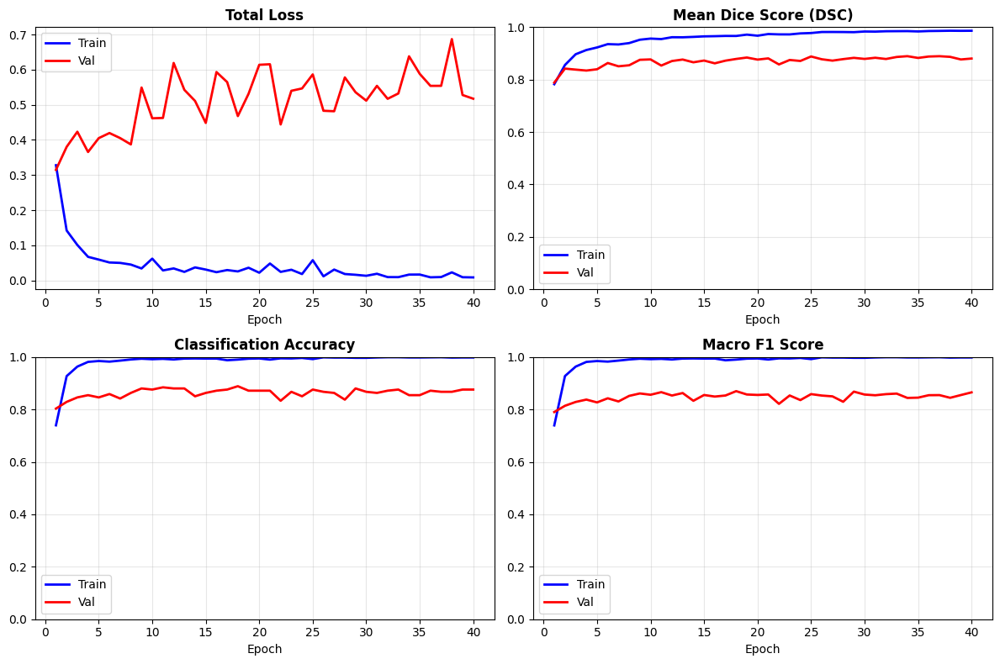


✅ STAGE 2 FINE-TUNING COMPLETE
   • Final Best Score: 0.8771
   • Checkpoint saved: best_model.pth
   • Model ready for testing

💡 Next: Run Cell 3 for comprehensive test set evaluation


In [10]:
"""
CELL 2B: STAGE 2 TRAINING (END-TO-END FINE-TUNING)
===================================================
Trains the ENTIRE model with unfrozen encoder for ultrasound adaptation.

Strategy: Transfer Learning Stage 2
- Unfreeze: All layers (End-to-End)
- Learning Rate: 5e-5 (Low LR to preserve pretrained features)
- Loss Weighting: 0.6 Seg + 0.4 Cls (Combined Loss)
- Class Weights: [1.0, 1.0, 3.0] (Penalize missing Malignant cases 3x more)
- STOPPING CRITERIA: Composite Score (0.6*DSC + 0.4*F1) -> Maximizes BOTH tasks.

Prerequisites:
- Run Cell 1 (DataLoaders)
- Run Cell 2A (Stage 1 Warm-up)
"""

import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from tqdm.auto import tqdm

print("="*80)
print("CELL 2B: STAGE 2 TRAINING (END-TO-END FINE-TUNING)")
print("="*80 + "\n")

# ================================
# METRICS WITH DSC & NSD
# ================================
def compute_dice_coefficient(pred_mask, true_mask, num_classes=3):
    """Compute Dice Similarity Coefficient per class."""
    dice_scores = []

    for cls in range(num_classes):
        pred_cls = (pred_mask == cls).astype(np.float32)
        true_cls = (true_mask == cls).astype(np.float32)

        intersection = (pred_cls * true_cls).sum()
        denominator = pred_cls.sum() + true_cls.sum()

        if denominator == 0:
            dice = 1.0 if intersection == 0 else 0.0
        else:
            dice = (2.0 * intersection) / denominator

        dice_scores.append(dice)

    return dice_scores


def compute_full_metrics(seg_preds, seg_targets, cls_preds, cls_targets):
    """Compute comprehensive metrics including DSC."""
    metrics = {}

    # Classification
    cls_acc = accuracy_score(cls_targets, cls_preds)
    _, _, cls_f1, _ = precision_recall_fscore_support(
        cls_targets, cls_preds, average='macro', zero_division=0
    )

    metrics['cls_accuracy'] = cls_acc
    metrics['macro_f1'] = cls_f1

    # Dice Score
    all_dice = []
    for pred, target in zip(seg_preds, seg_targets):
        dice_scores = compute_dice_coefficient(pred, target)
        all_dice.append(dice_scores)

    all_dice = np.array(all_dice)
    metrics['mean_dsc'] = np.mean(all_dice)
    metrics['dsc_background'] = np.mean(all_dice[:, 0])
    metrics['dsc_benign'] = np.mean(all_dice[:, 1])
    metrics['dsc_malignant'] = np.mean(all_dice[:, 2])

    return metrics


# ================================
# TRAINING WITH AMP
# ================================
def train_epoch_stage2(model, loader, seg_criterion, cls_criterion, optimizer, scaler, device, alpha=0.6):
    """Train one epoch with combined loss."""
    model.train()

    total_loss = 0.0
    all_seg_preds = []
    all_seg_targets = []
    all_cls_preds = []
    all_cls_targets = []

    pbar = tqdm(loader, desc='Training', leave=False)
    for images, masks, labels in pbar:
        images = images.to(device)
        masks = masks.to(device).long().squeeze(1)
        labels = labels.to(device)

        optimizer.zero_grad()

        with torch.amp.autocast(device_type='cuda'):
            seg_logits, cls_logits = model(images)
            seg_loss = seg_criterion(seg_logits, masks)
            cls_loss = cls_criterion(cls_logits, labels)
            # Combined Loss used for Backprop
            loss = alpha * seg_loss + (1 - alpha) * cls_loss

        scaler.scale(loss).backward()

        # Gradient clipping for stability
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        scaler.step(optimizer)
        scaler.update()

        total_loss += loss.item()

        seg_preds = torch.argmax(seg_logits, dim=1).cpu().numpy()
        cls_preds = torch.argmax(cls_logits, dim=1).cpu().numpy()

        all_seg_preds.append(seg_preds)
        all_seg_targets.append(masks.cpu().numpy())
        all_cls_preds.append(cls_preds)
        all_cls_targets.append(labels.cpu().numpy())

        pbar.set_postfix({'loss': f'{loss.item():.4f}'})

    all_seg_preds = np.concatenate(all_seg_preds)
    all_seg_targets = np.concatenate(all_seg_targets)
    all_cls_preds = np.concatenate(all_cls_preds)
    all_cls_targets = np.concatenate(all_cls_targets)

    metrics = compute_full_metrics(all_seg_preds, all_seg_targets, all_cls_preds, all_cls_targets)
    avg_loss = total_loss / len(loader)

    return avg_loss, metrics


def validate_epoch_stage2(model, loader, seg_criterion, cls_criterion, device, alpha=0.6):
    """Validate one epoch."""
    model.eval()

    total_loss = 0.0
    all_seg_preds = []
    all_seg_targets = []
    all_cls_preds = []
    all_cls_targets = []

    with torch.no_grad():
        pbar = tqdm(loader, desc='Validation', leave=False)
        for images, masks, labels in pbar:
            images = images.to(device)
            masks = masks.to(device).long().squeeze(1)
            labels = labels.to(device)

            with torch.amp.autocast(device_type='cuda'):
                seg_logits, cls_logits = model(images)
                seg_loss = seg_criterion(seg_logits, masks)
                cls_loss = cls_criterion(cls_logits, labels)
                loss = alpha * seg_loss + (1 - alpha) * cls_loss

            total_loss += loss.item()

            seg_preds = torch.argmax(seg_logits, dim=1).cpu().numpy()
            cls_preds = torch.argmax(cls_logits, dim=1).cpu().numpy()

            all_seg_preds.append(seg_preds)
            all_seg_targets.append(masks.cpu().numpy())
            all_cls_preds.append(cls_preds)
            all_cls_targets.append(labels.cpu().numpy())

            pbar.set_postfix({'loss': f'{loss.item():.4f}'})

    all_seg_preds = np.concatenate(all_seg_preds)
    all_seg_targets = np.concatenate(all_seg_targets)
    all_cls_preds = np.concatenate(all_cls_preds)
    all_cls_targets = np.concatenate(all_cls_targets)

    metrics = compute_full_metrics(all_seg_preds, all_seg_targets, all_cls_preds, all_cls_targets)
    avg_loss = total_loss / len(loader)

    return avg_loss, metrics


# ================================
# VISUALIZATION
# ================================
def plot_training_curves(history):
    """Plot training curves."""
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))

    epochs = range(1, len(history['train_loss']) + 1)

    # Loss
    axes[0, 0].plot(epochs, history['train_loss'], 'b-', label='Train', linewidth=2)
    axes[0, 0].plot(epochs, history['val_loss'], 'r-', label='Val', linewidth=2)
    axes[0, 0].set_title('Total Loss', fontweight='bold')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)

    # DSC
    axes[0, 1].plot(epochs, history['train_dsc'], 'b-', label='Train', linewidth=2)
    axes[0, 1].plot(epochs, history['val_dsc'], 'r-', label='Val', linewidth=2)
    axes[0, 1].set_title('Mean Dice Score (DSC)', fontweight='bold')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylim([0, 1])
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)

    # Classification Accuracy
    axes[1, 0].plot(epochs, history['train_acc'], 'b-', label='Train', linewidth=2)
    axes[1, 0].plot(epochs, history['val_acc'], 'r-', label='Val', linewidth=2)
    axes[1, 0].set_title('Classification Accuracy', fontweight='bold')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylim([0, 1])
    axes[1, 0].legend()
    axes[1, 0].grid(True, alpha=0.3)

    # Macro F1
    axes[1, 1].plot(epochs, history['train_f1'], 'b-', label='Train', linewidth=2)
    axes[1, 1].plot(epochs, history['val_f1'], 'r-', label='Val', linewidth=2)
    axes[1, 1].set_title('Macro F1 Score', fontweight='bold')
    axes[1, 1].set_xlabel('Epoch')
    axes[1, 1].set_ylim([0, 1])
    axes[1, 1].legend()
    axes[1, 1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()


# ================================
# MAIN STAGE 2 EXECUTION
# ================================
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"💻 Device: {device}\n")

# Load Stage 1 checkpoint
print("📥 Loading Stage 1 warm-up checkpoint...")
try:
    checkpoint = torch.load('stage1_warmup.pth', map_location=device, weights_only=False)
    print(f"   ✓ Loaded checkpoint from Stage 1 (Epoch {checkpoint['epoch']+1})")
    print(f"   ✓ Stage 1 best val loss: {checkpoint['val_loss']:.4f}\n")
except FileNotFoundError:
    print("   ❌ Error: stage1_warmup.pth not found!")
    print("   Please run Cell 2A (Stage 1) first.\n")
    raise

# Initialize model
print("🔧 Initializing model...")
model = MultiTaskAttentionUNet(num_classes=3, pretrained=True, use_attention=True).to(device)
model.load_state_dict(checkpoint['model_state_dict'])
print("   ✓ Loaded Stage 1 weights\n")

# ================================
# UNFREEZE ALL LAYERS (CRITICAL)
# ================================
print("🔓 UNFREEZING ALL LAYERS (Stage 2 strategy):")
for param in model.parameters():
    param.requires_grad = True

trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
total_params = sum(p.numel() for p in model.parameters())

print(f"   • Total parameters: {total_params:,}")
print(f"   • Trainable: {trainable_params:,}")
print(f"   • Training: 100% of model (end-to-end)\n")

# ================================
# WEIGHTED LOSS (PENALTY FIX)
# ================================
# Normal: 1.0, Benign: 1.0, Malignant: 3.0
# We punish missing a Malignant case 3x more than other errors.
print("⚖️  Applying Weighted Loss (Penalty for missing Malignant cases)...")
class_weights = torch.tensor([1.0, 1.0, 3.0]).to(device)

seg_criterion = nn.CrossEntropyLoss(weight=class_weights)
cls_criterion = nn.CrossEntropyLoss(weight=class_weights)
print("   ✓ Class weights set to [1.0, 1.0, 3.0]")

# Training setup
optimizer = torch.optim.Adam(model.parameters(), lr=5e-5, weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='max', factor=0.5, patience=5) # Mode='max' for Score
scaler = torch.amp.GradScaler('cuda')

NUM_EPOCHS = 40
ALPHA = 0.6  # Weighting for Composite Score
BEST_SCORE = 0.0 # Initializing Score
PATIENCE = 15
epochs_no_improve = 0

# History tracking
history = {
    'train_loss': [], 'val_loss': [],
    'train_dsc': [], 'val_dsc': [],
    'train_acc': [], 'val_acc': [],
    'train_f1': [], 'val_f1': []
}

print("⚙️  Stage 2 Configuration:")
print(f"   • Learning rate: 5e-5 (very low for fine-tuning)")
print(f"   • Max epochs: {NUM_EPOCHS}")
print(f"   • Early stopping patience: {PATIENCE}")
print(f"   • Stopping Criterion: Composite Score (0.6*DSC + 0.4*F1)")
print(f"   • Loss weighting: α={ALPHA} (Combined Loss)")
print(f"   • Mixed precision: Enabled (AMP)")
print(f"   • Estimated time: ~15-20 minutes\n")

print("="*80)
print("STARTING STAGE 2 FINE-TUNING")
print("="*80 + "\n")

start_time = time.time()

for epoch in range(NUM_EPOCHS):
    print(f"{'='*80}")
    print(f"EPOCH {epoch+1}/{NUM_EPOCHS}")
    print(f"{'='*80}")

    # Train
    train_loss, train_metrics = train_epoch_stage2(
        model, train_loader, seg_criterion, cls_criterion, optimizer, scaler, device, ALPHA
    )

    # Validate
    val_loss, val_metrics = validate_epoch_stage2(
        model, val_loader, seg_criterion, cls_criterion, device, ALPHA
    )

    # =========================================================
    # CALCULATE COMPOSITE SCORE (Segmentation + Diagnosis)
    # =========================================================
    current_score = (ALPHA * val_metrics['mean_dsc']) + ((1 - ALPHA) * val_metrics['macro_f1'])

    # Scheduler step
    scheduler.step(current_score)

    # Save history
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    history['train_dsc'].append(train_metrics['mean_dsc'])
    history['val_dsc'].append(val_metrics['mean_dsc'])
    history['train_acc'].append(train_metrics['cls_accuracy'])
    history['val_acc'].append(val_metrics['cls_accuracy'])
    history['train_f1'].append(train_metrics['macro_f1'])
    history['val_f1'].append(val_metrics['macro_f1'])

    # Print metrics
    print(f"\n📊 Epoch {epoch+1} Results:")
    print(f"   Loss:         Train={train_loss:.4f}, Val={val_loss:.4f}")
    print(f"   Composite:    SCORE={current_score:.4f} (Max is Best)")
    print(f"   Mean DSC:     Train={train_metrics['mean_dsc']:.4f}, Val={val_metrics['mean_dsc']:.4f}")
    print(f"   Macro F1:     Train={train_metrics['macro_f1']:.4f}, Val={val_metrics['macro_f1']:.4f}")
    print(f"   DSC Benign:   Train={train_metrics['dsc_benign']:.4f}, Val={val_metrics['dsc_benign']:.4f}")
    print(f"   DSC Malignant:Train={train_metrics['dsc_malignant']:.4f}, Val={val_metrics['dsc_malignant']:.4f}")

    # =========================================================
    # SAVE MODEL IF COMPOSITE SCORE IMPROVES
    # =========================================================
    if current_score > BEST_SCORE:
        BEST_SCORE = current_score
        epochs_no_improve = 0
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_loss': val_loss,
            'val_metrics': val_metrics,
            'train_metrics': train_metrics,
            'best_score': BEST_SCORE
        }, 'best_model.pth')
        print(f"   ✅ Best model saved! (Score: {BEST_SCORE:.4f})")
    else:
        epochs_no_improve += 1
        print(f"   ⏳ No improvement for {epochs_no_improve}/{PATIENCE} epochs (Best: {BEST_SCORE:.4f})")

    # Early stopping
    if epochs_no_improve >= PATIENCE:
        print(f"\n⚠️  Early stopping triggered after {epoch+1} epochs")
        break

    print()

elapsed = time.time() - start_time
print(f"{'='*80}")
print(f"⏱️  Stage 2 completed in {elapsed/60:.1f} minutes")
print(f"{'='*80}\n")

# Plot training curves
print("📈 Generating training curves...")
plot_training_curves(history)

print("\n✅ STAGE 2 FINE-TUNING COMPLETE")
print(f"   • Final Best Score: {BEST_SCORE:.4f}")
print(f"   • Checkpoint saved: best_model.pth")
print(f"   • Model ready for testing\n")

print("💡 Next: Run Cell 3 for comprehensive test set evaluation")

CELL 3: COMPREHENSIVE TEST SET EVALUATION

📋 Configuration:
   • Test samples: 293
   • Batch size: 16

💻 Device: cuda

📥 Loading best model...
   ✓ Model loaded successfully

STARTING TEST SET EVALUATION

🔬 Running inference on test set...


Testing:   0%|          | 0/19 [00:00<?, ?it/s]


📊 Computing comprehensive metrics...
   Computing DSC and NSD for each sample...


  0%|          | 0/293 [00:00<?, ?it/s]


✓ Evaluation completed in 12.18 seconds


                   COMPREHENSIVE TEST SET EVALUATION RESULTS                    

🎯 TRACK 1: SEGMENTATION METRICS
--------------------------------------------------------------------------------
Metric                                   Score          
--------------------------------------------------------------------------------
Mean Dice Score (DSC) - PRIMARY          0.9093
  • Background DSC                            0.9859
  • Benign DSC                                0.8458
  • Malignant DSC                             0.8963

Mean Normalized Surface Dice (NSD)       0.6233
  • Background NSD                            0.2837
  • Benign NSD                                0.7624
  • Malignant NSD                             0.8239

⚡ Inference Speed                        0.0030 sec/image

🏥 TRACK 2: DIAGNOSIS CLASSIFICATION METRICS
--------------------------------------------------------------------------------
Metric                  

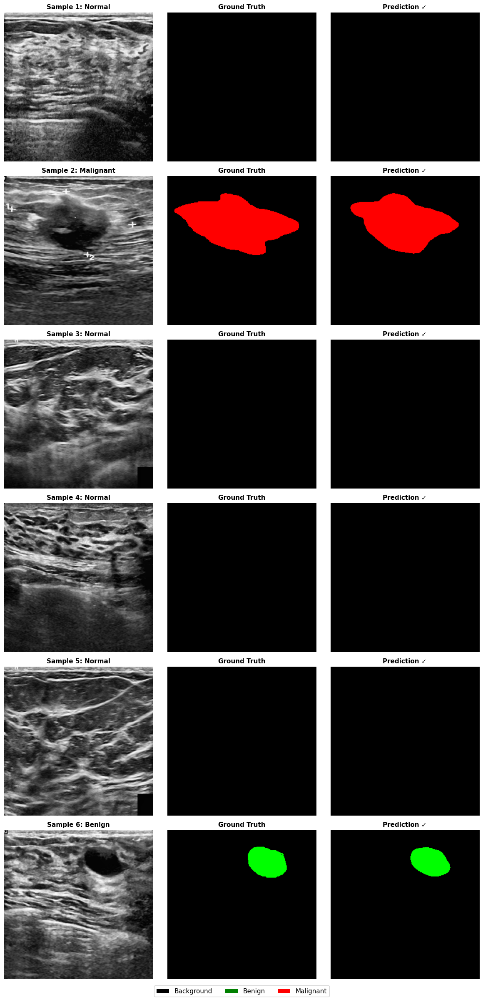


📊 2. Confusion Matrix...


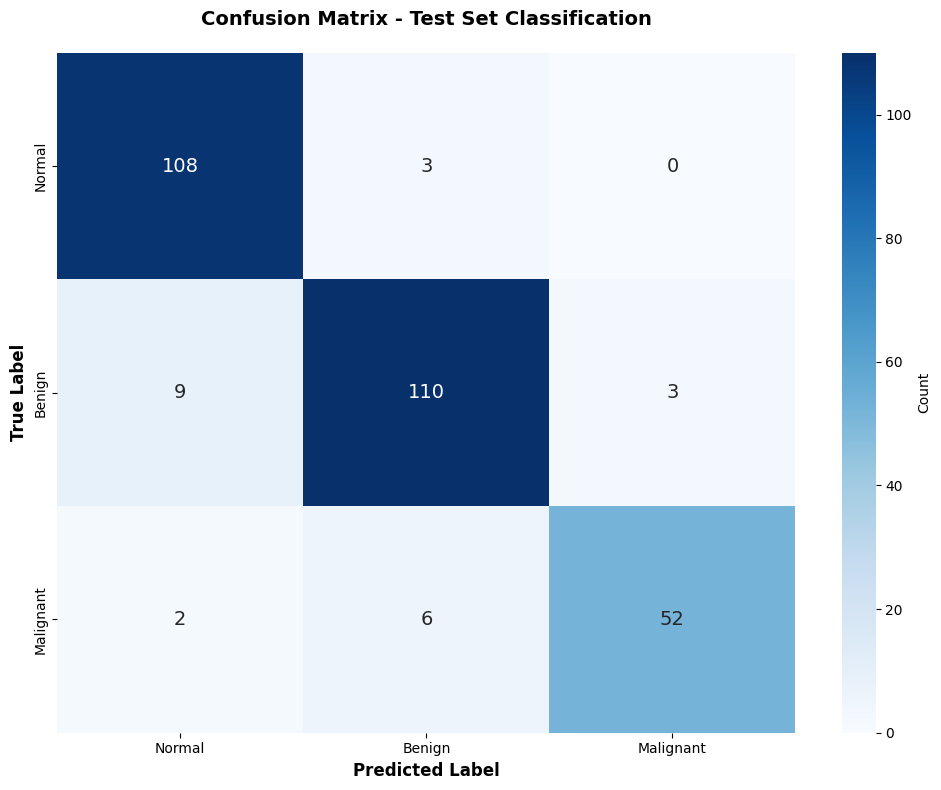


💾 Saving results...
   ✓ Metrics saved: test_metrics.csv
   ✓ Predictions saved: test_predictions.npz

✅ TEST SET EVALUATION COMPLETE

🎯 Final Results:
   • Mean DSC:        0.9093
   • Mean NSD:        0.6233
   • Macro F1:        0.9188
   • Accuracy:        0.9215


In [11]:
"""
CELL 3: COMPREHENSIVE TEST SET EVALUATION
==========================================
Evaluates best_model.pth on held-out test set with medical imaging metrics.

Metrics:
- Track 1: Mean DSC (Dice), Mean NSD (Normalized Surface Dice)
- Track 2: Macro F1, Classification Accuracy
- Error Analysis: Critical misclassifications (Malignant → Normal)

Prerequisites:
- Run Cell 1 to create test_loader
- Run Cell 2B to generate best_model.pth
"""

import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import time
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (accuracy_score, precision_recall_fscore_support,
                             confusion_matrix, classification_report)
from scipy.ndimage import distance_transform_edt
import cv2
import pandas as pd

# Prevent OpenCV threading issues
cv2.setNumThreads(0)

print("="*80)
print("CELL 3: COMPREHENSIVE TEST SET EVALUATION")
print("="*80 + "\n")

# ================================
# METRIC FUNCTIONS
# ================================
def compute_dice_coefficient(pred_mask, true_mask, num_classes=3):
    """Compute Dice Similarity Coefficient per class."""
    dice_scores = []

    for cls in range(num_classes):
        pred_cls = (pred_mask == cls).astype(np.float32)
        true_cls = (true_mask == cls).astype(np.float32)

        intersection = (pred_cls * true_cls).sum()
        denominator = pred_cls.sum() + true_cls.sum()

        if denominator == 0:
            dice = 1.0 if intersection == 0 else 0.0
        else:
            dice = (2.0 * intersection) / denominator

        dice_scores.append(dice)

    return {
        'dsc_background': dice_scores[0],
        'dsc_benign': dice_scores[1],
        'dsc_malignant': dice_scores[2],
        'mean_dsc': np.mean(dice_scores)
    }


def compute_normalized_surface_dice(pred_mask, true_mask, num_classes=3, tolerance=2.0):
    """
    Compute Normalized Surface Dice (NSD) - measures boundary accuracy.

    This is a critical metric for medical imaging as it evaluates how well
    the predicted boundaries match the ground truth boundaries.
    """
    nsd_scores = []

    for cls in range(num_classes):
        pred_cls = (pred_mask == cls).astype(np.uint8)
        true_cls = (true_mask == cls).astype(np.uint8)

        # Handle edge cases
        if pred_cls.sum() == 0 and true_cls.sum() == 0:
            nsd_scores.append(1.0)
            continue

        if pred_cls.sum() == 0 or true_cls.sum() == 0:
            nsd_scores.append(0.0)
            continue

        # Compute borders
        pred_border = pred_cls - cv2.erode(pred_cls, np.ones((3, 3), np.uint8))
        true_border = true_cls - cv2.erode(true_cls, np.ones((3, 3), np.uint8))

        # Distance transforms
        dt_pred = distance_transform_edt(~pred_border.astype(bool))
        dt_true = distance_transform_edt(~true_border.astype(bool))

        # Surface points
        pred_surface = np.stack(np.where(pred_border > 0), axis=1)
        true_surface = np.stack(np.where(true_border > 0), axis=1)

        if len(pred_surface) == 0 or len(true_surface) == 0:
            nsd_scores.append(0.0)
            continue

        # NSD computation
        pred_to_true = dt_true[pred_surface[:, 0], pred_surface[:, 1]]
        true_to_pred = dt_pred[true_surface[:, 0], true_surface[:, 1]]

        pred_overlap = (pred_to_true <= tolerance).sum()
        true_overlap = (true_to_pred <= tolerance).sum()

        nsd = (pred_overlap + true_overlap) / (len(pred_surface) + len(true_surface))
        nsd_scores.append(nsd)

    return {
        'nsd_background': nsd_scores[0],
        'nsd_benign': nsd_scores[1],
        'nsd_malignant': nsd_scores[2],
        'mean_nsd': np.mean(nsd_scores)
    }


def compute_comprehensive_metrics(seg_preds, seg_targets, cls_preds, cls_targets):
    """Compute all medical imaging metrics."""
    metrics = {}

    # Classification metrics
    cls_acc = accuracy_score(cls_targets, cls_preds)
    cls_prec, cls_rec, cls_f1, _ = precision_recall_fscore_support(
        cls_targets, cls_preds, average='macro', zero_division=0
    )

    # Per-class metrics
    cls_prec_per, cls_rec_per, cls_f1_per, _ = precision_recall_fscore_support(
        cls_targets, cls_preds, average=None, zero_division=0, labels=[0, 1, 2]
    )

    metrics['cls_accuracy'] = cls_acc
    metrics['cls_precision'] = cls_prec
    metrics['cls_recall'] = cls_rec
    metrics['macro_f1'] = cls_f1
    metrics['cls_f1_normal'] = cls_f1_per[0]
    metrics['cls_f1_benign'] = cls_f1_per[1]
    metrics['cls_f1_malignant'] = cls_f1_per[2]

    # Segmentation metrics (DSC, NSD)
    all_dsc = []
    all_nsd = []

    print("   Computing DSC and NSD for each sample...")
    for pred, target in tqdm(zip(seg_preds, seg_targets), total=len(seg_preds), leave=False):
        dsc_result = compute_dice_coefficient(pred, target)
        all_dsc.append(dsc_result)

        nsd_result = compute_normalized_surface_dice(pred, target)
        all_nsd.append(nsd_result)

    # Average across samples
    metrics['mean_dsc'] = np.mean([d['mean_dsc'] for d in all_dsc])
    metrics['dsc_background'] = np.mean([d['dsc_background'] for d in all_dsc])
    metrics['dsc_benign'] = np.mean([d['dsc_benign'] for d in all_dsc])
    metrics['dsc_malignant'] = np.mean([d['dsc_malignant'] for d in all_dsc])

    metrics['mean_nsd'] = np.mean([n['mean_nsd'] for n in all_nsd])
    metrics['nsd_background'] = np.mean([n['nsd_background'] for n in all_nsd])
    metrics['nsd_benign'] = np.mean([n['nsd_benign'] for n in all_nsd])
    metrics['nsd_malignant'] = np.mean([n['nsd_malignant'] for n in all_nsd])

    return metrics


# ================================
# TEST EVALUATION
# ================================
def evaluate_test_set(model, test_loader, device):
    """Comprehensive test set evaluation."""
    model.eval()

    all_seg_preds = []
    all_seg_targets = []
    all_cls_preds = []
    all_cls_targets = []
    all_images = []
    all_filenames = []

    inference_times = []

    print("🔬 Running inference on test set...")

    with torch.no_grad():
        pbar = tqdm(test_loader, desc='Testing')
        for batch_idx, (images, masks, labels) in enumerate(pbar):
            images = images.to(device)
            masks = masks.to(device).long().squeeze(1)
            labels = labels.to(device)

            # Track inference time
            if torch.cuda.is_available():
                torch.cuda.synchronize()
            start_time = time.time()

            # Forward pass
            with torch.amp.autocast(device_type='cuda'):
                seg_logits, cls_logits = model(images)

            if torch.cuda.is_available():
                torch.cuda.synchronize()
            batch_time = time.time() - start_time
            inference_times.append(batch_time / images.size(0))

            # Predictions
            seg_preds = torch.argmax(seg_logits, dim=1).cpu().numpy()
            cls_preds = torch.argmax(cls_logits, dim=1).cpu().numpy()

            all_seg_preds.append(seg_preds)
            all_seg_targets.append(masks.cpu().numpy())
            all_cls_preds.append(cls_preds)
            all_cls_targets.append(labels.cpu().numpy())
            all_images.append(images.cpu())

            # Store batch indices for filename mapping
            batch_start = batch_idx * test_loader.batch_size
            batch_end = batch_start + images.size(0)
            all_filenames.extend(range(batch_start, batch_end))

    # Concatenate
    all_seg_preds = np.concatenate(all_seg_preds)
    all_seg_targets = np.concatenate(all_seg_targets)
    all_cls_preds = np.concatenate(all_cls_preds)
    all_cls_targets = np.concatenate(all_cls_targets)
    all_images = torch.cat(all_images, dim=0)

    # Compute metrics
    print("\n📊 Computing comprehensive metrics...")
    metrics = compute_comprehensive_metrics(
        all_seg_preds, all_seg_targets, all_cls_preds, all_cls_targets
    )

    # Inference speed
    metrics['inference_speed'] = np.mean(inference_times)
    metrics['inference_speed_std'] = np.std(inference_times)

    # Store predictions
    predictions = {
        'images': all_images,
        'seg_preds': all_seg_preds,
        'seg_targets': all_seg_targets,
        'cls_preds': all_cls_preds,
        'cls_targets': all_cls_targets,
        'filenames': all_filenames
    }

    return metrics, predictions


# ================================
# ERROR ANALYSIS
# ================================
def analyze_critical_errors(predictions, test_dataset):
    """
    Analyze critical misclassifications.

    Focus: Malignant cases misclassified as Normal (highest risk)
    """
    print("\n" + "="*80)
    print("CRITICAL ERROR ANALYSIS")
    print("="*80 + "\n")

    cls_preds = predictions['cls_preds']
    cls_targets = predictions['cls_targets']
    filenames_idx = predictions['filenames']

    # Class mapping
    class_names = {0: 'Normal', 1: 'Benign', 2: 'Malignant'}

    # Find all errors
    errors = cls_preds != cls_targets
    error_indices = np.where(errors)[0]

    print(f"📋 Total misclassifications: {len(error_indices)} / {len(cls_targets)} "
          f"({len(error_indices)/len(cls_targets)*100:.1f}%)\n")

    if len(error_indices) == 0:
        print("✅ Perfect classification! No errors found.")
        return

    # Analyze by type
    error_types = {}
    for idx in error_indices:
        true_class = class_names[cls_targets[idx]]
        pred_class = class_names[cls_preds[idx]]
        error_type = f"{true_class} → {pred_class}"

        if error_type not in error_types:
            error_types[error_type] = []

        error_types[error_type].append(idx)

    # Print error breakdown
    print("🔍 Error Breakdown by Type:")
    print("-" * 80)
    for error_type, indices in sorted(error_types.items()):
        print(f"   {error_type}: {len(indices)} cases")

    # Critical errors: Malignant misclassified as Normal
    critical_errors = error_types.get('Malignant → Normal', [])

    if len(critical_errors) > 0:
        print(f"\n⚠️  CRITICAL ERRORS: Malignant → Normal ({len(critical_errors)} cases)")
        print("-" * 80)
        print("These are high-risk false negatives that could delay treatment.\n")

        print(f"{'Index':<8} {'Filename':<40} {'True':<12} {'Predicted':<12}")
        print("-" * 80)

        for idx in critical_errors[:10]:  # Show first 10
            # Get filename from metadata
            try:
                file_idx = filenames_idx[idx]
                img_path = test_dataset.metadata.loc[file_idx, 'image_path']
                filename = img_path.split('/')[-1]
            except:
                filename = f"sample_{idx}"

            print(f"{idx:<8} {filename:<40} {'Malignant':<12} {'Normal':<12}")

        if len(critical_errors) > 10:
            print(f"... and {len(critical_errors) - 10} more")
    else:
        print(f"\n✅ No critical errors: No malignant cases misclassified as normal")

    # Other concerning errors: Malignant → Benign
    concerning_errors = error_types.get('Malignant → Benign', [])

    if len(concerning_errors) > 0:
        print(f"\n⚠️  Concerning Errors: Malignant → Benign ({len(concerning_errors)} cases)")
        print("These underestimate cancer severity.\n")

    print("\n" + "="*80)


# ================================
# VISUALIZATION
# ================================
def plot_predictions_with_errors(images, masks_true, masks_pred, cls_true, cls_pred, num_samples=6):
    """Visualize predictions with classification results."""
    num_samples = min(num_samples, len(images))
    fig, axes = plt.subplots(num_samples, 3, figsize=(12, 4 * num_samples))

    if num_samples == 1:
        axes = axes.reshape(1, -1)

    class_colors = {0: [0, 0, 0], 1: [0, 255, 0], 2: [255, 0, 0]}
    class_names = {0: 'Normal', 1: 'Benign', 2: 'Malignant'}

    for i in range(num_samples):
        # Input
        img = images[i].numpy()
        if img.shape[0] == 3:
            img = np.transpose(img, (1, 2, 0))
        else:
            img = img[0]

        is_correct = cls_true[i] == cls_pred[i]
        border_color = 'green' if is_correct else 'red'

        axes[i, 0].imshow(img, cmap='gray' if len(img.shape) == 2 else None)
        axes[i, 0].set_title(f'Sample {i+1}: {class_names[cls_true[i]]}',
                            fontsize=11, fontweight='bold')
        axes[i, 0].axis('off')
        for spine in axes[i, 0].spines.values():
            spine.set_edgecolor(border_color)
            spine.set_linewidth(3)

        # Ground Truth
        mask_true_colored = np.zeros((*masks_true[i].shape, 3), dtype=np.uint8)
        for cls, color in class_colors.items():
            mask_true_colored[masks_true[i] == cls] = color

        axes[i, 1].imshow(mask_true_colored)
        axes[i, 1].set_title('Ground Truth', fontsize=11, fontweight='bold')
        axes[i, 1].axis('off')

        # Prediction
        mask_pred_colored = np.zeros((*masks_pred[i].shape, 3), dtype=np.uint8)
        for cls, color in class_colors.items():
            mask_pred_colored[masks_pred[i] == cls] = color

        axes[i, 2].imshow(mask_pred_colored)
        status = '✓' if is_correct else f'✗ → {class_names[cls_pred[i]]}'
        axes[i, 2].set_title(f'Prediction {status}', fontsize=11, fontweight='bold')
        axes[i, 2].axis('off')

    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='black', label='Background'),
        Patch(facecolor='green', label='Benign'),
        Patch(facecolor='red', label='Malignant')
    ]
    fig.legend(handles=legend_elements, loc='lower center', ncol=3, fontsize=11)

    plt.tight_layout()
    plt.subplots_adjust(bottom=0.02)
    plt.show()


def plot_confusion_matrix(y_true, y_pred, classes):
    """Plot confusion matrix."""
    cm = confusion_matrix(y_true, y_pred)

    fig, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=classes, yticklabels=classes,
                cbar_kws={'label': 'Count'}, ax=ax, annot_kws={'size': 14})

    ax.set_title('Confusion Matrix - Test Set Classification',
                 fontsize=14, fontweight='bold', pad=20)
    ax.set_ylabel('True Label', fontsize=12, fontweight='bold')
    ax.set_xlabel('Predicted Label', fontsize=12, fontweight='bold')

    plt.tight_layout()
    plt.show()


def print_detailed_metrics(metrics):
    """Print comprehensive metrics."""
    print("\n" + "="*80)
    print("COMPREHENSIVE TEST SET EVALUATION RESULTS".center(80))
    print("="*80)

    # Track 1: Segmentation
    print("\n🎯 TRACK 1: SEGMENTATION METRICS")
    print("-" * 80)
    print(f"{'Metric':<40} {'Score':<15}")
    print("-" * 80)

    print(f"{'Mean Dice Score (DSC) - PRIMARY':<40} {metrics['mean_dsc']:.4f}")
    print(f"  • Background DSC{'':<27} {metrics['dsc_background']:.4f}")
    print(f"  • Benign DSC{'':<31} {metrics['dsc_benign']:.4f}")
    print(f"  • Malignant DSC{'':<28} {metrics['dsc_malignant']:.4f}")

    print(f"\n{'Mean Normalized Surface Dice (NSD)':<40} {metrics['mean_nsd']:.4f}")
    print(f"  • Background NSD{'':<27} {metrics['nsd_background']:.4f}")
    print(f"  • Benign NSD{'':<31} {metrics['nsd_benign']:.4f}")
    print(f"  • Malignant NSD{'':<28} {metrics['nsd_malignant']:.4f}")

    print(f"\n{'⚡ Inference Speed':<40} {metrics['inference_speed']:.4f} sec/image")

    # Track 2: Classification
    print("\n🏥 TRACK 2: DIAGNOSIS CLASSIFICATION METRICS")
    print("-" * 80)
    print(f"{'Metric':<40} {'Score':<15}")
    print("-" * 80)

    print(f"{'Macro F1 Score - PRIMARY':<40} {metrics['macro_f1']:.4f}")
    print(f"{'Overall Accuracy':<40} {metrics['cls_accuracy']:.4f}")
    print(f"{'Precision (Macro)':<40} {metrics['cls_precision']:.4f}")
    print(f"{'Recall (Macro)':<40} {metrics['cls_recall']:.4f}")

    print(f"\n{'Per-Class F1 Scores:':<40}")
    print(f"  • Normal{'':<33} {metrics['cls_f1_normal']:.4f}")
    print(f"  • Benign{'':<33} {metrics['cls_f1_benign']:.4f}")
    print(f"  • Malignant{'':<30} {metrics['cls_f1_malignant']:.4f}")

    print("\n" + "="*80)

    # Summary
    print("\n┌" + "─"*78 + "┐")
    print("│" + " SUMMARY - CHALLENGE METRICS ".center(78) + "│")
    print("├" + "─"*78 + "┤")
    print(f"│  Track 1 - Mean DSC:          {metrics['mean_dsc']:.4f}" + " "*37 + "│")
    print(f"│  Track 1 - Mean NSD:          {metrics['mean_nsd']:.4f}" + " "*37 + "│")
    print(f"│  Track 2 - Macro F1:          {metrics['macro_f1']:.4f}" + " "*37 + "│")
    print(f"│  Inference Speed:             {metrics['inference_speed']:.4f} sec/image" + " "*27 + "│")
    print("└" + "─"*78 + "┘\n")


# ================================
# MAIN EXECUTION
# ================================
print("📋 Configuration:")
print(f"   • Test samples: {len(test_loader.dataset)}")
print(f"   • Batch size: {test_loader.batch_size}\n")

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"💻 Device: {device}\n")

# Load model
print("📥 Loading best model...")
try:
    checkpoint = torch.load('best_model.pth', map_location=device, weights_only=False)

    model = MultiTaskAttentionUNet(num_classes=3, pretrained=False, use_attention=True).to(device)

    if 'model_state_dict' in checkpoint:
        model.load_state_dict(checkpoint['model_state_dict'])
    else:
        model.load_state_dict(checkpoint)

    print("   ✓ Model loaded successfully\n")
except FileNotFoundError:
    print("   ❌ Error: best_model.pth not found!")
    raise

# Evaluate
print("="*80)
print("STARTING TEST SET EVALUATION")
print("="*80 + "\n")

start_time = time.time()
test_metrics, predictions = evaluate_test_set(model, test_loader, device)
eval_time = time.time() - start_time

print(f"\n✓ Evaluation completed in {eval_time:.2f} seconds\n")

# Print metrics
print_detailed_metrics(test_metrics)

# Classification report
print("\n📋 DETAILED CLASSIFICATION REPORT")
print("="*80)
classes = ['Normal', 'Benign', 'Malignant']
report = classification_report(predictions['cls_targets'], predictions['cls_preds'],
                               target_names=classes, digits=4)
print(report)
print("="*80)

# Error analysis
analyze_critical_errors(predictions, test_dataset)

# Visualizations
print("\n" + "="*80)
print("GENERATING VISUALIZATIONS")
print("="*80 + "\n")

# Sample predictions
print("🎨 1. Sample Predictions...")
sample_indices = np.random.choice(len(predictions['images']), size=min(6, len(predictions['images'])), replace=False)
plot_predictions_with_errors(
    predictions['images'][sample_indices],
    predictions['seg_targets'][sample_indices],
    predictions['seg_preds'][sample_indices],
    predictions['cls_targets'][sample_indices],
    predictions['cls_preds'][sample_indices],
    num_samples=6
)

# Confusion matrix
print("\n📊 2. Confusion Matrix...")
plot_confusion_matrix(predictions['cls_targets'], predictions['cls_preds'], classes)

# Save results
print("\n💾 Saving results...")
metrics_df = pd.DataFrame([test_metrics])
metrics_df.to_csv('test_metrics.csv', index=False)
print("   ✓ Metrics saved: test_metrics.csv")

np.savez('test_predictions.npz',
         seg_preds=predictions['seg_preds'],
         seg_targets=predictions['seg_targets'],
         cls_preds=predictions['cls_preds'],
         cls_targets=predictions['cls_targets'])
print("   ✓ Predictions saved: test_predictions.npz")

print("\n" + "="*80)
print("✅ TEST SET EVALUATION COMPLETE")
print("="*80)
print(f"\n🎯 Final Results:")
print(f"   • Mean DSC:        {test_metrics['mean_dsc']:.4f}")
print(f"   • Mean NSD:        {test_metrics['mean_nsd']:.4f}")
print(f"   • Macro F1:        {test_metrics['macro_f1']:.4f}")
print(f"   • Accuracy:        {test_metrics['cls_accuracy']:.4f}")
print("="*80)